In [1]:
import tensorflow as tf

import networkx as nx
from networkx.drawing.nx_pydot import write_dot
import matplotlib.pyplot as plt
from IPython.display import SVG
from sklearn.tree import export_graphviz
tf.debugging.set_log_device_placement(True)

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf

from tensorflow.keras import layers
from sklearn import datasets
import pandas as pd
import numpy as np
print(tf.__version__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))



2.0.0
Num GPUs Available:  2


In [3]:

import matplotlib.pyplot as plt # For making plots

import seaborn as sns # Makes beautiful plots
from sklearn.preprocessing import StandardScaler # Testing sklearn
import tensorflow # Imports tensorflow
import keras # Imports keras

Using TensorFlow backend.


In [4]:
from tensorflow.python.platform import build_info as tf_build_info
print(tf_build_info.cuda_version_number)
# 9.0 in v1.10.0
print(tf_build_info.cudnn_version_number)
# 7 in v1.10.0

10.0
7.6


In [5]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 17790659524740346848, name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 6614766059
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 7719459517385052427
 physical_device_desc: "device: 0, name: GeForce RTX 2070, pci bus id: 0000:17:00.0, compute capability: 7.5", name: "/device:GPU:1"
 device_type: "GPU"
 memory_limit: 6614766059
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 13212653748248570131
 physical_device_desc: "device: 1, name: GeForce RTX 2070, pci bus id: 0000:65:00.0, compute capability: 7.5"]

In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
import datetime, os

In [8]:
from tensorflow.keras.callbacks import TensorBoard

log_dir = 'logs'
tb = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
from keras.layers import Dense, Activation,Conv2D,MaxPooling2D,Flatten,Dropout

## Case Study 12

In [11]:
df = pd.read_csv('HIGGS.csv',header = None)

In [12]:
# Verify size is as expected
print("{:>25}{:>10,} x {:,}\n".format("Shape of raw data is ", df.shape[0], df.shape[1]))

    Shape of raw data is 11,000,000 x 29



In [13]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
0,1.0,0.869293,-0.635082,0.225690,0.327470,-0.689993,0.754202,-0.248573,-1.092064,0.000000,...,-0.010455,-0.045767,3.101961,1.353760,0.979563,0.978076,0.920005,0.721657,0.988751,0.876678
1,1.0,0.907542,0.329147,0.359412,1.497970,-0.313010,1.095531,-0.557525,-1.588230,2.173076,...,-1.138930,-0.000819,0.000000,0.302220,0.833048,0.985700,0.978098,0.779732,0.992356,0.798343
2,1.0,0.798835,1.470639,-1.635975,0.453773,0.425629,1.104875,1.282322,1.381664,0.000000,...,1.128848,0.900461,0.000000,0.909753,1.108330,0.985692,0.951331,0.803252,0.865924,0.780118
3,0.0,1.344385,-0.876626,0.935913,1.992050,0.882454,1.786066,-1.646778,-0.942383,0.000000,...,-0.678379,-1.360356,0.000000,0.946652,1.028704,0.998656,0.728281,0.869200,1.026736,0.957904
4,1.0,1.105009,0.321356,1.522401,0.882808,-1.205349,0.681466,-1.070464,-0.921871,0.000000,...,-0.373566,0.113041,0.000000,0.755856,1.361057,0.986610,0.838085,1.133295,0.872245,0.808487


In [14]:
df[0].describe()

count    1.100000e+07
mean     5.299203e-01
std      4.991040e-01
min      0.000000e+00
25%      0.000000e+00
50%      1.000000e+00
75%      1.000000e+00
max      1.000000e+00
Name: 0, dtype: float64

In [15]:
x1 = df.drop([0], axis = 1)

In [16]:
x1.head()

,1,2,3,4,5,6,7,8,9,10,...,19,20,21,22,23,24,25,26,27,28
0,0.869293,-0.635082,0.225690,0.327470,-0.689993,0.754202,-0.248573,-1.092064,0.000000,1.374992,...,-0.010455,-0.045767,3.101961,1.353760,0.979563,0.978076,0.920005,0.721657,0.988751,0.876678
1,0.907542,0.329147,0.359412,1.497970,-0.313010,1.095531,-0.557525,-1.588230,2.173076,0.812581,...,-1.138930,-0.000819,0.000000,0.302220,0.833048,0.985700,0.978098,0.779732,0.992356,0.798343
2,0.798835,1.470639,-1.635975,0.453773,0.425629,1.104875,1.282322,1.381664,0.000000,0.851737,...,1.128848,0.900461,0.000000,0.909753,1.108330,0.985692,0.951331,0.803252,0.865924,0.780118
3,1.344385,-0.876626,0.935913,1.992050,0.882454,1.786066,-1.646778,-0.942383,0.000000,2.423265,...,-0.678379,-1.360356,0.000000,0.946652,1.028704,0.998656,0.728281,0.869200,1.026736,0.957904
4,1.105009,0.321356,1.522401,0.882808,-1.205349,0.681466,-1.070464,-0.921871,0.000000,0.800872,...,-0.373566,0.113041,0.000000,0.755856,1.361057,0.986610,0.838085,1.133295,0.872245,0.808487


In [17]:
for col in x1.columns: 
    print(col) 

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28


In [18]:
y = df[0]

In [19]:
y = y.to_numpy()

In [20]:
y[1:20]

array([1., 1., 0., 1., 0., 1., 1., 1., 1., 1., 0., 1., 1., 1., 0., 1., 0.,
       0., 1.])

In [21]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(0,1))
scaled_train = scaler.fit_transform(x1)

# Print out the adjustment that the scaler applied to the lepton pT column of data
#print("Note: median values were scaled by multiplying by {:.10f} and adding {:.6f}".format(scaler.scale_[0],scaler.min_[0]))
#multiplied_by = scaler.scale_[0]
#added = scaler.min_[0]

scaled_train_df = pd.DataFrame(scaled_train, columns = x1.columns.values)

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline

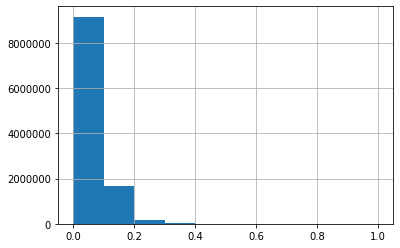

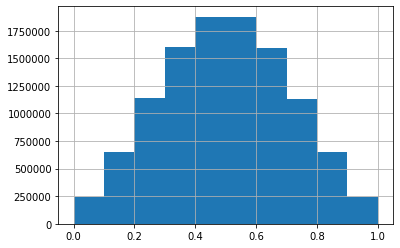

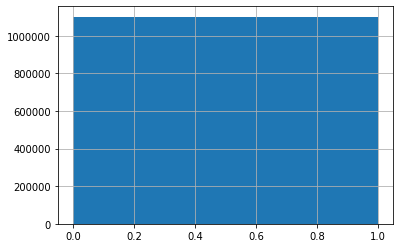

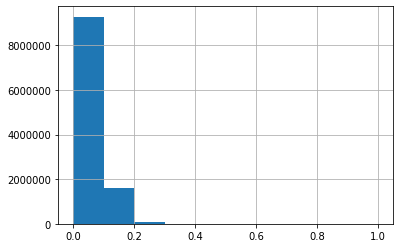

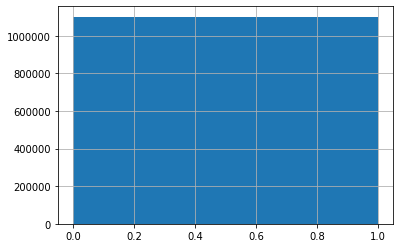

...

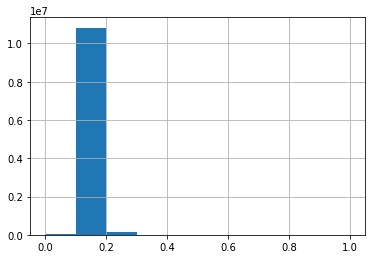

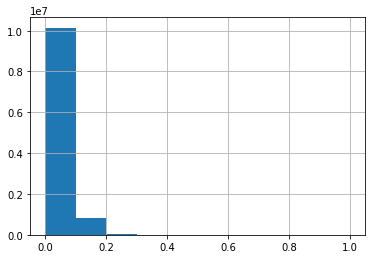

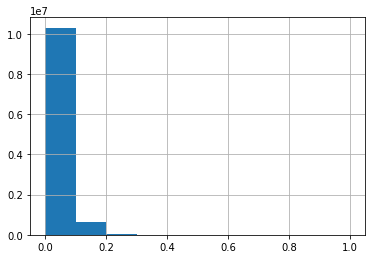

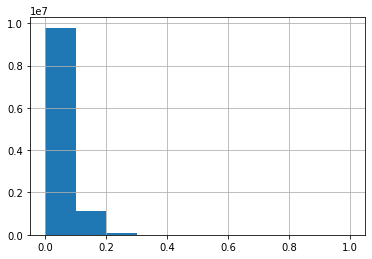

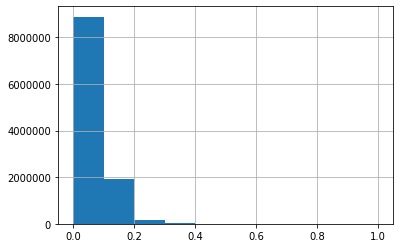

In [23]:
for i in scaled_train_df:
    scaled_train_df[i].hist()
    plt.show()

In [24]:
from keras.applications import Xception
from keras.utils import multi_gpu_model

In [25]:
mirrored_strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:1"],
                                          cross_device_ops=tf.distribute.HierarchicalCopyAllReduce())

In [26]:

with mirrored_strategy.scope():
    model_higgs = tf.keras.Sequential()
    model_higgs.add(layers.Dense(300, input_dim = 28, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(300, activation = 'tanh'))
    model_higgs.add(layers.Dense(1, activation = 'sigmoid'))
    
    model_higgs.compile(optimizer=tf.optimizers.SGD(learning_rate = 0.01, decay = 0.00001),
             loss=tf.keras.losses.BinaryCrossentropy(),
             metrics=['accuracy'])
    
    log_dir = 'higgs_logs'
    tb_higgs = TensorBoard(log_dir=log_dir, histogram_freq=1)

Executing op RandomUniform in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sub in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Mul in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Add in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op ReadVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarIsInitializedOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op LogicalNot in device /job:localho

In [27]:
print(model_higgs.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 300)               8700      
_________________________________________________________________
dense_1 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_2 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_3 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_4 (Dense)              (None, 300)               90300     
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 301       
Total params: 370,201
Trainable params: 370,201
Non-trainable params: 0
__________________________________________________

In [28]:
x1.shape

(11000000, 28)

In [29]:
with mirrored_strategy.scope():

    x_train, x_test, y_train, y_test = train_test_split(x1, y, test_size=0.20, random_state=102)

In [30]:
with mirrored_strategy.scope():
   

    history = model_higgs.fit(x_train.values, y_train, validation_data=(x_test.values, y_test), epochs=1000, batch_size=50000, callbacks=[tb_higgs])

Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Te

Epoch 12/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6360 - accuracy: 0.6357 - val_loss: 0.6355 - val_accuracy: 0.6365
Epoch 13/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6350 - accuracy: 0.6373 - val_loss: 0.6346 - val_accuracy: 0.6378
Epoch 14/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6340 - accuracy: 0.6389 - val_loss: 0.6336 - val_accuracy: 0.6397
Epoch 15/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6331 - accuracy: 0.6405 - val_loss: 0.6327 - val_accuracy: 0.6410
Epoch 16/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6323 - accuracy: 0.6419 - val_loss: 0.6319 - val_accuracy: 0.6427
Epoch 17/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6315 - accuracy: 0.6432 - val_loss: 0.6311 - val_accuracy: 0.6439
Epoch 18/1000
8800000/8800000 [==============================] - 5s 1u

Epoch 65/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6155 - accuracy: 0.6634 - val_loss: 0.6121 - val_accuracy: 0.6679
Epoch 66/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6159 - accuracy: 0.6628 - val_loss: 0.6278 - val_accuracy: 0.6425
Epoch 67/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6148 - accuracy: 0.6641 - val_loss: 0.6149 - val_accuracy: 0.6677
Epoch 68/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6140 - accuracy: 0.6651 - val_loss: 0.6138 - val_accuracy: 0.6617
Epoch 69/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6120 - accuracy: 0.6678 - val_loss: 0.6145 - val_accuracy: 0.6600
Epoch 70/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.6152 - accuracy: 0.6631 - val_loss: 0.6110 - val_accuracy: 0.6703
Epoch 71/1000
8800000/8800000 [==============================] - 5s 1u

Epoch 118/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5962 - accuracy: 0.6806 - val_loss: 0.5984 - val_accuracy: 0.6727
Epoch 119/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5985 - accuracy: 0.6780 - val_loss: 0.5940 - val_accuracy: 0.6820
Epoch 120/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5967 - accuracy: 0.6799 - val_loss: 0.5940 - val_accuracy: 0.6805
Epoch 121/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5946 - accuracy: 0.6820 - val_loss: 0.5930 - val_accuracy: 0.6840
Epoch 122/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5965 - accuracy: 0.6799 - val_loss: 0.5927 - val_accuracy: 0.6851
Epoch 123/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5948 - accuracy: 0.6816 - val_loss: 0.5924 - val_accuracy: 0.6858
Epoch 124/1000
8800000/8800000 [==============================] 

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5797 - accuracy: 0.6939 - val_loss: 0.5803 - val_accuracy: 0.6971
Epoch 171/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5804 - accuracy: 0.6933 - val_loss: 0.5784 - val_accuracy: 0.6933
Epoch 172/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5796 - accuracy: 0.6939 - val_loss: 0.5800 - val_accuracy: 0.6903
Epoch 173/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5794 - accuracy: 0.6940 - val_loss: 0.5773 - val_accuracy: 0.6968
Epoch 174/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5786 - accuracy: 0.6948 - val_loss: 0.5800 - val_accuracy: 0.6976
Epoch 175/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5786 - accuracy: 0.6947 - val_loss: 0.5768 - val_accuracy: 0.6974 loss: 0.5787 - 
Epoch 176/1000
8800000/8800000 [==============================]

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5683 - accuracy: 0.7025 - val_loss: 0.5668 - val_accuracy: 0.7048
Epoch 223/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5696 - accuracy: 0.7015 - val_loss: 0.5672 - val_accuracy: 0.7051
Epoch 224/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5671 - accuracy: 0.7035 - val_loss: 0.5665 - val_accuracy: 0.7051
Epoch 225/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5688 - accuracy: 0.7021 - val_loss: 0.5681 - val_accuracy: 0.7052
Epoch 226/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5681 - accuracy: 0.7027 - val_loss: 0.5674 - val_accuracy: 0.7055
Epoch 227/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5673 - accuracy: 0.7033 - val_loss: 0.5655 - val_accuracy: 0.7043
Epoch 228/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5605 - accuracy: 0.7084 - val_loss: 0.5602 - val_accuracy: 0.7102
Epoch 275/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5594 - accuracy: 0.7092 - val_loss: 0.5596 - val_accuracy: 0.7076
Epoch 276/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5594 - accuracy: 0.7092 - val_loss: 0.5579 - val_accuracy: 0.7100
Epoch 277/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5607 - accuracy: 0.7083 - val_loss: 0.5645 - val_accuracy: 0.7024
Epoch 278/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5603 - accuracy: 0.7085 - val_loss: 0.5585 - val_accuracy: 0.7111
Epoch 279/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5586 - accuracy: 0.7099 - val_loss: 0.5575 - val_accuracy: 0.7105
Epoch 280/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5535 - accuracy: 0.7137 - val_loss: 0.5524 - val_accuracy: 0.7146
Epoch 327/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5532 - accuracy: 0.7141 - val_loss: 0.5529 - val_accuracy: 0.7133
Epoch 328/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5532 - accuracy: 0.7141 - val_loss: 0.5555 - val_accuracy: 0.7108
Epoch 329/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5544 - accuracy: 0.7131 - val_loss: 0.5526 - val_accuracy: 0.7137
Epoch 330/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5536 - accuracy: 0.7136 - val_loss: 0.5524 - val_accuracy: 0.7140
Epoch 331/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5528 - accuracy: 0.7144 - val_loss: 0.5525 - val_accuracy: 0.7138
Epoch 332/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5491 - accuracy: 0.7171 - val_loss: 0.5488 - val_accuracy: 0.7175
Epoch 379/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5500 - accuracy: 0.7163 - val_loss: 0.5483 - val_accuracy: 0.7178
Epoch 380/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5489 - accuracy: 0.7172 - val_loss: 0.5487 - val_accuracy: 0.7176
Epoch 381/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5487 - accuracy: 0.7174 - val_loss: 0.5484 - val_accuracy: 0.7178
Epoch 382/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5493 - accuracy: 0.7168 - val_loss: 0.5494 - val_accuracy: 0.7172
Epoch 383/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5490 - accuracy: 0.7172 - val_loss: 0.5512 - val_accuracy: 0.7164
Epoch 384/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5456 - accuracy: 0.7196 - val_loss: 0.5453 - val_accuracy: 0.7193
Epoch 431/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5451 - accuracy: 0.7201 - val_loss: 0.5448 - val_accuracy: 0.7203
Epoch 432/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5462 - accuracy: 0.7192 - val_loss: 0.5450 - val_accuracy: 0.7197
Epoch 433/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5453 - accuracy: 0.7199 - val_loss: 0.5449 - val_accuracy: 0.7203
Epoch 434/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5462 - accuracy: 0.7192 - val_loss: 0.5448 - val_accuracy: 0.7198
Epoch 435/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5450 - accuracy: 0.7202 - val_loss: 0.5446 - val_accuracy: 0.7201
Epoch 436/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5418 - accuracy: 0.7225 - val_loss: 0.5414 - val_accuracy: 0.7226
Epoch 483/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5425 - accuracy: 0.7219 - val_loss: 0.5414 - val_accuracy: 0.7226
Epoch 484/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5418 - accuracy: 0.7224 - val_loss: 0.5414 - val_accuracy: 0.7225
Epoch 485/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5421 - accuracy: 0.7223 - val_loss: 0.5414 - val_accuracy: 0.7229
Epoch 486/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5417 - accuracy: 0.7226 - val_loss: 0.5413 - val_accuracy: 0.7229
Epoch 487/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5418 - accuracy: 0.7225 - val_loss: 0.5414 - val_accuracy: 0.7228
Epoch 488/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5386 - accuracy: 0.7248 - val_loss: 0.5382 - val_accuracy: 0.7250
Epoch 535/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5391 - accuracy: 0.7244 - val_loss: 0.5404 - val_accuracy: 0.7238
Epoch 536/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5388 - accuracy: 0.7247 - val_loss: 0.5391 - val_accuracy: 0.7240
Epoch 537/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5385 - accuracy: 0.7249 - val_loss: 0.5381 - val_accuracy: 0.7251
Epoch 538/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5386 - accuracy: 0.7248 - val_loss: 0.5380 - val_accuracy: 0.7250
Epoch 539/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5389 - accuracy: 0.7246 - val_loss: 0.5384 - val_accuracy: 0.7251
Epoch 540/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5358 - accuracy: 0.7269 - val_loss: 0.5358 - val_accuracy: 0.7264
Epoch 587/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5361 - accuracy: 0.7267 - val_loss: 0.5354 - val_accuracy: 0.7269
Epoch 588/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5360 - accuracy: 0.7269 - val_loss: 0.5356 - val_accuracy: 0.7265
Epoch 589/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5361 - accuracy: 0.7267 - val_loss: 0.5354 - val_accuracy: 0.7268
Epoch 590/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5357 - accuracy: 0.7269 - val_loss: 0.5370 - val_accuracy: 0.7262
Epoch 591/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5359 - accuracy: 0.7268 - val_loss: 0.5390 - val_accuracy: 0.7236
Epoch 592/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5335 - accuracy: 0.7285 - val_loss: 0.5341 - val_accuracy: 0.7281
Epoch 639/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5335 - accuracy: 0.7286 - val_loss: 0.5329 - val_accuracy: 0.7289
Epoch 640/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5336 - accuracy: 0.7284 - val_loss: 0.5330 - val_accuracy: 0.7289
Epoch 641/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5334 - accuracy: 0.7286 - val_loss: 0.5327 - val_accuracy: 0.7288
Epoch 642/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5331 - accuracy: 0.7288 - val_loss: 0.5333 - val_accuracy: 0.7286
Epoch 643/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5332 - accuracy: 0.7288 - val_loss: 0.5330 - val_accuracy: 0.7289
Epoch 644/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5309 - accuracy: 0.7304 - val_loss: 0.5307 - val_accuracy: 0.7303
Epoch 691/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5311 - accuracy: 0.7302 - val_loss: 0.5308 - val_accuracy: 0.7304
Epoch 692/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5311 - accuracy: 0.7303 - val_loss: 0.5308 - val_accuracy: 0.7300
Epoch 693/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5307 - accuracy: 0.7306 - val_loss: 0.5310 - val_accuracy: 0.7300
Epoch 694/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5310 - accuracy: 0.7304 - val_loss: 0.5304 - val_accuracy: 0.7304
Epoch 695/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5309 - accuracy: 0.7304 - val_loss: 0.5308 - val_accuracy: 0.7301
Epoch 696/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5288 - accuracy: 0.7319 - val_loss: 0.5293 - val_accuracy: 0.7313
Epoch 743/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5288 - accuracy: 0.7319 - val_loss: 0.5286 - val_accuracy: 0.7319
Epoch 744/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5290 - accuracy: 0.7318 - val_loss: 0.5287 - val_accuracy: 0.7318
Epoch 745/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5286 - accuracy: 0.7321 - val_loss: 0.5285 - val_accuracy: 0.7318
Epoch 746/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5288 - accuracy: 0.7319 - val_loss: 0.5301 - val_accuracy: 0.7306
Epoch 747/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5288 - accuracy: 0.7319 - val_loss: 0.5284 - val_accuracy: 0.7318
Epoch 748/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5270 - accuracy: 0.7333 - val_loss: 0.5268 - val_accuracy: 0.7330
Epoch 795/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5268 - accuracy: 0.7334 - val_loss: 0.5267 - val_accuracy: 0.7331
Epoch 796/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5269 - accuracy: 0.7334 - val_loss: 0.5266 - val_accuracy: 0.7331
Epoch 797/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5269 - accuracy: 0.7333 - val_loss: 0.5268 - val_accuracy: 0.7332
Epoch 798/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5270 - accuracy: 0.7332 - val_loss: 0.5265 - val_accuracy: 0.7333
Epoch 799/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5267 - accuracy: 0.7334 - val_loss: 0.5270 - val_accuracy: 0.7329
Epoch 800/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5251 - accuracy: 0.7346 - val_loss: 0.5251 - val_accuracy: 0.7343
Epoch 847/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5251 - accuracy: 0.7346 - val_loss: 0.5250 - val_accuracy: 0.7344
Epoch 848/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5250 - accuracy: 0.7347 - val_loss: 0.5251 - val_accuracy: 0.7342
Epoch 849/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5253 - accuracy: 0.7344 - val_loss: 0.5268 - val_accuracy: 0.7331
Epoch 850/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5250 - accuracy: 0.7347 - val_loss: 0.5248 - val_accuracy: 0.7346
Epoch 851/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5249 - accuracy: 0.7347 - val_loss: 0.5249 - val_accuracy: 0.7345
Epoch 852/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5236 - accuracy: 0.7356 - val_loss: 0.5235 - val_accuracy: 0.7355
Epoch 899/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5235 - accuracy: 0.7358 - val_loss: 0.5235 - val_accuracy: 0.7356
Epoch 900/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5234 - accuracy: 0.7359 - val_loss: 0.5232 - val_accuracy: 0.7357
Epoch 901/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5233 - accuracy: 0.7359 - val_loss: 0.5233 - val_accuracy: 0.7357
Epoch 902/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5232 - accuracy: 0.7359 - val_loss: 0.5234 - val_accuracy: 0.7355
Epoch 903/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5233 - accuracy: 0.7359 - val_loss: 0.5231 - val_accuracy: 0.7357
Epoch 904/1000
8800000/8800000 [==============================] - 5s 1us/sample

8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5217 - accuracy: 0.7370 - val_loss: 0.5217 - val_accuracy: 0.7367
Epoch 951/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5219 - accuracy: 0.7369 - val_loss: 0.5235 - val_accuracy: 0.7354
Epoch 952/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5219 - accuracy: 0.7369 - val_loss: 0.5218 - val_accuracy: 0.7368
Epoch 953/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5217 - accuracy: 0.7370 - val_loss: 0.5216 - val_accuracy: 0.7368
Epoch 954/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5216 - accuracy: 0.7371 - val_loss: 0.5224 - val_accuracy: 0.7365
Epoch 955/1000
8800000/8800000 [==============================] - 5s 1us/sample - loss: 0.5217 - accuracy: 0.7371 - val_loss: 0.5216 - val_accuracy: 0.7368
Epoch 956/1000
8800000/8800000 [==============================] - 5s 1us/sample

Executing op DeleteIterator in device /job:localhost/replica:0/task:0/device:GPU:0


In [31]:
with mirrored_strategy.scope():
    predictions = model_higgs.predict(x_test.values)

Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RebatchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op AutoShardDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptimizeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ModelDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MultiDeviceIterator in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Ex

In [32]:
print("Prediction: {}".format(tf.argmax(predictions, axis=1)))
print("   Actuals: {}".format(y_test))


Executing op ArgMax in device /job:localhost/replica:0/task:0/device:GPU:0
Prediction: [0 0 0 ... 0 0 0]
   Actuals: [0. 1. 0. ... 0. 1. 0.]


In [33]:
test_accuracy = tf.keras.metrics.Accuracy()

Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op LogicalNot in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Assert in device /job:localhost/replica:0/task:0/device:GPU:0


In [34]:
test_accuracy(tf.argmax(predictions, axis=1), y_test)
print("Test set accuracy: {:.3%}".format(test_accuracy.result()))


Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Equal in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Sum in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op AssignAddVariableOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op Cast in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op DivNoNan in device /job:localhost/replica:0/task:0/device:GPU:0
Test set accuracy: 47.011%


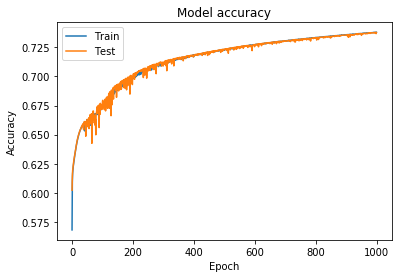

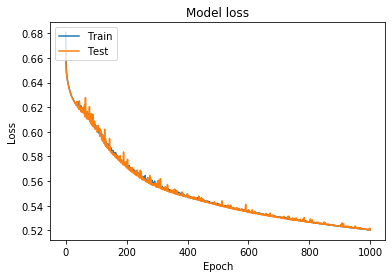

In [35]:
# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

earlystop_callback = EarlyStopping(
  monitor='val_accuracy', min_delta=0.0001,
  patience=1,verbose=1)

within model.fit()  ,callbacks=[earlystop_callback]

In [36]:
#time for some hyperparams

In [50]:
# Load the TensorBoard notebook extension
%reload_ext tensorboard

In [38]:
import pandas as pd
df = pd.read_csv("HIGGS.csv",nrows=100000)
df.columns=['label','lepton pT', 'lepton eta', 'lepton phi', 'missing energy magnitude', 'missing energy phi', 'jet 1 pt',
             'jet 1 eta', 'jet 1 phi', 'jet 1 b-tag', 'jet 2 pt', 'jet 2 eta', 'jet 2 phi', 'jet 2 b-tag', 'jet 3 pt',
             'jet 3 eta', 'jet 3 phi', 'jet 3 b-tag', 'jet 4 pt', 'jet 4 eta', 'jet 4 phi', 'jet 4 b-tag', 'm_jj',
             'm_jjj', 'm_lv','m_jlv', 'm_bb', 'm_wbb', 'm_wwbb']
from sklearn.model_selection import train_test_split

In [39]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp
from tensorflow import feature_column
from tensorflow.keras import layers
import tensorflow.compat.v2.feature_column as fc
 

 
x_train, x_test, y_train, y_test = train_test_split(df.iloc[:,1:],df.iloc[:,0:1], test_size=0.20, random_state=102)
 
#Estimators are a pain

In [40]:
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp

In [41]:
HP_NUM_UNITS = hp.HParam('num_units', hp.Discrete([100, 200, 300, 500]))
HP_DROPOUT = hp.HParam('dropout', hp.RealInterval(0.1, 0.5))
HP_OPTIMIZER = hp.HParam('optimizer', hp.Discrete(['adam', 'sgd']))



In [42]:
METRIC_ACCURACY = 'Accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
  hp.hparams_config(
    hparams=[HP_NUM_UNITS, HP_DROPOUT, HP_OPTIMIZER],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

Executing op WriteRawProtoSummary in device /job:localhost/replica:0/task:0/device:CPU:0


In [43]:
# The only trick here is the fit expects matrices, not dataframes.
# so just use .values
# also change from 10 classes to 2
# also change loss function
def train_test_model(hparams):
  model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dropout(hparams[HP_DROPOUT]),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),
    tf.keras.layers.Dense(hparams[HP_NUM_UNITS], activation=tf.nn.relu),  
    tf.keras.layers.Dense(1, activation=tf.nn.sigmoid),
  ])
  model.compile(
      optimizer=hparams[HP_OPTIMIZER],
      loss='binary_crossentropy',
      metrics=['accuracy'],
  )

  model.fit(x_train.values, y_train.values, epochs=2000, batch_size=200) # Run with 1 epoch to speed things up for demo purposes
  _, accuracy = model.evaluate(x_test.values, y_test.values)
  return accuracy

In [44]:
def run(run_dir, hparams):
  with tf.summary.create_file_writer(run_dir).as_default():
    hp.hparams(hparams)  # record the values used in this trial
    accuracy = train_test_model(hparams)
    tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

In [45]:
"""
earlystop_callback = EarlyStopping(
  monitor='val_accuracy', min_delta=0.0001,
  patience=1,verbose=1)


history = model.fit(
    ...,
    callbacks=[
        tf.keras.callbacks.TensorBoard(logdir),  # log metrics
        hp.KerasCallback(logdir, hparams),   # log hparams
        earlystop_callback,    #earlystopping
    ],
)

"""

"\nearlystop_callback = EarlyStopping(\n  monitor='val_accuracy', min_delta=0.0001,\n  patience=1,verbose=1)\n\n\nhistory = model.fit(\n    ...,\n    callbacks=[\n        tf.keras.callbacks.TensorBoard(logdir),  # log metrics\n        hp.KerasCallback(logdir, hparams),   # log hparams\n        earlystop_callback,    #earlystopping\n    ],\n)\n\n"

In [46]:
with mirrored_strategy.scope():

    session_num = 0

    for num_units in HP_NUM_UNITS.domain.values:
      for dropout_rate in (HP_DROPOUT.domain.min_value, HP_DROPOUT.domain.max_value):
        for optimizer in HP_OPTIMIZER.domain.values:
          hparams = {
              HP_NUM_UNITS: num_units,
              HP_DROPOUT: dropout_rate,
              HP_OPTIMIZER: optimizer,
          }
          run_name = "run-%d" % session_num
          print('--- Starting trial: %s' % run_name)
          print({h.name: hparams[h] for h in hparams})
          run('logs/hparam_tuning/' + run_name, hparams)
          session_num += 1

--- Starting trial: run-0
{'num_units': 100, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in de

80000/80000 [==============================] - 2s 19us/sample - loss: 0.5890 - accuracy: 0.6835
Epoch 7/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5835 - accuracy: 0.6887
Epoch 8/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.5790 - accuracy: 0.6935
Epoch 9/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5747 - accuracy: 0.6967
Epoch 10/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5711 - accuracy: 0.6981
Epoch 11/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5680 - accuracy: 0.7019
Epoch 12/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5631 - accuracy: 0.7046
Epoch 13/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5608 - accuracy: 0.7079
Epoch 14/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5573 - accuracy: 0.7090
Epoch 15/2000
80000/80000 [

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4472 - accuracy: 0.7839
Epoch 81/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4463 - accuracy: 0.7868
Epoch 82/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4469 - accuracy: 0.7867
Epoch 83/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4453 - accuracy: 0.7872
Epoch 84/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4440 - accuracy: 0.7868
Epoch 85/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4410 - accuracy: 0.7879
Epoch 86/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4425 - accuracy: 0.7876
Epoch 87/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4397 - accuracy: 0.7887
Epoch 88/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4398 - accuracy: 0.7900
Epoch 89/2000
80000/8000

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4042 - accuracy: 0.8108
Epoch 155/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3981 - accuracy: 0.8135
Epoch 156/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4032 - accuracy: 0.8123
Epoch 157/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3999 - accuracy: 0.8149
Epoch 158/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3984 - accuracy: 0.8135
Epoch 159/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4026 - accuracy: 0.8136
Epoch 160/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4000 - accuracy: 0.8132
Epoch 161/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3982 - accuracy: 0.8150
Epoch 162/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3999 - accuracy: 0.8145
Epoch 163/2000
8

Epoch 228/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3767 - accuracy: 0.8287
Epoch 229/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3790 - accuracy: 0.8270
Epoch 230/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3765 - accuracy: 0.8279
Epoch 231/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3746 - accuracy: 0.8283
Epoch 232/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3767 - accuracy: 0.8276
Epoch 233/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3765 - accuracy: 0.8274
Epoch 234/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3750 - accuracy: 0.8278
Epoch 235/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3786 - accuracy: 0.8260
Epoch 236/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3762 - accuracy: 0.8274
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3617 - accuracy: 0.8361
Epoch 302/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3590 - accuracy: 0.8376
Epoch 303/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3618 - accuracy: 0.8373
Epoch 304/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3616 - accuracy: 0.8351
Epoch 305/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3599 - accuracy: 0.8379
Epoch 306/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3582 - accuracy: 0.8385
Epoch 307/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3628 - accuracy: 0.8353
Epoch 308/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3614 - accuracy: 0.8370
Epoch 309/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3590 - accuracy: 0.8382
Epoch 310/2000
8

Epoch 375/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3498 - accuracy: 0.8447
Epoch 376/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3500 - accuracy: 0.8431
Epoch 377/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3496 - accuracy: 0.8451
Epoch 378/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3479 - accuracy: 0.8444
Epoch 379/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3484 - accuracy: 0.8453
Epoch 380/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3488 - accuracy: 0.8442
Epoch 381/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3478 - accuracy: 0.8451
Epoch 382/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3518 - accuracy: 0.8420
Epoch 383/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3485 - accuracy: 0.8450
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3438 - accuracy: 0.8478
Epoch 449/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3387 - accuracy: 0.8506
Epoch 450/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3386 - accuracy: 0.8488
Epoch 451/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3385 - accuracy: 0.8501
Epoch 452/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3436 - accuracy: 0.8468
Epoch 453/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3422 - accuracy: 0.8486
Epoch 454/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3436 - accuracy: 0.8481
Epoch 455/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3380 - accuracy: 0.8501
Epoch 456/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3424 - accuracy: 0.8479
Epoch 457/2000
8

Epoch 522/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3318 - accuracy: 0.8535
Epoch 523/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3336 - accuracy: 0.8543
Epoch 524/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3334 - accuracy: 0.8532
Epoch 525/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3358 - accuracy: 0.8530
Epoch 526/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3322 - accuracy: 0.8550
Epoch 527/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3329 - accuracy: 0.8526
Epoch 528/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3337 - accuracy: 0.8528
Epoch 529/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3328 - accuracy: 0.8529
Epoch 530/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3308 - accuracy: 0.8534
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3302 - accuracy: 0.8558
Epoch 596/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3259 - accuracy: 0.8564
Epoch 597/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3293 - accuracy: 0.8558
Epoch 598/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3282 - accuracy: 0.8567
Epoch 599/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3307 - accuracy: 0.8549
Epoch 600/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3283 - accuracy: 0.8566
Epoch 601/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3289 - accuracy: 0.8545
Epoch 602/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3278 - accuracy: 0.8574
Epoch 603/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3264 - accuracy: 0.8566
Epoch 604/2000
8

Epoch 669/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3218 - accuracy: 0.8596
Epoch 670/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3243 - accuracy: 0.8592
Epoch 671/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3231 - accuracy: 0.8594
Epoch 672/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3250 - accuracy: 0.8582
Epoch 673/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3237 - accuracy: 0.8575
Epoch 674/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3254 - accuracy: 0.8600
Epoch 675/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3257 - accuracy: 0.8579
Epoch 676/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3203 - accuracy: 0.8619
Epoch 677/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3264 - accuracy: 0.8573
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3185 - accuracy: 0.8614
Epoch 743/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3202 - accuracy: 0.8613
Epoch 744/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3222 - accuracy: 0.8602
Epoch 745/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3219 - accuracy: 0.8609
Epoch 746/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3219 - accuracy: 0.8613
Epoch 747/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3213 - accuracy: 0.8607
Epoch 748/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3197 - accuracy: 0.8617
Epoch 749/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3208 - accuracy: 0.8614
Epoch 750/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3179 - accuracy: 0.8631
Epoch 751/2000
8

Epoch 816/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3154 - accuracy: 0.8637
Epoch 817/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3157 - accuracy: 0.8641
Epoch 818/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3161 - accuracy: 0.8638
Epoch 819/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3185 - accuracy: 0.8623
Epoch 820/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3210 - accuracy: 0.8612
Epoch 821/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3144 - accuracy: 0.8640
Epoch 822/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3178 - accuracy: 0.8627
Epoch 823/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3183 - accuracy: 0.8636
Epoch 824/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3179 - accuracy: 0.8616
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3159 - accuracy: 0.8633
Epoch 890/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3132 - accuracy: 0.8648
Epoch 891/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3126 - accuracy: 0.8652
Epoch 892/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3130 - accuracy: 0.8653
Epoch 893/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3152 - accuracy: 0.8658
Epoch 894/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3124 - accuracy: 0.8663
Epoch 895/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3166 - accuracy: 0.8634
Epoch 896/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3152 - accuracy: 0.8643
Epoch 897/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3157 - accuracy: 0.8640
Epoch 898/2000
8

Epoch 963/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3132 - accuracy: 0.8642
Epoch 964/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3118 - accuracy: 0.8670
Epoch 965/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3137 - accuracy: 0.8645
Epoch 966/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3112 - accuracy: 0.8653
Epoch 967/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3119 - accuracy: 0.8642
Epoch 968/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3119 - accuracy: 0.8670
Epoch 969/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3137 - accuracy: 0.8648
Epoch 970/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3131 - accuracy: 0.8665
Epoch 971/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3139 - accuracy: 0.8648
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3128 - accuracy: 0.8649
Epoch 1037/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3129 - accuracy: 0.8672
Epoch 1038/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3133 - accuracy: 0.8652
Epoch 1039/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3093 - accuracy: 0.8682
Epoch 1040/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3129 - accuracy: 0.8654
Epoch 1041/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3128 - accuracy: 0.8661
Epoch 1042/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3145 - accuracy: 0.8649
Epoch 1043/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3073 - accuracy: 0.8685
Epoch 1044/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3128 - accuracy: 0.8649
Epoch 10

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3081 - accuracy: 0.8669
Epoch 1109/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3096 - accuracy: 0.8672
Epoch 1110/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3102 - accuracy: 0.8669
Epoch 1111/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3079 - accuracy: 0.8694
Epoch 1112/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3091 - accuracy: 0.8668
Epoch 1113/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3105 - accuracy: 0.8678
Epoch 1114/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3104 - accuracy: 0.8677
Epoch 1115/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3110 - accuracy: 0.8668
Epoch 1116/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3115 - accuracy: 0.8664
Epoch 11

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3103 - accuracy: 0.8679
Epoch 1182/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3095 - accuracy: 0.8676
Epoch 1183/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3064 - accuracy: 0.8688
Epoch 1184/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3093 - accuracy: 0.8681
Epoch 1185/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3089 - accuracy: 0.8677
Epoch 1186/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3065 - accuracy: 0.8691
Epoch 1187/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3076 - accuracy: 0.8693
Epoch 1188/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3111 - accuracy: 0.8684
Epoch 1189/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3089 - accuracy: 0.8683
Epoch 11

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3081 - accuracy: 0.8689
Epoch 1255/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3076 - accuracy: 0.8702
Epoch 1256/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3046 - accuracy: 0.8704
Epoch 1257/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3088 - accuracy: 0.8683
Epoch 1258/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3091 - accuracy: 0.8688
Epoch 1259/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3085 - accuracy: 0.8686
Epoch 1260/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3083 - accuracy: 0.8705
Epoch 1261/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3048 - accuracy: 0.8707
Epoch 1262/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3089 - accuracy: 0.8684
Epoch 12

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3076 - accuracy: 0.8696
Epoch 1327/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3047 - accuracy: 0.8701
Epoch 1328/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3052 - accuracy: 0.8709
Epoch 1329/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3051 - accuracy: 0.8705
Epoch 1330/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3046 - accuracy: 0.8706
Epoch 1331/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3049 - accuracy: 0.8712
Epoch 1332/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3062 - accuracy: 0.8700
Epoch 1333/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3062 - accuracy: 0.8693
Epoch 1334/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3031 - accuracy: 0.8710
Epoch 13

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3019 - accuracy: 0.8719
Epoch 1400/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3054 - accuracy: 0.8709
Epoch 1401/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3040 - accuracy: 0.8712
Epoch 1402/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3064 - accuracy: 0.8696
Epoch 1403/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3037 - accuracy: 0.8715
Epoch 1404/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3035 - accuracy: 0.8715
Epoch 1405/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3054 - accuracy: 0.8708
Epoch 1406/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3042 - accuracy: 0.8722
Epoch 1407/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3021 - accuracy: 0.8707
Epoch 14

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3044 - accuracy: 0.8709
Epoch 1473/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3034 - accuracy: 0.8710
Epoch 1474/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3009 - accuracy: 0.8719
Epoch 1475/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3052 - accuracy: 0.8710
Epoch 1476/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3044 - accuracy: 0.8706
Epoch 1477/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3048 - accuracy: 0.8704
Epoch 1478/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3050 - accuracy: 0.8711
Epoch 1479/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3026 - accuracy: 0.8724
Epoch 1480/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3021 - accuracy: 0.8735
Epoch 14

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3015 - accuracy: 0.8715
Epoch 1545/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3031 - accuracy: 0.8727
Epoch 1546/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3014 - accuracy: 0.8733
Epoch 1547/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3006 - accuracy: 0.8728
Epoch 1548/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3059 - accuracy: 0.8696
Epoch 1549/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3010 - accuracy: 0.8727
Epoch 1550/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3015 - accuracy: 0.8726
Epoch 1551/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3020 - accuracy: 0.8715
Epoch 1552/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3028 - accuracy: 0.8716
Epoch 15

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3010 - accuracy: 0.8727
Epoch 1618/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3028 - accuracy: 0.8716
Epoch 1619/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3016 - accuracy: 0.8727
Epoch 1620/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3010 - accuracy: 0.8731
Epoch 1621/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3019 - accuracy: 0.8731
Epoch 1622/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3028 - accuracy: 0.8717
Epoch 1623/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3045 - accuracy: 0.8711
Epoch 1624/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3038 - accuracy: 0.8721
Epoch 1625/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3002 - accuracy: 0.8739
Epoch 16

80000/80000 [==============================] - 1s 17us/sample - loss: 0.2987 - accuracy: 0.8735
Epoch 1691/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3004 - accuracy: 0.8731
Epoch 1692/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3018 - accuracy: 0.8727
Epoch 1693/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3035 - accuracy: 0.8712
Epoch 1694/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3027 - accuracy: 0.8713
Epoch 1695/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3032 - accuracy: 0.8717
Epoch 1696/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3025 - accuracy: 0.8712
Epoch 1697/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3005 - accuracy: 0.8745
Epoch 1698/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3009 - accuracy: 0.8735
Epoch 16

80000/80000 [==============================] - 1s 17us/sample - loss: 0.3036 - accuracy: 0.8702
Epoch 1764/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3007 - accuracy: 0.8738
Epoch 1765/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.2978 - accuracy: 0.8748
Epoch 1766/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3018 - accuracy: 0.8735
Epoch 1767/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3016 - accuracy: 0.8735
Epoch 1768/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3022 - accuracy: 0.8720
Epoch 1769/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3000 - accuracy: 0.8725
Epoch 1770/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2984 - accuracy: 0.8737
Epoch 1771/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3000 - accuracy: 0.8726
Epoch 17

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3009 - accuracy: 0.8738
Epoch 1837/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2984 - accuracy: 0.8748
Epoch 1838/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3001 - accuracy: 0.8735
Epoch 1839/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2997 - accuracy: 0.8730
Epoch 1840/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2995 - accuracy: 0.8742
Epoch 1841/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3004 - accuracy: 0.8736
Epoch 1842/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3032 - accuracy: 0.8739
Epoch 1843/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2966 - accuracy: 0.8754
Epoch 1844/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2996 - accuracy: 0.8741
Epoch 18

80000/80000 [==============================] - 1s 17us/sample - loss: 0.3009 - accuracy: 0.8727
Epoch 1910/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2986 - accuracy: 0.8743
Epoch 1911/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2994 - accuracy: 0.8737
Epoch 1912/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2997 - accuracy: 0.8737
Epoch 1913/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2986 - accuracy: 0.8744
Epoch 1914/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2985 - accuracy: 0.8741
Epoch 1915/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2978 - accuracy: 0.8737
Epoch 1916/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2979 - accuracy: 0.8750
Epoch 1917/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2998 - accuracy: 0.8722
Epoch 19

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3004 - accuracy: 0.8745
Epoch 1982/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2954 - accuracy: 0.8747
Epoch 1983/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.2972 - accuracy: 0.8741
Epoch 1984/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2975 - accuracy: 0.8740
Epoch 1985/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2976 - accuracy: 0.8741
Epoch 1986/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2976 - accuracy: 0.8746
Epoch 1987/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2997 - accuracy: 0.8741
Epoch 1988/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2993 - accuracy: 0.8734
Epoch 1989/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2989 - accuracy: 0.8749
Epoch 19

Executing op WriteSummary in device /job:localhost/replica:0/task:0/device:CPU:0
--- Starting trial: run-1
{'num_units': 100, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 1s 15us/sample - loss: 0.6060 - accuracy: 0.6694
Epoch 58/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6052 - accuracy: 0.6690
Epoch 59/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6047 - accuracy: 0.6685
Epoch 60/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6042 - accuracy: 0.6680
Epoch 61/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6043 - accuracy: 0.6691
Epoch 62/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6017 - accuracy: 0.6718
Epoch 63/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6026 - accuracy: 0.6710
Epoch 64/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6014 - accuracy: 0.6727
Epoch 65/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6004 - accuracy: 0.6714
Epoch 66/2000
80000/8000

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5640 - accuracy: 0.7051
Epoch 132/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5639 - accuracy: 0.7067
Epoch 133/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5638 - accuracy: 0.7046
Epoch 134/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5634 - accuracy: 0.7053
Epoch 135/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5632 - accuracy: 0.7047
Epoch 136/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5624 - accuracy: 0.7055
Epoch 137/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5625 - accuracy: 0.7072
Epoch 138/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5622 - accuracy: 0.7066
Epoch 139/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5610 - accuracy: 0.7070
Epoch 140/2000
8

Epoch 205/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5416 - accuracy: 0.7229
Epoch 206/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5408 - accuracy: 0.7239
Epoch 207/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5411 - accuracy: 0.7222
Epoch 208/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5392 - accuracy: 0.7255
Epoch 209/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5399 - accuracy: 0.7232
Epoch 210/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5411 - accuracy: 0.7239
Epoch 211/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5410 - accuracy: 0.7227
Epoch 212/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5392 - accuracy: 0.7238
Epoch 213/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5391 - accuracy: 0.7232
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5242 - accuracy: 0.7345
Epoch 279/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5243 - accuracy: 0.7348
Epoch 280/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5229 - accuracy: 0.7337
Epoch 281/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5227 - accuracy: 0.7356
Epoch 282/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5220 - accuracy: 0.7359
Epoch 283/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5216 - accuracy: 0.7363
Epoch 284/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5213 - accuracy: 0.7377
Epoch 285/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5218 - accuracy: 0.7363
Epoch 286/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5219 - accuracy: 0.7354
Epoch 287/2000
8

Epoch 352/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5088 - accuracy: 0.7446
Epoch 353/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5081 - accuracy: 0.7462
Epoch 354/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5068 - accuracy: 0.7462
Epoch 355/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5085 - accuracy: 0.7445
Epoch 356/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5076 - accuracy: 0.7447
Epoch 357/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5073 - accuracy: 0.7458
Epoch 358/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5073 - accuracy: 0.7461
Epoch 359/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5074 - accuracy: 0.7462
Epoch 360/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5074 - accuracy: 0.7451
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.4949 - accuracy: 0.7537
Epoch 426/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4945 - accuracy: 0.7550
Epoch 427/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4959 - accuracy: 0.7526
Epoch 428/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4941 - accuracy: 0.7553
Epoch 429/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4940 - accuracy: 0.7561
Epoch 430/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4927 - accuracy: 0.7567
Epoch 431/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4956 - accuracy: 0.7544
Epoch 432/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4945 - accuracy: 0.7550
Epoch 433/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4938 - accuracy: 0.7558
Epoch 434/2000
8

Epoch 499/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4843 - accuracy: 0.7607
Epoch 500/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4833 - accuracy: 0.7613
Epoch 501/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4839 - accuracy: 0.7624
Epoch 502/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4835 - accuracy: 0.7611
Epoch 503/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4817 - accuracy: 0.7624
Epoch 504/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4824 - accuracy: 0.7619
Epoch 505/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4811 - accuracy: 0.7630
Epoch 506/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4827 - accuracy: 0.7619
Epoch 507/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4820 - accuracy: 0.7639
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.4734 - accuracy: 0.7692
Epoch 573/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4724 - accuracy: 0.7694
Epoch 574/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4725 - accuracy: 0.7692
Epoch 575/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4716 - accuracy: 0.7698
Epoch 576/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4731 - accuracy: 0.7697
Epoch 577/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4713 - accuracy: 0.7710
Epoch 578/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4708 - accuracy: 0.7704
Epoch 579/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4713 - accuracy: 0.7710
Epoch 580/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4709 - accuracy: 0.7697
Epoch 581/2000
8

Epoch 646/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4626 - accuracy: 0.7757
Epoch 647/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4609 - accuracy: 0.7776
Epoch 648/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4625 - accuracy: 0.7757
Epoch 649/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4612 - accuracy: 0.7767
Epoch 650/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4619 - accuracy: 0.7752
Epoch 651/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4603 - accuracy: 0.7766
Epoch 652/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4620 - accuracy: 0.7763
Epoch 653/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4606 - accuracy: 0.7756
Epoch 654/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4613 - accuracy: 0.7757
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.4527 - accuracy: 0.7829
Epoch 720/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4513 - accuracy: 0.7828
Epoch 721/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4505 - accuracy: 0.7826
Epoch 722/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4519 - accuracy: 0.7824
Epoch 723/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4528 - accuracy: 0.7830
Epoch 724/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4502 - accuracy: 0.7840
Epoch 725/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4504 - accuracy: 0.7833
Epoch 726/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4524 - accuracy: 0.7823
Epoch 727/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4533 - accuracy: 0.7825
Epoch 728/2000
8

Epoch 793/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4441 - accuracy: 0.7867
Epoch 794/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4460 - accuracy: 0.7884
Epoch 795/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4431 - accuracy: 0.7878
Epoch 796/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4440 - accuracy: 0.7882
Epoch 797/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4441 - accuracy: 0.7883
Epoch 798/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4428 - accuracy: 0.7900
Epoch 799/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4448 - accuracy: 0.7876
Epoch 800/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4419 - accuracy: 0.7891
Epoch 801/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4421 - accuracy: 0.7879
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.4334 - accuracy: 0.7934
Epoch 867/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4350 - accuracy: 0.7921
Epoch 868/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4366 - accuracy: 0.7917
Epoch 869/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4348 - accuracy: 0.7933
Epoch 870/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4324 - accuracy: 0.7937
Epoch 871/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4345 - accuracy: 0.7950
Epoch 872/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4342 - accuracy: 0.7941
Epoch 873/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4340 - accuracy: 0.7939
Epoch 874/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4336 - accuracy: 0.7949
Epoch 875/2000
8

Epoch 940/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4285 - accuracy: 0.7973
Epoch 941/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4285 - accuracy: 0.7975
Epoch 942/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4285 - accuracy: 0.7973
Epoch 943/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4267 - accuracy: 0.7985
Epoch 944/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4271 - accuracy: 0.7969
Epoch 945/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4260 - accuracy: 0.8000
Epoch 946/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4280 - accuracy: 0.7991
Epoch 947/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4257 - accuracy: 0.7990
Epoch 948/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4287 - accuracy: 0.7973
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.4174 - accuracy: 0.8051
Epoch 1014/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4201 - accuracy: 0.8029
Epoch 1015/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4174 - accuracy: 0.8039
Epoch 1016/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4204 - accuracy: 0.8016
Epoch 1017/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4202 - accuracy: 0.8042
Epoch 1018/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4195 - accuracy: 0.8026
Epoch 1019/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4193 - accuracy: 0.8035
Epoch 1020/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4206 - accuracy: 0.8023
Epoch 1021/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4197 - accuracy: 0.8038
Epoch 10

80000/80000 [==============================] - 1s 15us/sample - loss: 0.4136 - accuracy: 0.8070
Epoch 1087/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4120 - accuracy: 0.8070
Epoch 1088/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4100 - accuracy: 0.8067
Epoch 1089/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4127 - accuracy: 0.8065
Epoch 1090/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4132 - accuracy: 0.8083
Epoch 1091/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4112 - accuracy: 0.8074
Epoch 1092/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4135 - accuracy: 0.8062
Epoch 1093/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4121 - accuracy: 0.8060
Epoch 1094/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4126 - accuracy: 0.8085
Epoch 10

80000/80000 [==============================] - 1s 15us/sample - loss: 0.4093 - accuracy: 0.8105
Epoch 1160/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4075 - accuracy: 0.8099
Epoch 1161/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4089 - accuracy: 0.8080
Epoch 1162/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4105 - accuracy: 0.8091
Epoch 1163/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4060 - accuracy: 0.8110
Epoch 1164/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4041 - accuracy: 0.8115
Epoch 1165/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4070 - accuracy: 0.8101
Epoch 1166/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4067 - accuracy: 0.8106
Epoch 1167/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4085 - accuracy: 0.8097
Epoch 11

80000/80000 [==============================] - 1s 15us/sample - loss: 0.4021 - accuracy: 0.8119
Epoch 1233/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3997 - accuracy: 0.8141
Epoch 1234/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3999 - accuracy: 0.8158
Epoch 1235/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4018 - accuracy: 0.8148
Epoch 1236/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3997 - accuracy: 0.8153
Epoch 1237/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3995 - accuracy: 0.8160
Epoch 1238/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4021 - accuracy: 0.8147
Epoch 1239/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4015 - accuracy: 0.8152
Epoch 1240/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.4003 - accuracy: 0.8149
Epoch 12

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3946 - accuracy: 0.8174
Epoch 1306/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3961 - accuracy: 0.8167
Epoch 1307/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3934 - accuracy: 0.8185
Epoch 1308/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3970 - accuracy: 0.8176
Epoch 1309/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3957 - accuracy: 0.8174
Epoch 1310/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3940 - accuracy: 0.8190
Epoch 1311/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3973 - accuracy: 0.8170
Epoch 1312/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3954 - accuracy: 0.8178
Epoch 1313/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3920 - accuracy: 0.8183
Epoch 13

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3896 - accuracy: 0.8208
Epoch 1379/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3933 - accuracy: 0.8188
Epoch 1380/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3908 - accuracy: 0.8208
Epoch 1381/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3895 - accuracy: 0.8219
Epoch 1382/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3884 - accuracy: 0.8225
Epoch 1383/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3904 - accuracy: 0.8194
Epoch 1384/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3905 - accuracy: 0.8201
Epoch 1385/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3908 - accuracy: 0.8188
Epoch 1386/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3893 - accuracy: 0.8206
Epoch 13

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3865 - accuracy: 0.8218
Epoch 1451/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3868 - accuracy: 0.8222
Epoch 1452/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3854 - accuracy: 0.8236
Epoch 1453/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3864 - accuracy: 0.8222
Epoch 1454/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3834 - accuracy: 0.8241
Epoch 1455/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3820 - accuracy: 0.8254
Epoch 1456/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3860 - accuracy: 0.8243
Epoch 1457/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3833 - accuracy: 0.8240
Epoch 1458/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3841 - accuracy: 0.8255
Epoch 14

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3806 - accuracy: 0.8270
Epoch 1523/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3817 - accuracy: 0.8279
Epoch 1524/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3809 - accuracy: 0.8258
Epoch 1525/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3798 - accuracy: 0.8263
Epoch 1526/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3795 - accuracy: 0.8262
Epoch 1527/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3780 - accuracy: 0.8288
Epoch 1528/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3808 - accuracy: 0.8256
Epoch 1529/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3795 - accuracy: 0.8282
Epoch 1530/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3786 - accuracy: 0.8285
Epoch 15

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3746 - accuracy: 0.8305
Epoch 1595/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3746 - accuracy: 0.8303
Epoch 1596/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3763 - accuracy: 0.8296
Epoch 1597/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3774 - accuracy: 0.8299
Epoch 1598/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3786 - accuracy: 0.8275
Epoch 1599/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3789 - accuracy: 0.8267
Epoch 1600/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3751 - accuracy: 0.8294
Epoch 1601/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3749 - accuracy: 0.8291
Epoch 1602/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3754 - accuracy: 0.8296
Epoch 16

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3719 - accuracy: 0.8307
Epoch 1668/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3719 - accuracy: 0.8310
Epoch 1669/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3723 - accuracy: 0.8318
Epoch 1670/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3722 - accuracy: 0.8318
Epoch 1671/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3722 - accuracy: 0.8328
Epoch 1672/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3710 - accuracy: 0.8330
Epoch 1673/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3696 - accuracy: 0.8338
Epoch 1674/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3715 - accuracy: 0.8334
Epoch 1675/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3740 - accuracy: 0.8289
Epoch 16

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3669 - accuracy: 0.8329
Epoch 1741/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3669 - accuracy: 0.8347
Epoch 1742/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3670 - accuracy: 0.8346
Epoch 1743/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3693 - accuracy: 0.8329
Epoch 1744/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3691 - accuracy: 0.8340
Epoch 1745/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3648 - accuracy: 0.8361
Epoch 1746/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3704 - accuracy: 0.8343
Epoch 1747/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3677 - accuracy: 0.8336
Epoch 1748/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3671 - accuracy: 0.8354
Epoch 17

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3661 - accuracy: 0.8354
Epoch 1813/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3629 - accuracy: 0.8362
Epoch 1814/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3639 - accuracy: 0.8364
Epoch 1815/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3643 - accuracy: 0.8347
Epoch 1816/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3621 - accuracy: 0.8368
Epoch 1817/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3655 - accuracy: 0.8361
Epoch 1818/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3662 - accuracy: 0.8343
Epoch 1819/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3653 - accuracy: 0.8350
Epoch 1820/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3641 - accuracy: 0.8349
Epoch 18

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3611 - accuracy: 0.8373
Epoch 1885/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3625 - accuracy: 0.8386
Epoch 1886/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3593 - accuracy: 0.8391
Epoch 1887/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3607 - accuracy: 0.8380
Epoch 1888/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3601 - accuracy: 0.8396
Epoch 1889/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3619 - accuracy: 0.8373
Epoch 1890/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3611 - accuracy: 0.8374
Epoch 1891/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3614 - accuracy: 0.8379
Epoch 1892/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3587 - accuracy: 0.8396
Epoch 18

80000/80000 [==============================] - 1s 15us/sample - loss: 0.3575 - accuracy: 0.8396
Epoch 1957/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3563 - accuracy: 0.8415
Epoch 1958/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3564 - accuracy: 0.8411
Epoch 1959/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3568 - accuracy: 0.8416
Epoch 1960/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3569 - accuracy: 0.8400
Epoch 1961/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3588 - accuracy: 0.8399
Epoch 1962/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3568 - accuracy: 0.8410
Epoch 1963/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3575 - accuracy: 0.8403
Epoch 1964/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.3593 - accuracy: 0.8404
Epoch 19

--- Starting trial: run-2
{'num_units': 100, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5857 - accuracy: 0.6859
Epoch 24/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5853 - accuracy: 0.6866
Epoch 25/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5848 - accuracy: 0.6867
Epoch 26/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5838 - accuracy: 0.6878
Epoch 27/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5831 - accuracy: 0.6884
Epoch 28/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5812 - accuracy: 0.6903
Epoch 29/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5806 - accuracy: 0.6915
Epoch 30/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5809 - accuracy: 0.6913
Epoch 31/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5799 - accuracy: 0.6912
Epoch 32/2000
80000/8000

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5563 - accuracy: 0.7117
Epoch 98/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5550 - accuracy: 0.7113
Epoch 99/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5547 - accuracy: 0.7131
Epoch 100/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5549 - accuracy: 0.7115
Epoch 101/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5556 - accuracy: 0.7104
Epoch 102/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5559 - accuracy: 0.7104
Epoch 103/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5547 - accuracy: 0.7126
Epoch 104/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5541 - accuracy: 0.7120
Epoch 105/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5541 - accuracy: 0.7114
Epoch 106/2000
800

Epoch 171/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5447 - accuracy: 0.7182
Epoch 172/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5435 - accuracy: 0.7213
Epoch 173/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5436 - accuracy: 0.7198
Epoch 174/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5428 - accuracy: 0.7199
Epoch 175/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5440 - accuracy: 0.7199
Epoch 176/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5433 - accuracy: 0.7207
Epoch 177/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5421 - accuracy: 0.7214
Epoch 178/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5439 - accuracy: 0.7203
Epoch 179/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5454 - accuracy: 0.7192
E

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5379 - accuracy: 0.7246
Epoch 245/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5366 - accuracy: 0.7234
Epoch 246/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5365 - accuracy: 0.7253
Epoch 247/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5369 - accuracy: 0.7255
Epoch 248/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5374 - accuracy: 0.7234
Epoch 249/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5376 - accuracy: 0.7239
Epoch 250/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5371 - accuracy: 0.7240
Epoch 251/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5373 - accuracy: 0.7233
Epoch 252/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5369 - accuracy: 0.7237
Epoch 253/2000
8

Epoch 318/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5335 - accuracy: 0.7259
Epoch 319/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5309 - accuracy: 0.7290
Epoch 320/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5304 - accuracy: 0.7294
Epoch 321/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5328 - accuracy: 0.7278
Epoch 322/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5300 - accuracy: 0.7288
Epoch 323/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5313 - accuracy: 0.7283
Epoch 324/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5321 - accuracy: 0.7269
Epoch 325/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5310 - accuracy: 0.7285
Epoch 326/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5313 - accuracy: 0.7290
E

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5285 - accuracy: 0.7299
Epoch 392/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5275 - accuracy: 0.7310
Epoch 393/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5288 - accuracy: 0.7303
Epoch 394/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5261 - accuracy: 0.7317
Epoch 395/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5271 - accuracy: 0.7323
Epoch 396/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5279 - accuracy: 0.7312
Epoch 397/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5264 - accuracy: 0.7319
Epoch 398/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5278 - accuracy: 0.7301
Epoch 399/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5279 - accuracy: 0.7300
Epoch 400/2000
8

Epoch 465/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5239 - accuracy: 0.7333
Epoch 466/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5215 - accuracy: 0.7359
Epoch 467/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5242 - accuracy: 0.7332
Epoch 468/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5240 - accuracy: 0.7339
Epoch 469/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5235 - accuracy: 0.7321
Epoch 470/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5238 - accuracy: 0.7351
Epoch 471/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5233 - accuracy: 0.7333
Epoch 472/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5241 - accuracy: 0.7336
Epoch 473/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5228 - accuracy: 0.7340
E

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5201 - accuracy: 0.7351
Epoch 539/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5198 - accuracy: 0.7362
Epoch 540/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5208 - accuracy: 0.7364
Epoch 541/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5210 - accuracy: 0.7351
Epoch 542/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5200 - accuracy: 0.7354
Epoch 543/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5200 - accuracy: 0.7358
Epoch 544/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5200 - accuracy: 0.7340
Epoch 545/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5206 - accuracy: 0.7369
Epoch 546/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5208 - accuracy: 0.7354
Epoch 547/2000
8

Epoch 612/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5168 - accuracy: 0.7386
Epoch 613/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5182 - accuracy: 0.7372
Epoch 614/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5183 - accuracy: 0.7371
Epoch 615/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5178 - accuracy: 0.7386
Epoch 616/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5186 - accuracy: 0.7368
Epoch 617/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5174 - accuracy: 0.7378
Epoch 618/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5194 - accuracy: 0.7376
Epoch 619/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5178 - accuracy: 0.7376
Epoch 620/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5173 - accuracy: 0.7366
E

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5137 - accuracy: 0.7401
Epoch 686/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5159 - accuracy: 0.7405
Epoch 687/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5141 - accuracy: 0.7405
Epoch 688/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5158 - accuracy: 0.7385
Epoch 689/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5156 - accuracy: 0.7395
Epoch 690/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5147 - accuracy: 0.7401
Epoch 691/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5125 - accuracy: 0.7419
Epoch 692/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5143 - accuracy: 0.7400
Epoch 693/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5145 - accuracy: 0.7383
Epoch 694/2000
8

Epoch 759/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5133 - accuracy: 0.7412
Epoch 760/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5119 - accuracy: 0.7435
Epoch 761/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5125 - accuracy: 0.7400
Epoch 762/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5126 - accuracy: 0.7410
Epoch 763/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5125 - accuracy: 0.7418
Epoch 764/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5136 - accuracy: 0.7394
Epoch 765/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5129 - accuracy: 0.7422
Epoch 766/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5113 - accuracy: 0.7413
Epoch 767/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5105 - accuracy: 0.7432
E

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5118 - accuracy: 0.7416
Epoch 833/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5103 - accuracy: 0.7434
Epoch 834/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5113 - accuracy: 0.7416
Epoch 835/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5092 - accuracy: 0.7425
Epoch 836/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5095 - accuracy: 0.7437
Epoch 837/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5092 - accuracy: 0.7435
Epoch 838/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5107 - accuracy: 0.7412
Epoch 839/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5103 - accuracy: 0.7428
Epoch 840/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5089 - accuracy: 0.7443
Epoch 841/2000
8

Epoch 906/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5077 - accuracy: 0.7442
Epoch 907/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5077 - accuracy: 0.7465
Epoch 908/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5087 - accuracy: 0.7434
Epoch 909/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5078 - accuracy: 0.7426
Epoch 910/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5087 - accuracy: 0.7436
Epoch 911/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5061 - accuracy: 0.7450
Epoch 912/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5088 - accuracy: 0.7416
Epoch 913/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5077 - accuracy: 0.7444
Epoch 914/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5089 - accuracy: 0.7438
E

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5069 - accuracy: 0.7453
Epoch 980/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5075 - accuracy: 0.7447
Epoch 981/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5073 - accuracy: 0.7448
Epoch 982/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5035 - accuracy: 0.7484
Epoch 983/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5077 - accuracy: 0.7431
Epoch 984/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5084 - accuracy: 0.7446
Epoch 985/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5078 - accuracy: 0.7459
Epoch 986/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5070 - accuracy: 0.7463
Epoch 987/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5068 - accuracy: 0.7441
Epoch 988/2000
8

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5083 - accuracy: 0.7437
Epoch 1053/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5067 - accuracy: 0.7442
Epoch 1054/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5047 - accuracy: 0.7468
Epoch 1055/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5064 - accuracy: 0.7456
Epoch 1056/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5062 - accuracy: 0.7458
Epoch 1057/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5059 - accuracy: 0.7471
Epoch 1058/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5046 - accuracy: 0.7462
Epoch 1059/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5048 - accuracy: 0.7468
Epoch 1060/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5062 - accuracy: 0.7460
Epoch 10

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5042 - accuracy: 0.7485
Epoch 1126/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5048 - accuracy: 0.7477
Epoch 1127/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5024 - accuracy: 0.7484
Epoch 1128/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5044 - accuracy: 0.7478
Epoch 1129/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5045 - accuracy: 0.7453
Epoch 1130/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5020 - accuracy: 0.7478
Epoch 1131/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5039 - accuracy: 0.7472
Epoch 1132/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5032 - accuracy: 0.7481
Epoch 1133/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5030 - accuracy: 0.7488
Epoch 11

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5019 - accuracy: 0.7472
Epoch 1199/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5026 - accuracy: 0.7484
Epoch 1200/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5016 - accuracy: 0.7495
Epoch 1201/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5014 - accuracy: 0.7495
Epoch 1202/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5026 - accuracy: 0.7486
Epoch 1203/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5029 - accuracy: 0.7467
Epoch 1204/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5018 - accuracy: 0.7472
Epoch 1205/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5025 - accuracy: 0.7472
Epoch 1206/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5015 - accuracy: 0.7478
Epoch 12

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5026 - accuracy: 0.7487
Epoch 1272/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4989 - accuracy: 0.7507
Epoch 1273/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5002 - accuracy: 0.7492
Epoch 1274/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4994 - accuracy: 0.7500
Epoch 1275/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5019 - accuracy: 0.7486
Epoch 1276/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5013 - accuracy: 0.7488
Epoch 1277/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5016 - accuracy: 0.7496
Epoch 1278/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5020 - accuracy: 0.7498
Epoch 1279/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5013 - accuracy: 0.7473
Epoch 12

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5006 - accuracy: 0.7495
Epoch 1345/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4998 - accuracy: 0.7493
Epoch 1346/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5006 - accuracy: 0.7502
Epoch 1347/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5006 - accuracy: 0.7497
Epoch 1348/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5010 - accuracy: 0.7498
Epoch 1349/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4988 - accuracy: 0.7517
Epoch 1350/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5003 - accuracy: 0.7512
Epoch 1351/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5007 - accuracy: 0.7498
Epoch 1352/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4988 - accuracy: 0.7509
Epoch 13

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4988 - accuracy: 0.7499
Epoch 1418/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4988 - accuracy: 0.7503
Epoch 1419/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5003 - accuracy: 0.7489
Epoch 1420/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4991 - accuracy: 0.7523
Epoch 1421/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4995 - accuracy: 0.7504
Epoch 1422/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5001 - accuracy: 0.7505
Epoch 1423/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4984 - accuracy: 0.7511
Epoch 1424/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4992 - accuracy: 0.7502
Epoch 1425/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4979 - accuracy: 0.7517
Epoch 14

80000/80000 [==============================] - 1s 17us/sample - loss: 0.4952 - accuracy: 0.7529
Epoch 1491/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4965 - accuracy: 0.7530
Epoch 1492/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4970 - accuracy: 0.7510
Epoch 1493/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4978 - accuracy: 0.7504
Epoch 1494/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4985 - accuracy: 0.7503
Epoch 1495/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4976 - accuracy: 0.7526
Epoch 1496/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4969 - accuracy: 0.7535
Epoch 1497/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4977 - accuracy: 0.7508
Epoch 1498/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4974 - accuracy: 0.7525
Epoch 14

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4971 - accuracy: 0.7522
Epoch 1564/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4961 - accuracy: 0.7534
Epoch 1565/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4987 - accuracy: 0.7517
Epoch 1566/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4979 - accuracy: 0.7522
Epoch 1567/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4962 - accuracy: 0.7524
Epoch 1568/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4965 - accuracy: 0.7530
Epoch 1569/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4982 - accuracy: 0.7506
Epoch 1570/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4968 - accuracy: 0.7528
Epoch 1571/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4960 - accuracy: 0.7531
Epoch 15

80000/80000 [==============================] - 1s 17us/sample - loss: 0.4965 - accuracy: 0.7522
Epoch 1637/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4949 - accuracy: 0.7556
Epoch 1638/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4961 - accuracy: 0.7535
Epoch 1639/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4977 - accuracy: 0.7516
Epoch 1640/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4955 - accuracy: 0.7532
Epoch 1641/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4956 - accuracy: 0.7530
Epoch 1642/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4967 - accuracy: 0.7523
Epoch 1643/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4943 - accuracy: 0.7539
Epoch 1644/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4949 - accuracy: 0.7532
Epoch 16

80000/80000 [==============================] - 1s 17us/sample - loss: 0.4952 - accuracy: 0.7546
Epoch 1710/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4945 - accuracy: 0.7557
Epoch 1711/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4964 - accuracy: 0.7520
Epoch 1712/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4952 - accuracy: 0.7535
Epoch 1713/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4977 - accuracy: 0.7525
Epoch 1714/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4937 - accuracy: 0.7549
Epoch 1715/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4945 - accuracy: 0.7531
Epoch 1716/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4962 - accuracy: 0.7531
Epoch 1717/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4964 - accuracy: 0.7526
Epoch 17

80000/80000 [==============================] - 1s 17us/sample - loss: 0.4937 - accuracy: 0.7546
Epoch 1783/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4928 - accuracy: 0.7540
Epoch 1784/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4942 - accuracy: 0.7544
Epoch 1785/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4930 - accuracy: 0.7557
Epoch 1786/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4932 - accuracy: 0.7549
Epoch 1787/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4939 - accuracy: 0.7539
Epoch 1788/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4944 - accuracy: 0.7537
Epoch 1789/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4942 - accuracy: 0.7532
Epoch 1790/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4958 - accuracy: 0.7538
Epoch 17

80000/80000 [==============================] - 1s 17us/sample - loss: 0.4949 - accuracy: 0.7541
Epoch 1856/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4931 - accuracy: 0.7547
Epoch 1857/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4919 - accuracy: 0.7547
Epoch 1858/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4939 - accuracy: 0.7557
Epoch 1859/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4930 - accuracy: 0.7548
Epoch 1860/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4931 - accuracy: 0.7560
Epoch 1861/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4950 - accuracy: 0.7529
Epoch 1862/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4948 - accuracy: 0.7542
Epoch 1863/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4927 - accuracy: 0.7561
Epoch 18

80000/80000 [==============================] - 1s 17us/sample - loss: 0.4937 - accuracy: 0.7556
Epoch 1929/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4924 - accuracy: 0.7541
Epoch 1930/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4930 - accuracy: 0.7552
Epoch 1931/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4905 - accuracy: 0.7563
Epoch 1932/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4920 - accuracy: 0.7569
Epoch 1933/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4916 - accuracy: 0.7549
Epoch 1934/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4908 - accuracy: 0.7555
Epoch 1935/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4926 - accuracy: 0.7558
Epoch 1936/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4919 - accuracy: 0.7557
Epoch 19

Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op __inference_distributed_function_8188234 in device /job:localhost/replica:0/task:0/device:GPU:0
20000/1 [==============================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

--- Starting trial: run-3
{'num_units': 100, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

80000/80000 [==============================] - 1s 15us/sample - loss: 0.6435 - accuracy: 0.6263
Epoch 61/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6424 - accuracy: 0.6265
Epoch 62/2000
80000/80000 [==============================] - ETA: 0s - loss: 0.6413 - accuracy: 0.62 - 1s 15us/sample - loss: 0.6414 - accuracy: 0.6292
Epoch 63/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6412 - accuracy: 0.6295
Epoch 64/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6405 - accuracy: 0.6295
Epoch 65/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6398 - accuracy: 0.6301
Epoch 66/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6393 - accuracy: 0.6322
Epoch 67/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6410 - accuracy: 0.6274
Epoch 68/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6385 -

80000/80000 [==============================] - 1s 15us/sample - loss: 0.6154 - accuracy: 0.6597
Epoch 134/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6153 - accuracy: 0.6600
Epoch 135/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6167 - accuracy: 0.6600
Epoch 136/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6147 - accuracy: 0.6613
Epoch 137/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6144 - accuracy: 0.6622
Epoch 138/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6137 - accuracy: 0.6616
Epoch 139/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6141 - accuracy: 0.6626
Epoch 140/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6132 - accuracy: 0.6639
Epoch 141/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.6134 - accuracy: 0.6629
Epoch 142/2000
8

Epoch 207/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5927 - accuracy: 0.6807
Epoch 208/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5907 - accuracy: 0.6828
Epoch 209/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5912 - accuracy: 0.6843
Epoch 210/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5909 - accuracy: 0.6836
Epoch 211/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5924 - accuracy: 0.6830
Epoch 212/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5914 - accuracy: 0.6833
Epoch 213/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5900 - accuracy: 0.6832
Epoch 214/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5902 - accuracy: 0.6827
Epoch 215/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5903 - accuracy: 0.6842
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5788 - accuracy: 0.6912
Epoch 281/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5802 - accuracy: 0.6917
Epoch 282/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5783 - accuracy: 0.6930
Epoch 283/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5768 - accuracy: 0.6931
Epoch 284/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5788 - accuracy: 0.6941
Epoch 285/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5795 - accuracy: 0.6911
Epoch 286/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5769 - accuracy: 0.6957
Epoch 287/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5797 - accuracy: 0.6904
Epoch 288/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5781 - accuracy: 0.6935
Epoch 289/2000
8

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5715 - accuracy: 0.6989
Epoch 354/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5724 - accuracy: 0.6978
Epoch 355/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5712 - accuracy: 0.6981
Epoch 356/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5720 - accuracy: 0.6970
Epoch 357/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5718 - accuracy: 0.6988
Epoch 358/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5715 - accuracy: 0.6984
Epoch 359/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5722 - accuracy: 0.6981
Epoch 360/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5723 - accuracy: 0.6967
Epoch 361/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5719 - accuracy: 0.6973
Epoch 362/2000
8

Epoch 427/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5666 - accuracy: 0.7023
Epoch 428/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5674 - accuracy: 0.7014
Epoch 429/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5672 - accuracy: 0.7009
Epoch 430/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5662 - accuracy: 0.7034
Epoch 431/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5662 - accuracy: 0.7032
Epoch 432/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5664 - accuracy: 0.7009
Epoch 433/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5666 - accuracy: 0.7029
Epoch 434/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5665 - accuracy: 0.7022
Epoch 435/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5664 - accuracy: 0.7010
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5627 - accuracy: 0.7037
Epoch 501/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5630 - accuracy: 0.7039
Epoch 502/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5620 - accuracy: 0.7052
Epoch 503/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5619 - accuracy: 0.7051
Epoch 504/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5625 - accuracy: 0.7039
Epoch 505/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5625 - accuracy: 0.7046
Epoch 506/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5619 - accuracy: 0.7051
Epoch 507/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5625 - accuracy: 0.7049
Epoch 508/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5609 - accuracy: 0.7053
Epoch 509/2000
8

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5594 - accuracy: 0.7068
Epoch 574/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5598 - accuracy: 0.7065
Epoch 575/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5576 - accuracy: 0.7090
Epoch 576/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5578 - accuracy: 0.7086
Epoch 577/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5574 - accuracy: 0.7093
Epoch 578/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5584 - accuracy: 0.7073
Epoch 579/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5586 - accuracy: 0.7059
Epoch 580/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5580 - accuracy: 0.7087
Epoch 581/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5581 - accuracy: 0.7079
Epoch 582/2000
8

Epoch 647/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5556 - accuracy: 0.7106
Epoch 648/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5566 - accuracy: 0.7095
Epoch 649/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5551 - accuracy: 0.7104
Epoch 650/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5554 - accuracy: 0.7102
Epoch 651/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5559 - accuracy: 0.7089
Epoch 652/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5548 - accuracy: 0.7106
Epoch 653/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5547 - accuracy: 0.7105
Epoch 654/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5553 - accuracy: 0.7087
Epoch 655/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5550 - accuracy: 0.7089
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5529 - accuracy: 0.7128
Epoch 721/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5533 - accuracy: 0.7120
Epoch 722/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5536 - accuracy: 0.7109
Epoch 723/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5536 - accuracy: 0.7109
Epoch 724/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5528 - accuracy: 0.7118
Epoch 725/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5526 - accuracy: 0.7123
Epoch 726/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5511 - accuracy: 0.7128
Epoch 727/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5527 - accuracy: 0.7121
Epoch 728/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5531 - accuracy: 0.7116
Epoch 729/2000
8

Epoch 794/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5518 - accuracy: 0.7119
Epoch 795/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5520 - accuracy: 0.7114
Epoch 796/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5514 - accuracy: 0.7147
Epoch 797/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5516 - accuracy: 0.7123
Epoch 798/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5508 - accuracy: 0.7137
Epoch 799/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5504 - accuracy: 0.7134
Epoch 800/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5507 - accuracy: 0.7131
Epoch 801/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5507 - accuracy: 0.7125
Epoch 802/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5509 - accuracy: 0.7144
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5499 - accuracy: 0.7145
Epoch 868/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5501 - accuracy: 0.7137
Epoch 869/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5497 - accuracy: 0.7129
Epoch 870/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5487 - accuracy: 0.7143
Epoch 871/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5488 - accuracy: 0.7153
Epoch 872/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5491 - accuracy: 0.7147
Epoch 873/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5474 - accuracy: 0.7148
Epoch 874/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5485 - accuracy: 0.7149
Epoch 875/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5481 - accuracy: 0.7152
Epoch 876/2000
8

Epoch 941/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5479 - accuracy: 0.7159
Epoch 942/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5462 - accuracy: 0.7162
Epoch 943/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5468 - accuracy: 0.7160
Epoch 944/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5481 - accuracy: 0.7148
Epoch 945/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5484 - accuracy: 0.7140
Epoch 946/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5467 - accuracy: 0.7164
Epoch 947/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5468 - accuracy: 0.7164
Epoch 948/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5500 - accuracy: 0.7145
Epoch 949/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5474 - accuracy: 0.7156
E

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5464 - accuracy: 0.7184
Epoch 1015/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5458 - accuracy: 0.7147
Epoch 1016/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5475 - accuracy: 0.7156
Epoch 1017/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5451 - accuracy: 0.7179
Epoch 1018/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5484 - accuracy: 0.7156
Epoch 1019/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5450 - accuracy: 0.7175
Epoch 1020/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5451 - accuracy: 0.7174
Epoch 1021/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5450 - accuracy: 0.7172
Epoch 1022/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5462 - accuracy: 0.7164
Epoch 10

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5450 - accuracy: 0.7177
Epoch 1087/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5458 - accuracy: 0.7168
Epoch 1088/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5463 - accuracy: 0.7156
Epoch 1089/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5452 - accuracy: 0.7179
Epoch 1090/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5445 - accuracy: 0.7191
Epoch 1091/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5452 - accuracy: 0.7171
Epoch 1092/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5447 - accuracy: 0.7168
Epoch 1093/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5462 - accuracy: 0.7184
Epoch 1094/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5458 - accuracy: 0.7175
Epoch 10

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5440 - accuracy: 0.7183
Epoch 1160/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5435 - accuracy: 0.7188
Epoch 1161/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5446 - accuracy: 0.7162
Epoch 1162/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5445 - accuracy: 0.7170
Epoch 1163/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5455 - accuracy: 0.7168
Epoch 1164/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5459 - accuracy: 0.7158
Epoch 1165/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5444 - accuracy: 0.7179
Epoch 1166/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5434 - accuracy: 0.7183
Epoch 1167/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5444 - accuracy: 0.7182
Epoch 11

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5409 - accuracy: 0.7207
Epoch 1233/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5429 - accuracy: 0.7187
Epoch 1234/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5419 - accuracy: 0.7190
Epoch 1235/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5425 - accuracy: 0.7202
Epoch 1236/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5416 - accuracy: 0.7194
Epoch 1237/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5423 - accuracy: 0.7194
Epoch 1238/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5429 - accuracy: 0.7200
Epoch 1239/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5431 - accuracy: 0.7193
Epoch 1240/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5424 - accuracy: 0.7186
Epoch 12

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5418 - accuracy: 0.7198
Epoch 1306/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5403 - accuracy: 0.7203
Epoch 1307/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5407 - accuracy: 0.7219
Epoch 1308/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5413 - accuracy: 0.7206
Epoch 1309/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5418 - accuracy: 0.7210
Epoch 1310/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5414 - accuracy: 0.7190
Epoch 1311/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5401 - accuracy: 0.7208
Epoch 1312/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5413 - accuracy: 0.7188
Epoch 1313/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5411 - accuracy: 0.7200
Epoch 13

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5401 - accuracy: 0.7214
Epoch 1379/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5386 - accuracy: 0.7196
Epoch 1380/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5400 - accuracy: 0.7205
Epoch 1381/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5403 - accuracy: 0.7212
Epoch 1382/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5407 - accuracy: 0.7204
Epoch 1383/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5400 - accuracy: 0.7209
Epoch 1384/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5421 - accuracy: 0.7198
Epoch 1385/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5400 - accuracy: 0.7216
Epoch 1386/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5386 - accuracy: 0.7219
Epoch 13

80000/80000 [==============================] - 1s 17us/sample - loss: 0.5395 - accuracy: 0.7214
Epoch 1452/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5397 - accuracy: 0.7202
Epoch 1453/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5400 - accuracy: 0.7200
Epoch 1454/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5385 - accuracy: 0.7224
Epoch 1455/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5390 - accuracy: 0.7222
Epoch 1456/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5392 - accuracy: 0.7223
Epoch 1457/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5397 - accuracy: 0.7211
Epoch 1458/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5387 - accuracy: 0.7218
Epoch 1459/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5396 - accuracy: 0.7212
Epoch 14

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5387 - accuracy: 0.7208
Epoch 1525/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5384 - accuracy: 0.7208
Epoch 1526/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5391 - accuracy: 0.7197
Epoch 1527/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5386 - accuracy: 0.7215
Epoch 1528/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5378 - accuracy: 0.7214
Epoch 1529/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5382 - accuracy: 0.7204
Epoch 1530/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5385 - accuracy: 0.7219
Epoch 1531/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5384 - accuracy: 0.7206
Epoch 1532/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5389 - accuracy: 0.7207
Epoch 15

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5386 - accuracy: 0.7213
Epoch 1597/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5364 - accuracy: 0.7222
Epoch 1598/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5355 - accuracy: 0.7242
Epoch 1599/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5371 - accuracy: 0.7240
Epoch 1600/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5363 - accuracy: 0.7222
Epoch 1601/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5378 - accuracy: 0.7205
Epoch 1602/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5373 - accuracy: 0.7236
Epoch 1603/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5369 - accuracy: 0.7222
Epoch 1604/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5368 - accuracy: 0.7210
Epoch 16

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5364 - accuracy: 0.7233
Epoch 1670/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5361 - accuracy: 0.7248
Epoch 1671/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5362 - accuracy: 0.7244
Epoch 1672/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5356 - accuracy: 0.7250
Epoch 1673/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5359 - accuracy: 0.7236
Epoch 1674/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5358 - accuracy: 0.7225
Epoch 1675/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5355 - accuracy: 0.7227
Epoch 1676/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5359 - accuracy: 0.7244
Epoch 1677/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5358 - accuracy: 0.7225
Epoch 16

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5358 - accuracy: 0.7236
Epoch 1743/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5356 - accuracy: 0.7229
Epoch 1744/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5356 - accuracy: 0.7243
Epoch 1745/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5365 - accuracy: 0.7240
Epoch 1746/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5350 - accuracy: 0.7236
Epoch 1747/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5344 - accuracy: 0.7247
Epoch 1748/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5358 - accuracy: 0.7239
Epoch 1749/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5356 - accuracy: 0.7240
Epoch 1750/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5360 - accuracy: 0.7241
Epoch 17

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5354 - accuracy: 0.7251
Epoch 1816/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5344 - accuracy: 0.7237
Epoch 1817/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5349 - accuracy: 0.7253
Epoch 1818/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5354 - accuracy: 0.7242
Epoch 1819/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5339 - accuracy: 0.7248
Epoch 1820/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5341 - accuracy: 0.7239
Epoch 1821/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5353 - accuracy: 0.7263
Epoch 1822/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5338 - accuracy: 0.7256
Epoch 1823/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5351 - accuracy: 0.7249
Epoch 18

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5329 - accuracy: 0.7241
Epoch 1889/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5336 - accuracy: 0.7258
Epoch 1890/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5337 - accuracy: 0.7252
Epoch 1891/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5345 - accuracy: 0.7238
Epoch 1892/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5333 - accuracy: 0.7251
Epoch 1893/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5338 - accuracy: 0.7239
Epoch 1894/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5343 - accuracy: 0.7234
Epoch 1895/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5326 - accuracy: 0.7269
Epoch 1896/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5343 - accuracy: 0.7263
Epoch 18

80000/80000 [==============================] - 1s 15us/sample - loss: 0.5325 - accuracy: 0.7266
Epoch 1962/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5333 - accuracy: 0.7269
Epoch 1963/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5342 - accuracy: 0.7254
Epoch 1964/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5327 - accuracy: 0.7252
Epoch 1965/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5323 - accuracy: 0.7262
Epoch 1966/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5329 - accuracy: 0.7271
Epoch 1967/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5330 - accuracy: 0.7261
Epoch 1968/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5338 - accuracy: 0.7249
Epoch 1969/2000
80000/80000 [==============================] - 1s 15us/sample - loss: 0.5328 - accuracy: 0.7268
Epoch 19

--- Starting trial: run-4
{'num_units': 200, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4856 - accuracy: 0.7608
Epoch 21/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4748 - accuracy: 0.7682
Epoch 22/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4708 - accuracy: 0.7704
Epoch 23/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4621 - accuracy: 0.7743
Epoch 24/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4551 - accuracy: 0.7794
Epoch 25/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4492 - accuracy: 0.7845
Epoch 26/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4431 - accuracy: 0.7876
Epoch 27/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4361 - accuracy: 0.7901
Epoch 28/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4296 - accuracy: 0.7959
Epoch 29/2000
80000/8000

80000/80000 [==============================] - 1s 18us/sample - loss: 0.2339 - accuracy: 0.9036
Epoch 95/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2307 - accuracy: 0.9031
Epoch 96/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2299 - accuracy: 0.9043
Epoch 97/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2282 - accuracy: 0.9049
Epoch 98/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2278 - accuracy: 0.9051
Epoch 99/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2267 - accuracy: 0.9065
Epoch 100/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2270 - accuracy: 0.9056
Epoch 101/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2221 - accuracy: 0.9080
Epoch 102/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2240 - accuracy: 0.9077
Epoch 103/2000
80000/

Epoch 168/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1758 - accuracy: 0.9306
Epoch 169/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1685 - accuracy: 0.9330
Epoch 170/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1720 - accuracy: 0.9327
Epoch 171/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1712 - accuracy: 0.9320
Epoch 172/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1694 - accuracy: 0.9342
Epoch 173/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1728 - accuracy: 0.9322
Epoch 174/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1691 - accuracy: 0.9337
Epoch 175/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1680 - accuracy: 0.9346
Epoch 176/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1696 - accuracy: 0.9329
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.1456 - accuracy: 0.9437
Epoch 242/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1417 - accuracy: 0.9467
Epoch 243/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1431 - accuracy: 0.9452
Epoch 244/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1416 - accuracy: 0.9458
Epoch 245/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1438 - accuracy: 0.9444
Epoch 246/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1445 - accuracy: 0.9455
Epoch 247/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1423 - accuracy: 0.9464
Epoch 248/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1421 - accuracy: 0.9459
Epoch 249/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1422 - accuracy: 0.9452
Epoch 250/2000
8

Epoch 315/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1266 - accuracy: 0.9531
Epoch 316/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1317 - accuracy: 0.9504
Epoch 317/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1267 - accuracy: 0.9532
Epoch 318/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1279 - accuracy: 0.9516
Epoch 319/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1248 - accuracy: 0.9528
Epoch 320/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1248 - accuracy: 0.9531
Epoch 321/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1281 - accuracy: 0.9524
Epoch 322/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1272 - accuracy: 0.9517
Epoch 323/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1286 - accuracy: 0.9514
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.1164 - accuracy: 0.9571
Epoch 389/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1198 - accuracy: 0.9551
Epoch 390/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1160 - accuracy: 0.9568
Epoch 391/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1150 - accuracy: 0.9579
Epoch 392/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1156 - accuracy: 0.9575
Epoch 393/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1168 - accuracy: 0.9562
Epoch 394/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1173 - accuracy: 0.9571
Epoch 395/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1126 - accuracy: 0.9580
Epoch 396/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1155 - accuracy: 0.9571
Epoch 397/2000
8

Epoch 462/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1082 - accuracy: 0.9608
Epoch 463/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1059 - accuracy: 0.9617
Epoch 464/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1098 - accuracy: 0.9599
Epoch 465/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1033 - accuracy: 0.9619
Epoch 466/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1091 - accuracy: 0.9602
Epoch 467/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1103 - accuracy: 0.9596
Epoch 468/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1071 - accuracy: 0.9609
Epoch 469/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1075 - accuracy: 0.9612
Epoch 470/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1080 - accuracy: 0.9607
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.1031 - accuracy: 0.9619
Epoch 536/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1035 - accuracy: 0.9628
Epoch 537/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1027 - accuracy: 0.9627
Epoch 538/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1031 - accuracy: 0.9621
Epoch 539/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1032 - accuracy: 0.9625
Epoch 540/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1047 - accuracy: 0.9627
Epoch 541/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1001 - accuracy: 0.9629
Epoch 542/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1027 - accuracy: 0.9632
Epoch 543/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1021 - accuracy: 0.9625
Epoch 544/2000
8

Epoch 609/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0977 - accuracy: 0.9650
Epoch 610/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0998 - accuracy: 0.9631
Epoch 611/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0991 - accuracy: 0.9640
Epoch 612/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0981 - accuracy: 0.9642
Epoch 613/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0971 - accuracy: 0.9652
Epoch 614/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0961 - accuracy: 0.9652
Epoch 615/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0977 - accuracy: 0.9646
Epoch 616/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0960 - accuracy: 0.9649
Epoch 617/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0984 - accuracy: 0.9650
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0960 - accuracy: 0.9650
Epoch 683/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0970 - accuracy: 0.9651
Epoch 684/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0935 - accuracy: 0.9666
Epoch 685/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0981 - accuracy: 0.9641
Epoch 686/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0940 - accuracy: 0.9661
Epoch 687/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0944 - accuracy: 0.9662
Epoch 688/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0944 - accuracy: 0.9657
Epoch 689/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0954 - accuracy: 0.9654
Epoch 690/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0937 - accuracy: 0.9664
Epoch 691/2000
8

Epoch 756/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0932 - accuracy: 0.9672
Epoch 757/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0915 - accuracy: 0.9671
Epoch 758/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0931 - accuracy: 0.9669
Epoch 759/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0916 - accuracy: 0.9672
Epoch 760/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0921 - accuracy: 0.9665
Epoch 761/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0907 - accuracy: 0.9673
Epoch 762/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0897 - accuracy: 0.9670
Epoch 763/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0931 - accuracy: 0.9663
Epoch 764/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0912 - accuracy: 0.9672
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0928 - accuracy: 0.9670
Epoch 830/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0910 - accuracy: 0.9669
Epoch 831/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0882 - accuracy: 0.9685
Epoch 832/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0886 - accuracy: 0.9680
Epoch 833/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0881 - accuracy: 0.9678
Epoch 834/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0923 - accuracy: 0.9666
Epoch 835/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0902 - accuracy: 0.9679
Epoch 836/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0860 - accuracy: 0.9699
Epoch 837/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0898 - accuracy: 0.9680
Epoch 838/2000
8

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0880 - accuracy: 0.9684
Epoch 903/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0900 - accuracy: 0.9677
Epoch 904/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0906 - accuracy: 0.9686
Epoch 905/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0895 - accuracy: 0.9677
Epoch 906/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0866 - accuracy: 0.9691
Epoch 907/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0870 - accuracy: 0.9688
Epoch 908/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0885 - accuracy: 0.9679
Epoch 909/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0886 - accuracy: 0.9682
Epoch 910/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0860 - accuracy: 0.9683
Epoch 911/2000
8

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0879 - accuracy: 0.9690
Epoch 976/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0860 - accuracy: 0.9696
Epoch 977/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0850 - accuracy: 0.9695
Epoch 978/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0871 - accuracy: 0.9686
Epoch 979/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0871 - accuracy: 0.9689
Epoch 980/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0826 - accuracy: 0.9700
Epoch 981/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0855 - accuracy: 0.9693
Epoch 982/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0881 - accuracy: 0.9687
Epoch 983/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0850 - accuracy: 0.9695
Epoch 984/2000
8

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0853 - accuracy: 0.9692
Epoch 1049/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0847 - accuracy: 0.9697
Epoch 1050/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0861 - accuracy: 0.9690
Epoch 1051/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0839 - accuracy: 0.9706
Epoch 1052/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0822 - accuracy: 0.9711
Epoch 1053/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0891 - accuracy: 0.9688
Epoch 1054/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0887 - accuracy: 0.9687
Epoch 1055/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0875 - accuracy: 0.9696
Epoch 1056/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0834 - accuracy: 0.9704
Epoch 10

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0866 - accuracy: 0.9694
Epoch 1122/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0855 - accuracy: 0.9695
Epoch 1123/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0823 - accuracy: 0.9707
Epoch 1124/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0843 - accuracy: 0.9706
Epoch 1125/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0846 - accuracy: 0.9701
Epoch 1126/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0821 - accuracy: 0.9708
Epoch 1127/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0844 - accuracy: 0.9706
Epoch 1128/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0840 - accuracy: 0.9702
Epoch 1129/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0809 - accuracy: 0.9712
Epoch 11

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0812 - accuracy: 0.9708
Epoch 1194/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0831 - accuracy: 0.9708
Epoch 1195/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0852 - accuracy: 0.9700
Epoch 1196/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0812 - accuracy: 0.9720
Epoch 1197/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0833 - accuracy: 0.9705
Epoch 1198/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0834 - accuracy: 0.9707
Epoch 1199/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0857 - accuracy: 0.9693
Epoch 1200/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0858 - accuracy: 0.9698
Epoch 1201/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0810 - accuracy: 0.9713
Epoch 12

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0820 - accuracy: 0.9712
Epoch 1267/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0856 - accuracy: 0.9700
Epoch 1268/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0827 - accuracy: 0.9712
Epoch 1269/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0814 - accuracy: 0.9719
Epoch 1270/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0861 - accuracy: 0.9703
Epoch 1271/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0833 - accuracy: 0.9706
Epoch 1272/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0825 - accuracy: 0.9711
Epoch 1273/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0818 - accuracy: 0.9718
Epoch 1274/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0832 - accuracy: 0.9708
Epoch 12

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0810 - accuracy: 0.9716
Epoch 1340/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0810 - accuracy: 0.9713
Epoch 1341/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0806 - accuracy: 0.9709
Epoch 1342/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0798 - accuracy: 0.9725
Epoch 1343/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0823 - accuracy: 0.9715
Epoch 1344/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0766 - accuracy: 0.9728
Epoch 1345/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0815 - accuracy: 0.9716
Epoch 1346/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0808 - accuracy: 0.9717
Epoch 1347/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0828 - accuracy: 0.9706
Epoch 13

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0811 - accuracy: 0.9714
Epoch 1413/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0821 - accuracy: 0.9710
Epoch 1414/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0830 - accuracy: 0.9705
Epoch 1415/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0805 - accuracy: 0.9722
Epoch 1416/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0776 - accuracy: 0.9729
Epoch 1417/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0793 - accuracy: 0.9724
Epoch 1418/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0792 - accuracy: 0.9719
Epoch 1419/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0793 - accuracy: 0.9723
Epoch 1420/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0805 - accuracy: 0.9724
Epoch 14

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0803 - accuracy: 0.9715
Epoch 1486/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0813 - accuracy: 0.9715
Epoch 1487/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0798 - accuracy: 0.9719
Epoch 1488/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0806 - accuracy: 0.9722
Epoch 1489/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0810 - accuracy: 0.9712
Epoch 1490/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0808 - accuracy: 0.9718
Epoch 1491/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0801 - accuracy: 0.9718
Epoch 1492/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0831 - accuracy: 0.9710
Epoch 1493/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0813 - accuracy: 0.9717
Epoch 14

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0794 - accuracy: 0.9717
Epoch 1559/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0798 - accuracy: 0.9726
Epoch 1560/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0773 - accuracy: 0.9731
Epoch 1561/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0771 - accuracy: 0.9726
Epoch 1562/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0808 - accuracy: 0.9713
Epoch 1563/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0811 - accuracy: 0.9714
Epoch 1564/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0766 - accuracy: 0.9734
Epoch 1565/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0798 - accuracy: 0.9732
Epoch 1566/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0784 - accuracy: 0.9725
Epoch 15

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0807 - accuracy: 0.9720
Epoch 1632/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0796 - accuracy: 0.9722
Epoch 1633/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0805 - accuracy: 0.9724
Epoch 1634/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0767 - accuracy: 0.9730
Epoch 1635/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0794 - accuracy: 0.9721
Epoch 1636/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0820 - accuracy: 0.9717
Epoch 1637/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0787 - accuracy: 0.9725
Epoch 1638/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0815 - accuracy: 0.9715
Epoch 1639/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0767 - accuracy: 0.9734
Epoch 16

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0765 - accuracy: 0.9735
Epoch 1705/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0781 - accuracy: 0.9722
Epoch 1706/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0771 - accuracy: 0.9735
Epoch 1707/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0796 - accuracy: 0.9720
Epoch 1708/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0797 - accuracy: 0.9720
Epoch 1709/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0791 - accuracy: 0.9732
Epoch 1710/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0789 - accuracy: 0.9727
Epoch 1711/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0782 - accuracy: 0.9731
Epoch 1712/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0780 - accuracy: 0.9730
Epoch 17

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0778 - accuracy: 0.9734
Epoch 1778/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0780 - accuracy: 0.9729
Epoch 1779/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0806 - accuracy: 0.9720
Epoch 1780/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0789 - accuracy: 0.9721
Epoch 1781/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0789 - accuracy: 0.9726
Epoch 1782/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0803 - accuracy: 0.9721
Epoch 1783/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0794 - accuracy: 0.9722
Epoch 1784/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0774 - accuracy: 0.9729
Epoch 1785/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0789 - accuracy: 0.9731
Epoch 17

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0750 - accuracy: 0.9740
Epoch 1851/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0781 - accuracy: 0.9730
Epoch 1852/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0771 - accuracy: 0.9731
Epoch 1853/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0803 - accuracy: 0.9727
Epoch 1854/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0784 - accuracy: 0.9727
Epoch 1855/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0749 - accuracy: 0.9732
Epoch 1856/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0770 - accuracy: 0.9737
Epoch 1857/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0800 - accuracy: 0.9726
Epoch 1858/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0761 - accuracy: 0.9740
Epoch 18

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0752 - accuracy: 0.9738
Epoch 1924/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0760 - accuracy: 0.9737
Epoch 1925/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0783 - accuracy: 0.9729
Epoch 1926/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0769 - accuracy: 0.9740
Epoch 1927/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0760 - accuracy: 0.9739
Epoch 1928/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0759 - accuracy: 0.9740
Epoch 1929/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0772 - accuracy: 0.9732
Epoch 1930/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0784 - accuracy: 0.9726
Epoch 1931/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0784 - accuracy: 0.9729
Epoch 19

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0772 - accuracy: 0.9738
Epoch 1997/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0796 - accuracy: 0.9729
Epoch 1998/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0769 - accuracy: 0.9742
Epoch 1999/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0770 - accuracy: 0.9736
Epoch 2000/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0751 - accuracy: 0.9741
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op __inference_distributed_

--- Starting trial: run-5
{'num_units': 200, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

Epoch 63/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5895 - accuracy: 0.6831
Epoch 64/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5885 - accuracy: 0.6839
Epoch 65/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5879 - accuracy: 0.6852
Epoch 66/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5867 - accuracy: 0.6853
Epoch 67/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5859 - accuracy: 0.6875
Epoch 68/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5851 - accuracy: 0.6880
Epoch 69/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5846 - accuracy: 0.6859
Epoch 70/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5844 - accuracy: 0.6885
Epoch 71/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5834 - accuracy: 0.6900
Epoch 72/2

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5415 - accuracy: 0.7218
Epoch 137/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5404 - accuracy: 0.7240
Epoch 138/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5398 - accuracy: 0.7226
Epoch 139/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5394 - accuracy: 0.7262
Epoch 140/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5386 - accuracy: 0.7240
Epoch 141/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5394 - accuracy: 0.7239
Epoch 142/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5370 - accuracy: 0.7237
Epoch 143/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5378 - accuracy: 0.7243
Epoch 144/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5381 - accuracy: 0.7247
Epoch 145/2000
8

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5037 - accuracy: 0.7491
Epoch 210/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5027 - accuracy: 0.7506
Epoch 211/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5043 - accuracy: 0.7484
Epoch 212/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5033 - accuracy: 0.7506
Epoch 213/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5016 - accuracy: 0.7527
Epoch 214/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5032 - accuracy: 0.7515
Epoch 215/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5006 - accuracy: 0.7529
Epoch 216/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4990 - accuracy: 0.7535
Epoch 217/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5007 - accuracy: 0.7535
Epoch 218/2000
8

Epoch 283/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4645 - accuracy: 0.7761
Epoch 284/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4655 - accuracy: 0.7763
Epoch 285/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4642 - accuracy: 0.7764
Epoch 286/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4639 - accuracy: 0.7774
Epoch 287/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4640 - accuracy: 0.7770
Epoch 288/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4632 - accuracy: 0.7763
Epoch 289/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4626 - accuracy: 0.7779
Epoch 290/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4613 - accuracy: 0.7781
Epoch 291/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4588 - accuracy: 0.7790
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.4259 - accuracy: 0.8006
Epoch 357/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4299 - accuracy: 0.7979
Epoch 358/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4246 - accuracy: 0.8000
Epoch 359/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4287 - accuracy: 0.7957
Epoch 360/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4287 - accuracy: 0.7973
Epoch 361/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4260 - accuracy: 0.7994
Epoch 362/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4248 - accuracy: 0.8001
Epoch 363/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4223 - accuracy: 0.8020
Epoch 364/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4235 - accuracy: 0.8026
Epoch 365/2000
8

Epoch 430/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3899 - accuracy: 0.8204
Epoch 431/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3863 - accuracy: 0.8221
Epoch 432/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3902 - accuracy: 0.8197
Epoch 433/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3839 - accuracy: 0.8241
Epoch 434/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3877 - accuracy: 0.8225
Epoch 435/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3845 - accuracy: 0.8247
Epoch 436/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3885 - accuracy: 0.8201
Epoch 437/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3814 - accuracy: 0.8248
Epoch 438/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3854 - accuracy: 0.8228
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.3526 - accuracy: 0.8419
Epoch 504/2000
80000/80000 [==============================] - ETA: 0s - loss: 0.3512 - accuracy: 0.84 - 1s 16us/sample - loss: 0.3513 - accuracy: 0.8425
Epoch 505/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3511 - accuracy: 0.8426
Epoch 506/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3487 - accuracy: 0.8441
Epoch 507/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3492 - accuracy: 0.8421
Epoch 508/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3451 - accuracy: 0.8448
Epoch 509/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3478 - accuracy: 0.8437
Epoch 510/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3467 - accuracy: 0.8447
Epoch 511/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 

80000/80000 [==============================] - 1s 16us/sample - loss: 0.3145 - accuracy: 0.8633
Epoch 577/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3161 - accuracy: 0.8603
Epoch 578/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3112 - accuracy: 0.8640
Epoch 579/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3146 - accuracy: 0.8615
Epoch 580/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3152 - accuracy: 0.8620
Epoch 581/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3198 - accuracy: 0.8598
Epoch 582/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3106 - accuracy: 0.8636
Epoch 583/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3107 - accuracy: 0.8637
Epoch 584/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.3104 - accuracy: 0.8638
Epoch 585/2000
8

Epoch 650/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2871 - accuracy: 0.8764
Epoch 651/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2840 - accuracy: 0.8773
Epoch 652/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2856 - accuracy: 0.8775
Epoch 653/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2791 - accuracy: 0.8801
Epoch 654/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2838 - accuracy: 0.8786
Epoch 655/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2791 - accuracy: 0.8794
Epoch 656/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2831 - accuracy: 0.8788
Epoch 657/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2806 - accuracy: 0.8803
Epoch 658/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2784 - accuracy: 0.8801
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.2570 - accuracy: 0.8921
Epoch 724/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2602 - accuracy: 0.8924
Epoch 725/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2576 - accuracy: 0.8915
Epoch 726/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2564 - accuracy: 0.8918
Epoch 727/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2541 - accuracy: 0.8942
Epoch 728/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2526 - accuracy: 0.8934
Epoch 729/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2538 - accuracy: 0.8932
Epoch 730/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2557 - accuracy: 0.8921
Epoch 731/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2577 - accuracy: 0.8921
Epoch 732/2000
8

Epoch 797/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2328 - accuracy: 0.9044
Epoch 798/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2362 - accuracy: 0.9025
Epoch 799/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2371 - accuracy: 0.9020
Epoch 800/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2322 - accuracy: 0.9050
Epoch 801/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2391 - accuracy: 0.9010
Epoch 802/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2353 - accuracy: 0.9022
Epoch 803/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2343 - accuracy: 0.9031
Epoch 804/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2303 - accuracy: 0.9044
Epoch 805/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2337 - accuracy: 0.9050
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.2131 - accuracy: 0.9131
Epoch 871/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2193 - accuracy: 0.9115
Epoch 872/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2103 - accuracy: 0.9152
Epoch 873/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2133 - accuracy: 0.9132
Epoch 874/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2187 - accuracy: 0.9104
Epoch 875/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2060 - accuracy: 0.9184
Epoch 876/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2102 - accuracy: 0.9149
Epoch 877/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2143 - accuracy: 0.9126
Epoch 878/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2092 - accuracy: 0.9148
Epoch 879/2000
8

Epoch 944/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.2025 - accuracy: 0.9187
Epoch 945/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1979 - accuracy: 0.9211
Epoch 946/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1970 - accuracy: 0.9216
Epoch 947/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1966 - accuracy: 0.9230
Epoch 948/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1961 - accuracy: 0.9223
Epoch 949/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1967 - accuracy: 0.9218
Epoch 950/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1941 - accuracy: 0.9223
Epoch 951/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1953 - accuracy: 0.9223
Epoch 952/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1979 - accuracy: 0.9207
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1848 - accuracy: 0.9272
Epoch 1018/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1793 - accuracy: 0.9299
Epoch 1019/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1845 - accuracy: 0.9277
Epoch 1020/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1862 - accuracy: 0.9264
Epoch 1021/2000
80000/80000 [==============================] - ETA: 0s - loss: 0.1833 - accuracy: 0.92 - 1s 16us/sample - loss: 0.1835 - accuracy: 0.9289
Epoch 1022/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1823 - accuracy: 0.9280
Epoch 1023/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1873 - accuracy: 0.9259
Epoch 1024/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1809 - accuracy: 0.9294
Epoch 1025/2000
80000/80000 [==============================] - 1s 16us/sample 

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1713 - accuracy: 0.9328
Epoch 1090/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1726 - accuracy: 0.9322
Epoch 1091/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1730 - accuracy: 0.9320
Epoch 1092/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1715 - accuracy: 0.9323
Epoch 1093/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1729 - accuracy: 0.9332
Epoch 1094/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1707 - accuracy: 0.9337
Epoch 1095/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1719 - accuracy: 0.9333
Epoch 1096/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1732 - accuracy: 0.9335
Epoch 1097/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1691 - accuracy: 0.9352
Epoch 10

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1632 - accuracy: 0.9368
Epoch 1163/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1582 - accuracy: 0.9398
Epoch 1164/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1630 - accuracy: 0.9368
Epoch 1165/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1643 - accuracy: 0.9361
Epoch 1166/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1635 - accuracy: 0.9370
Epoch 1167/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1627 - accuracy: 0.9366
Epoch 1168/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1586 - accuracy: 0.9388
Epoch 1169/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1625 - accuracy: 0.9370
Epoch 1170/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1616 - accuracy: 0.9373
Epoch 11

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1517 - accuracy: 0.9416
Epoch 1235/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1553 - accuracy: 0.9399
Epoch 1236/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1513 - accuracy: 0.9423
Epoch 1237/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1553 - accuracy: 0.9407
Epoch 1238/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1504 - accuracy: 0.9410
Epoch 1239/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1540 - accuracy: 0.9406
Epoch 1240/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1521 - accuracy: 0.9417
Epoch 1241/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1544 - accuracy: 0.9420
Epoch 1242/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1520 - accuracy: 0.9415
Epoch 12

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1478 - accuracy: 0.9434
Epoch 1308/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1438 - accuracy: 0.9456
Epoch 1309/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1469 - accuracy: 0.9439
Epoch 1310/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1461 - accuracy: 0.9443
Epoch 1311/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1460 - accuracy: 0.9448
Epoch 1312/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1436 - accuracy: 0.9450
Epoch 1313/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1428 - accuracy: 0.9459
Epoch 1314/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1457 - accuracy: 0.9451
Epoch 1315/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1420 - accuracy: 0.9460
Epoch 13

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1410 - accuracy: 0.9467
Epoch 1381/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1366 - accuracy: 0.9477
Epoch 1382/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1453 - accuracy: 0.9452
Epoch 1383/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1364 - accuracy: 0.9483
Epoch 1384/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1395 - accuracy: 0.9475
Epoch 1385/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1369 - accuracy: 0.9489
Epoch 1386/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1387 - accuracy: 0.9477
Epoch 1387/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1399 - accuracy: 0.9480
Epoch 1388/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1397 - accuracy: 0.9468
Epoch 13

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1323 - accuracy: 0.9500
Epoch 1454/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1309 - accuracy: 0.9513
Epoch 1455/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1335 - accuracy: 0.9492
Epoch 1456/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1351 - accuracy: 0.9491
Epoch 1457/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1334 - accuracy: 0.9492
Epoch 1458/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1336 - accuracy: 0.9493
Epoch 1459/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1346 - accuracy: 0.9497
Epoch 1460/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1341 - accuracy: 0.9492
Epoch 1461/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1335 - accuracy: 0.9495
Epoch 14

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1297 - accuracy: 0.9506
Epoch 1527/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1290 - accuracy: 0.9519
Epoch 1528/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1291 - accuracy: 0.9516
Epoch 1529/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1308 - accuracy: 0.9510
Epoch 1530/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1277 - accuracy: 0.9514
Epoch 1531/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1288 - accuracy: 0.9516
Epoch 1532/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1261 - accuracy: 0.9522
Epoch 1533/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1303 - accuracy: 0.9513
Epoch 1534/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1296 - accuracy: 0.9513
Epoch 15

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1220 - accuracy: 0.9542
Epoch 1600/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1222 - accuracy: 0.9546
Epoch 1601/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1244 - accuracy: 0.9534
Epoch 1602/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1211 - accuracy: 0.9542
Epoch 1603/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1241 - accuracy: 0.9529
Epoch 1604/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1242 - accuracy: 0.9545
Epoch 1605/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1241 - accuracy: 0.9537
Epoch 1606/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1218 - accuracy: 0.9548
Epoch 1607/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1215 - accuracy: 0.9549
Epoch 16

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1200 - accuracy: 0.9549
Epoch 1673/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1186 - accuracy: 0.9558
Epoch 1674/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1199 - accuracy: 0.9556
Epoch 1675/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1205 - accuracy: 0.9549
Epoch 1676/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1228 - accuracy: 0.9543
Epoch 1677/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1214 - accuracy: 0.9547
Epoch 1678/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1198 - accuracy: 0.9554
Epoch 1679/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1191 - accuracy: 0.9559
Epoch 1680/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1206 - accuracy: 0.9545
Epoch 16

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1147 - accuracy: 0.9577
Epoch 1746/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1151 - accuracy: 0.9570
Epoch 1747/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1138 - accuracy: 0.9580
Epoch 1748/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1160 - accuracy: 0.9567
Epoch 1749/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1141 - accuracy: 0.9582
Epoch 1750/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1209 - accuracy: 0.9553
Epoch 1751/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1173 - accuracy: 0.9565
Epoch 1752/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1146 - accuracy: 0.9577
Epoch 1753/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1170 - accuracy: 0.9566
Epoch 17

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1124 - accuracy: 0.9590
Epoch 1819/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1107 - accuracy: 0.9599
Epoch 1820/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1095 - accuracy: 0.9596
Epoch 1821/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1125 - accuracy: 0.9584
Epoch 1822/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1165 - accuracy: 0.9568
Epoch 1823/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1140 - accuracy: 0.9578
Epoch 1824/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1139 - accuracy: 0.9579
Epoch 1825/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1134 - accuracy: 0.9573
Epoch 1826/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1146 - accuracy: 0.9568
Epoch 18

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1098 - accuracy: 0.9598
Epoch 1892/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1085 - accuracy: 0.9603
Epoch 1893/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1074 - accuracy: 0.9596
Epoch 1894/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1088 - accuracy: 0.9598
Epoch 1895/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1066 - accuracy: 0.9605
Epoch 1896/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1099 - accuracy: 0.9596
Epoch 1897/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1092 - accuracy: 0.9597
Epoch 1898/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1102 - accuracy: 0.9596
Epoch 1899/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1114 - accuracy: 0.9593
Epoch 19

80000/80000 [==============================] - 1s 16us/sample - loss: 0.1058 - accuracy: 0.9610
Epoch 1965/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1082 - accuracy: 0.9597
Epoch 1966/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1066 - accuracy: 0.9603
Epoch 1967/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1080 - accuracy: 0.9607
Epoch 1968/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1068 - accuracy: 0.9609
Epoch 1969/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1070 - accuracy: 0.9603
Epoch 1970/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1070 - accuracy: 0.9608
Epoch 1971/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1072 - accuracy: 0.9599
Epoch 1972/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.1058 - accuracy: 0.9608
Epoch 19

--- Starting trial: run-6
{'num_units': 200, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 1s 18us/sample - loss: 0.5695 - accuracy: 0.7012
Epoch 27/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5693 - accuracy: 0.7008
Epoch 28/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5675 - accuracy: 0.7011
Epoch 29/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5678 - accuracy: 0.7036
Epoch 30/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5650 - accuracy: 0.7041
Epoch 31/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5652 - accuracy: 0.7044
Epoch 32/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5640 - accuracy: 0.7050
Epoch 33/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5633 - accuracy: 0.7059
Epoch 34/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5613 - accuracy: 0.7070
Epoch 35/2000
80000/8000

80000/80000 [==============================] - 1s 19us/sample - loss: 0.5262 - accuracy: 0.7319
Epoch 101/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5276 - accuracy: 0.7315
Epoch 102/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5256 - accuracy: 0.7336
Epoch 103/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5263 - accuracy: 0.7327
Epoch 104/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5259 - accuracy: 0.7332
Epoch 105/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5249 - accuracy: 0.7321
Epoch 106/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5238 - accuracy: 0.7357
Epoch 107/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5256 - accuracy: 0.7327
Epoch 108/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5240 - accuracy: 0.7358
Epoch 109/2000
8

Epoch 174/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5033 - accuracy: 0.7482
Epoch 175/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5035 - accuracy: 0.7459
Epoch 176/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5037 - accuracy: 0.7478
Epoch 177/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5000 - accuracy: 0.7497
Epoch 178/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5034 - accuracy: 0.7497
Epoch 179/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5003 - accuracy: 0.7492
Epoch 180/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5028 - accuracy: 0.7487
Epoch 181/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4982 - accuracy: 0.7502
Epoch 182/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5025 - accuracy: 0.7494
E

80000/80000 [==============================] - 1s 19us/sample - loss: 0.4867 - accuracy: 0.7587
Epoch 248/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4850 - accuracy: 0.7606
Epoch 249/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4879 - accuracy: 0.7559
Epoch 250/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4854 - accuracy: 0.7595
Epoch 251/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4865 - accuracy: 0.7606
Epoch 252/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4859 - accuracy: 0.7594
Epoch 253/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4857 - accuracy: 0.7604
Epoch 254/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4860 - accuracy: 0.7594
Epoch 255/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4866 - accuracy: 0.7602
Epoch 256/2000
8

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4747 - accuracy: 0.7666
Epoch 321/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4737 - accuracy: 0.7681
Epoch 322/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4719 - accuracy: 0.7692
Epoch 323/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4745 - accuracy: 0.7659
Epoch 324/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4706 - accuracy: 0.7692
Epoch 325/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4738 - accuracy: 0.7672
Epoch 326/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4716 - accuracy: 0.7683
Epoch 327/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4727 - accuracy: 0.7689
Epoch 328/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4713 - accuracy: 0.7675
Epoch 329/2000
8

Epoch 394/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4664 - accuracy: 0.7745
Epoch 395/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4608 - accuracy: 0.7753
Epoch 396/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4613 - accuracy: 0.7747
Epoch 397/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4635 - accuracy: 0.7732
Epoch 398/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4642 - accuracy: 0.7730
Epoch 399/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4625 - accuracy: 0.7740
Epoch 400/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4611 - accuracy: 0.7759
Epoch 401/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4607 - accuracy: 0.7752
Epoch 402/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4613 - accuracy: 0.7757
E

80000/80000 [==============================] - 1s 19us/sample - loss: 0.4547 - accuracy: 0.7792
Epoch 468/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4550 - accuracy: 0.7802
Epoch 469/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4548 - accuracy: 0.7788
Epoch 470/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4532 - accuracy: 0.7792
Epoch 471/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4536 - accuracy: 0.7794
Epoch 472/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4534 - accuracy: 0.7798
Epoch 473/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4542 - accuracy: 0.7797
Epoch 474/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4541 - accuracy: 0.7789
Epoch 475/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4510 - accuracy: 0.7813
Epoch 476/2000
8

80000/80000 [==============================] - 1s 19us/sample - loss: 0.4469 - accuracy: 0.7834
Epoch 541/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4459 - accuracy: 0.7849
Epoch 542/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4455 - accuracy: 0.7857
Epoch 543/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4439 - accuracy: 0.7863
Epoch 544/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4469 - accuracy: 0.7843
Epoch 545/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4494 - accuracy: 0.7829
Epoch 546/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4457 - accuracy: 0.7843
Epoch 547/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4461 - accuracy: 0.7843
Epoch 548/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4453 - accuracy: 0.7838
Epoch 549/2000
8

Epoch 614/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4391 - accuracy: 0.7896
Epoch 615/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4384 - accuracy: 0.7887
Epoch 616/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4383 - accuracy: 0.7904
Epoch 617/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4382 - accuracy: 0.7890
Epoch 618/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4379 - accuracy: 0.7906
Epoch 619/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4400 - accuracy: 0.7883
Epoch 620/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4377 - accuracy: 0.7906
Epoch 621/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4384 - accuracy: 0.7884
Epoch 622/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4392 - accuracy: 0.7887
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4329 - accuracy: 0.7934
Epoch 688/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4313 - accuracy: 0.7939
Epoch 689/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4341 - accuracy: 0.7924
Epoch 690/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4349 - accuracy: 0.7906
Epoch 691/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4345 - accuracy: 0.7933
Epoch 692/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4356 - accuracy: 0.7914
Epoch 693/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4337 - accuracy: 0.7919
Epoch 694/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4318 - accuracy: 0.7939
Epoch 695/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4341 - accuracy: 0.7923
Epoch 696/2000
8

Epoch 761/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4279 - accuracy: 0.7965
Epoch 762/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4270 - accuracy: 0.7967
Epoch 763/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4267 - accuracy: 0.7965
Epoch 764/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4268 - accuracy: 0.7957
Epoch 765/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4260 - accuracy: 0.7967
Epoch 766/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4256 - accuracy: 0.7987
Epoch 767/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4279 - accuracy: 0.7958
Epoch 768/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4266 - accuracy: 0.7968
Epoch 769/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4291 - accuracy: 0.7951
E

80000/80000 [==============================] - 1s 19us/sample - loss: 0.4207 - accuracy: 0.7996
Epoch 835/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4240 - accuracy: 0.7981
Epoch 836/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4229 - accuracy: 0.7994
Epoch 837/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4226 - accuracy: 0.7986
Epoch 838/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4236 - accuracy: 0.7978
Epoch 839/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4245 - accuracy: 0.7977
Epoch 840/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4222 - accuracy: 0.7997
Epoch 841/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4248 - accuracy: 0.7979
Epoch 842/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4257 - accuracy: 0.7953
Epoch 843/2000
8

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4180 - accuracy: 0.8024
Epoch 908/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4193 - accuracy: 0.8018
Epoch 909/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4187 - accuracy: 0.8012
Epoch 910/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4184 - accuracy: 0.8001
Epoch 911/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4191 - accuracy: 0.8020
Epoch 912/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4180 - accuracy: 0.8035
Epoch 913/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4192 - accuracy: 0.8022
Epoch 914/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4180 - accuracy: 0.8022
Epoch 915/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4188 - accuracy: 0.8026
Epoch 916/2000
8

Epoch 981/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4179 - accuracy: 0.8009
Epoch 982/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4165 - accuracy: 0.8021
Epoch 983/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4165 - accuracy: 0.8036
Epoch 984/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4144 - accuracy: 0.8036
Epoch 985/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4140 - accuracy: 0.8052
Epoch 986/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4142 - accuracy: 0.8029
Epoch 987/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4177 - accuracy: 0.8019
Epoch 988/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4131 - accuracy: 0.8048
Epoch 989/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4153 - accuracy: 0.8041
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4112 - accuracy: 0.8074
Epoch 1055/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4110 - accuracy: 0.8064
Epoch 1056/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4111 - accuracy: 0.8070
Epoch 1057/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4113 - accuracy: 0.8060
Epoch 1058/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4114 - accuracy: 0.8060
Epoch 1059/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4120 - accuracy: 0.8053
Epoch 1060/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4101 - accuracy: 0.8068
Epoch 1061/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4121 - accuracy: 0.8069
Epoch 1062/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4097 - accuracy: 0.8055
Epoch 10

80000/80000 [==============================] - 1s 19us/sample - loss: 0.4088 - accuracy: 0.8053
Epoch 1128/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4088 - accuracy: 0.8072
Epoch 1129/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4095 - accuracy: 0.8066
Epoch 1130/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4061 - accuracy: 0.8077
Epoch 1131/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4085 - accuracy: 0.8081
Epoch 1132/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4090 - accuracy: 0.8084
Epoch 1133/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4069 - accuracy: 0.8089
Epoch 1134/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4068 - accuracy: 0.8085
Epoch 1135/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4056 - accuracy: 0.8110
Epoch 11

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4049 - accuracy: 0.8107
Epoch 1200/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4064 - accuracy: 0.8092
Epoch 1201/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4060 - accuracy: 0.8104
Epoch 1202/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4064 - accuracy: 0.8098
Epoch 1203/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4027 - accuracy: 0.8115
Epoch 1204/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4035 - accuracy: 0.8115
Epoch 1205/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4060 - accuracy: 0.8095
Epoch 1206/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4056 - accuracy: 0.8108
Epoch 1207/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4038 - accuracy: 0.8106
Epoch 12

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4016 - accuracy: 0.8130
Epoch 1272/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4034 - accuracy: 0.8108
Epoch 1273/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4024 - accuracy: 0.8109
Epoch 1274/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4015 - accuracy: 0.8126
Epoch 1275/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4030 - accuracy: 0.8103
Epoch 1276/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4034 - accuracy: 0.8112
Epoch 1277/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3990 - accuracy: 0.8144
Epoch 1278/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3996 - accuracy: 0.8122
Epoch 1279/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3979 - accuracy: 0.8141
Epoch 12

80000/80000 [==============================] - 2s 19us/sample - loss: 0.4011 - accuracy: 0.8123
Epoch 1345/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3963 - accuracy: 0.8150
Epoch 1346/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3984 - accuracy: 0.8144
Epoch 1347/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3981 - accuracy: 0.8139
Epoch 1348/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3996 - accuracy: 0.8130
Epoch 1349/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3982 - accuracy: 0.8149
Epoch 1350/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3978 - accuracy: 0.8144
Epoch 1351/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3964 - accuracy: 0.8151
Epoch 1352/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4003 - accuracy: 0.8128
Epoch 13

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3918 - accuracy: 0.8173
Epoch 1418/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3966 - accuracy: 0.8134
Epoch 1419/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3995 - accuracy: 0.8131
Epoch 1420/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3939 - accuracy: 0.8166
Epoch 1421/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3930 - accuracy: 0.8174
Epoch 1422/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3971 - accuracy: 0.8132
Epoch 1423/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3948 - accuracy: 0.8163
Epoch 1424/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3955 - accuracy: 0.8149
Epoch 1425/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3971 - accuracy: 0.8167
Epoch 14

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3923 - accuracy: 0.8175
Epoch 1491/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3960 - accuracy: 0.8144
Epoch 1492/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3913 - accuracy: 0.8188
Epoch 1493/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3931 - accuracy: 0.8179
Epoch 1494/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3934 - accuracy: 0.8164
Epoch 1495/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3927 - accuracy: 0.8161
Epoch 1496/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3924 - accuracy: 0.8184
Epoch 1497/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3923 - accuracy: 0.8162
Epoch 1498/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3938 - accuracy: 0.8144
Epoch 14

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3903 - accuracy: 0.8188
Epoch 1563/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3941 - accuracy: 0.8177
Epoch 1564/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3939 - accuracy: 0.8177
Epoch 1565/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3913 - accuracy: 0.8178
Epoch 1566/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3928 - accuracy: 0.8176
Epoch 1567/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3911 - accuracy: 0.8170
Epoch 1568/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3909 - accuracy: 0.8173
Epoch 1569/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3907 - accuracy: 0.8184
Epoch 1570/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3905 - accuracy: 0.8184
Epoch 15

80000/80000 [==============================] - 1s 19us/sample - loss: 0.3889 - accuracy: 0.8204
Epoch 1635/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3906 - accuracy: 0.8188
Epoch 1636/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3878 - accuracy: 0.8198
Epoch 1637/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3886 - accuracy: 0.8199
Epoch 1638/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3895 - accuracy: 0.8197
Epoch 1639/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3879 - accuracy: 0.8196
Epoch 1640/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3881 - accuracy: 0.8197
Epoch 1641/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3901 - accuracy: 0.8191
Epoch 1642/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3871 - accuracy: 0.8205
Epoch 16

80000/80000 [==============================] - 1s 18us/sample - loss: 0.3895 - accuracy: 0.8189
Epoch 1708/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3904 - accuracy: 0.8196
Epoch 1709/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3865 - accuracy: 0.8209
Epoch 1710/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3890 - accuracy: 0.8189
Epoch 1711/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3889 - accuracy: 0.8191
Epoch 1712/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3864 - accuracy: 0.8204
Epoch 1713/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3876 - accuracy: 0.8210
Epoch 1714/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3892 - accuracy: 0.8192
Epoch 1715/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3869 - accuracy: 0.8203
Epoch 17

80000/80000 [==============================] - 1s 19us/sample - loss: 0.3863 - accuracy: 0.8217
Epoch 1781/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3839 - accuracy: 0.8220
Epoch 1782/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3830 - accuracy: 0.8220
Epoch 1783/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3858 - accuracy: 0.8215
Epoch 1784/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3848 - accuracy: 0.8220
Epoch 1785/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3810 - accuracy: 0.8234
Epoch 1786/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3844 - accuracy: 0.8223
Epoch 1787/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3843 - accuracy: 0.8220
Epoch 1788/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3864 - accuracy: 0.8202
Epoch 17

80000/80000 [==============================] - 1s 19us/sample - loss: 0.3832 - accuracy: 0.8227
Epoch 1854/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3806 - accuracy: 0.8236
Epoch 1855/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3826 - accuracy: 0.8237
Epoch 1856/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3820 - accuracy: 0.8230
Epoch 1857/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3839 - accuracy: 0.8231
Epoch 1858/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3802 - accuracy: 0.8241
Epoch 1859/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3837 - accuracy: 0.8232
Epoch 1860/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3808 - accuracy: 0.8242
Epoch 1861/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3827 - accuracy: 0.8234
Epoch 18

80000/80000 [==============================] - 2s 19us/sample - loss: 0.3790 - accuracy: 0.8256
Epoch 1927/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3839 - accuracy: 0.8223
Epoch 1928/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3803 - accuracy: 0.8249
Epoch 1929/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3812 - accuracy: 0.8215
Epoch 1930/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3787 - accuracy: 0.8243
Epoch 1931/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3761 - accuracy: 0.8263
Epoch 1932/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.3825 - accuracy: 0.8252
Epoch 1933/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3803 - accuracy: 0.8272
Epoch 1934/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3785 - accuracy: 0.8245
Epoch 19

80000/80000 [==============================] - 1s 19us/sample - loss: 0.3776 - accuracy: 0.8259
Epoch 2000/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3797 - accuracy: 0.8258
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op __inference_distributed_function_17838434 in device /job:localhost/replica:0/task:0/device:GPU:0
20000/1 [==============================================================================================================================================================================================================================================================

--- Starting trial: run-7
{'num_units': 200, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

Epoch 63/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6293 - accuracy: 0.6434
Epoch 64/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6292 - accuracy: 0.6455
Epoch 65/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6287 - accuracy: 0.6439
Epoch 66/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6276 - accuracy: 0.6446
Epoch 67/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6273 - accuracy: 0.6470
Epoch 68/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6268 - accuracy: 0.6477
Epoch 69/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6261 - accuracy: 0.6479
Epoch 70/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6252 - accuracy: 0.6488
Epoch 71/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.6257 - accuracy: 0.6481
Epoch 72/2

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5955 - accuracy: 0.6774
Epoch 137/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5946 - accuracy: 0.6791
Epoch 138/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5934 - accuracy: 0.6793
Epoch 139/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5947 - accuracy: 0.6775
Epoch 140/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5938 - accuracy: 0.6798
Epoch 141/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5939 - accuracy: 0.6809
Epoch 142/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5935 - accuracy: 0.6799
Epoch 143/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5931 - accuracy: 0.6788
Epoch 144/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5920 - accuracy: 0.6831
Epoch 145/2000
8

Epoch 210/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5751 - accuracy: 0.6952
Epoch 211/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5739 - accuracy: 0.6952
Epoch 212/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5739 - accuracy: 0.6967
Epoch 213/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5737 - accuracy: 0.6960
Epoch 214/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5742 - accuracy: 0.6948
Epoch 215/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5743 - accuracy: 0.6955
Epoch 216/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5728 - accuracy: 0.6978
Epoch 217/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5735 - accuracy: 0.6969
Epoch 218/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5734 - accuracy: 0.6966
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5626 - accuracy: 0.7038
Epoch 284/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5624 - accuracy: 0.7028
Epoch 285/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5634 - accuracy: 0.7057
Epoch 286/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5619 - accuracy: 0.7053
Epoch 287/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5623 - accuracy: 0.7056
Epoch 288/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5628 - accuracy: 0.7047
Epoch 289/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5619 - accuracy: 0.7057
Epoch 290/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5627 - accuracy: 0.7035
Epoch 291/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5615 - accuracy: 0.7059
Epoch 292/2000
8

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5533 - accuracy: 0.7124
Epoch 357/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5542 - accuracy: 0.7122
Epoch 358/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5537 - accuracy: 0.7115
Epoch 359/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5540 - accuracy: 0.7124
Epoch 360/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5528 - accuracy: 0.7121
Epoch 361/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5522 - accuracy: 0.7131
Epoch 362/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5528 - accuracy: 0.7128
Epoch 363/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5524 - accuracy: 0.7113
Epoch 364/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5519 - accuracy: 0.7119
Epoch 365/2000
8

Epoch 430/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5462 - accuracy: 0.7173
Epoch 431/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5458 - accuracy: 0.7160
Epoch 432/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5460 - accuracy: 0.7182
Epoch 433/2000
80000/80000 [==============================] - ETA: 0s - loss: 0.5453 - accuracy: 0.71 - 1s 16us/sample - loss: 0.5456 - accuracy: 0.7175
Epoch 434/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5456 - accuracy: 0.7173
Epoch 435/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5462 - accuracy: 0.7161
Epoch 436/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5458 - accuracy: 0.7171
Epoch 437/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5453 - accuracy: 0.7192
Epoch 438/2000
80000/80000 [==============================] - 1s 16us/

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5411 - accuracy: 0.7222
Epoch 504/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5410 - accuracy: 0.7202
Epoch 505/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5404 - accuracy: 0.7207
Epoch 506/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5410 - accuracy: 0.7209
Epoch 507/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5405 - accuracy: 0.7207
Epoch 508/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5399 - accuracy: 0.7221
Epoch 509/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5397 - accuracy: 0.7223
Epoch 510/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5407 - accuracy: 0.7208
Epoch 511/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5390 - accuracy: 0.7216
Epoch 512/2000
8

Epoch 577/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5369 - accuracy: 0.7238
Epoch 578/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5365 - accuracy: 0.7232
Epoch 579/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5364 - accuracy: 0.7242
Epoch 580/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5364 - accuracy: 0.7246
Epoch 581/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5349 - accuracy: 0.7243
Epoch 582/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5353 - accuracy: 0.7236
Epoch 583/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5369 - accuracy: 0.7233
Epoch 584/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5339 - accuracy: 0.7257
Epoch 585/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5345 - accuracy: 0.7258
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5322 - accuracy: 0.7270
Epoch 651/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5315 - accuracy: 0.7269
Epoch 652/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5307 - accuracy: 0.7270
Epoch 653/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5334 - accuracy: 0.7251
Epoch 654/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5315 - accuracy: 0.7268
Epoch 655/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5316 - accuracy: 0.7260
Epoch 656/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5313 - accuracy: 0.7279
Epoch 657/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5315 - accuracy: 0.7265
Epoch 658/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5315 - accuracy: 0.7268
Epoch 659/2000
8

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5280 - accuracy: 0.7297
Epoch 724/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5284 - accuracy: 0.7283
Epoch 725/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5273 - accuracy: 0.7303
Epoch 726/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5268 - accuracy: 0.7308
Epoch 727/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5277 - accuracy: 0.7304
Epoch 728/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5273 - accuracy: 0.7296
Epoch 729/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5280 - accuracy: 0.7309
Epoch 730/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5286 - accuracy: 0.7297
Epoch 731/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5281 - accuracy: 0.7313
Epoch 732/2000
8

Epoch 797/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5244 - accuracy: 0.7331
Epoch 798/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5255 - accuracy: 0.7314
Epoch 799/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5249 - accuracy: 0.7302
Epoch 800/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5247 - accuracy: 0.7325
Epoch 801/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5248 - accuracy: 0.7311
Epoch 802/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5262 - accuracy: 0.7306
Epoch 803/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5242 - accuracy: 0.7316
Epoch 804/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5250 - accuracy: 0.7327
Epoch 805/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5250 - accuracy: 0.7321
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5226 - accuracy: 0.7331
Epoch 871/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5222 - accuracy: 0.7328
Epoch 872/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5203 - accuracy: 0.7341
Epoch 873/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5219 - accuracy: 0.7344
Epoch 874/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5214 - accuracy: 0.7345
Epoch 875/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5231 - accuracy: 0.7316
Epoch 876/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5218 - accuracy: 0.7329
Epoch 877/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5205 - accuracy: 0.7351
Epoch 878/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5212 - accuracy: 0.7357
Epoch 879/2000
8

Epoch 944/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5191 - accuracy: 0.7344
Epoch 945/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5180 - accuracy: 0.7367
Epoch 946/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5185 - accuracy: 0.7368
Epoch 947/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5185 - accuracy: 0.7376
Epoch 948/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5172 - accuracy: 0.7370
Epoch 949/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5179 - accuracy: 0.7368
Epoch 950/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5189 - accuracy: 0.7352
Epoch 951/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5190 - accuracy: 0.7362
Epoch 952/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5183 - accuracy: 0.7372
E

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5161 - accuracy: 0.7362
Epoch 1018/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5160 - accuracy: 0.7380
Epoch 1019/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5165 - accuracy: 0.7382
Epoch 1020/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5153 - accuracy: 0.7387
Epoch 1021/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5160 - accuracy: 0.7386
Epoch 1022/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5160 - accuracy: 0.7387
Epoch 1023/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5159 - accuracy: 0.7384
Epoch 1024/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5152 - accuracy: 0.7368
Epoch 1025/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5164 - accuracy: 0.7375
Epoch 10

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5125 - accuracy: 0.7399
Epoch 1090/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5120 - accuracy: 0.7407
Epoch 1091/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5132 - accuracy: 0.7384
Epoch 1092/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5123 - accuracy: 0.7419
Epoch 1093/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5138 - accuracy: 0.7410
Epoch 1094/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5141 - accuracy: 0.7387
Epoch 1095/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5119 - accuracy: 0.7396
Epoch 1096/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5141 - accuracy: 0.7411
Epoch 1097/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5129 - accuracy: 0.7408
Epoch 10

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5096 - accuracy: 0.7441
Epoch 1163/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5099 - accuracy: 0.7430
Epoch 1164/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5102 - accuracy: 0.7413
Epoch 1165/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5097 - accuracy: 0.7441
Epoch 1166/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5092 - accuracy: 0.7430
Epoch 1167/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5099 - accuracy: 0.7434
Epoch 1168/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5121 - accuracy: 0.7423
Epoch 1169/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5107 - accuracy: 0.7406
Epoch 1170/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5095 - accuracy: 0.7426
Epoch 11

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5093 - accuracy: 0.7421
Epoch 1235/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5087 - accuracy: 0.7434
Epoch 1236/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5057 - accuracy: 0.7451
Epoch 1237/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5097 - accuracy: 0.7424
Epoch 1238/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5079 - accuracy: 0.7441
Epoch 1239/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5085 - accuracy: 0.7444
Epoch 1240/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5084 - accuracy: 0.7447
Epoch 1241/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5085 - accuracy: 0.7434
Epoch 1242/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5087 - accuracy: 0.7436
Epoch 12

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5068 - accuracy: 0.7446
Epoch 1308/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5057 - accuracy: 0.7457
Epoch 1309/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5063 - accuracy: 0.7462
Epoch 1310/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5055 - accuracy: 0.7436
Epoch 1311/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5061 - accuracy: 0.7440
Epoch 1312/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5052 - accuracy: 0.7456
Epoch 1313/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5049 - accuracy: 0.7467
Epoch 1314/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5056 - accuracy: 0.7464
Epoch 1315/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5063 - accuracy: 0.7447
Epoch 13

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5029 - accuracy: 0.7475
Epoch 1381/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5039 - accuracy: 0.7469
Epoch 1382/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5036 - accuracy: 0.7461
Epoch 1383/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5030 - accuracy: 0.7472
Epoch 1384/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5012 - accuracy: 0.7482
Epoch 1385/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5030 - accuracy: 0.7465
Epoch 1386/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5031 - accuracy: 0.7467
Epoch 1387/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5035 - accuracy: 0.7463
Epoch 1388/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5029 - accuracy: 0.7468
Epoch 13

80000/80000 [==============================] - 1s 16us/sample - loss: 0.5022 - accuracy: 0.7470
Epoch 1454/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5010 - accuracy: 0.7482
Epoch 1455/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5021 - accuracy: 0.7486
Epoch 1456/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5008 - accuracy: 0.7501
Epoch 1457/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5003 - accuracy: 0.7502
Epoch 1458/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4997 - accuracy: 0.7501
Epoch 1459/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5005 - accuracy: 0.7492
Epoch 1460/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5007 - accuracy: 0.7481
Epoch 1461/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5007 - accuracy: 0.7495
Epoch 14

80000/80000 [==============================] - 1s 16us/sample - loss: 0.4988 - accuracy: 0.7500
Epoch 1527/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4984 - accuracy: 0.7513
Epoch 1528/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4995 - accuracy: 0.7494
Epoch 1529/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4987 - accuracy: 0.7503
Epoch 1530/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4974 - accuracy: 0.7489
Epoch 1531/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4999 - accuracy: 0.7494
Epoch 1532/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4984 - accuracy: 0.7501
Epoch 1533/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.5002 - accuracy: 0.7483
Epoch 1534/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4978 - accuracy: 0.7507
Epoch 15

80000/80000 [==============================] - 1s 16us/sample - loss: 0.4976 - accuracy: 0.7511
Epoch 1600/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4964 - accuracy: 0.7533
Epoch 1601/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4952 - accuracy: 0.7545
Epoch 1602/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4955 - accuracy: 0.7525
Epoch 1603/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4967 - accuracy: 0.7522
Epoch 1604/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4962 - accuracy: 0.7520
Epoch 1605/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4969 - accuracy: 0.7509
Epoch 1606/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4964 - accuracy: 0.7507
Epoch 1607/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4968 - accuracy: 0.7510
Epoch 16

80000/80000 [==============================] - 1s 16us/sample - loss: 0.4940 - accuracy: 0.7517
Epoch 1673/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4922 - accuracy: 0.7546
Epoch 1674/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4964 - accuracy: 0.7528
Epoch 1675/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4954 - accuracy: 0.7544
Epoch 1676/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4944 - accuracy: 0.7544
Epoch 1677/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4923 - accuracy: 0.7538
Epoch 1678/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4941 - accuracy: 0.7528
Epoch 1679/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4935 - accuracy: 0.7560
Epoch 1680/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4928 - accuracy: 0.7533
Epoch 16

80000/80000 [==============================] - 1s 16us/sample - loss: 0.4918 - accuracy: 0.7544
Epoch 1745/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4912 - accuracy: 0.7555
Epoch 1746/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4921 - accuracy: 0.7536
Epoch 1747/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4934 - accuracy: 0.7523
Epoch 1748/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4931 - accuracy: 0.7532
Epoch 1749/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4928 - accuracy: 0.7545
Epoch 1750/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.4929 - accuracy: 0.7542
Epoch 1751/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4905 - accuracy: 0.7558
Epoch 1752/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4924 - accuracy: 0.7541
Epoch 17

80000/80000 [==============================] - 1s 16us/sample - loss: 0.4871 - accuracy: 0.7584
Epoch 1818/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4930 - accuracy: 0.7533
Epoch 1819/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4916 - accuracy: 0.7551
Epoch 1820/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4921 - accuracy: 0.7556
Epoch 1821/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4896 - accuracy: 0.7568
Epoch 1822/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4900 - accuracy: 0.7563
Epoch 1823/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4894 - accuracy: 0.7567
Epoch 1824/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4895 - accuracy: 0.7565
Epoch 1825/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4874 - accuracy: 0.7588
Epoch 18

80000/80000 [==============================] - 1s 16us/sample - loss: 0.4869 - accuracy: 0.7587
Epoch 1891/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4894 - accuracy: 0.7565
Epoch 1892/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4881 - accuracy: 0.7585
Epoch 1893/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4881 - accuracy: 0.7581
Epoch 1894/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4900 - accuracy: 0.7560
Epoch 1895/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4888 - accuracy: 0.7573
Epoch 1896/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4854 - accuracy: 0.7587
Epoch 1897/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4881 - accuracy: 0.7566
Epoch 1898/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4879 - accuracy: 0.7579
Epoch 18

80000/80000 [==============================] - 1s 16us/sample - loss: 0.4885 - accuracy: 0.7578
Epoch 1964/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4870 - accuracy: 0.7580
Epoch 1965/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4886 - accuracy: 0.7574
Epoch 1966/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4835 - accuracy: 0.7599
Epoch 1967/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4862 - accuracy: 0.7591
Epoch 1968/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4864 - accuracy: 0.7579
Epoch 1969/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4844 - accuracy: 0.7581
Epoch 1970/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4859 - accuracy: 0.7599
Epoch 1971/2000
80000/80000 [==============================] - 1s 16us/sample - loss: 0.4869 - accuracy: 0.7590
Epoch 19

--- Starting trial: run-8
{'num_units': 300, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 2s 20us/sample - loss: 0.3647 - accuracy: 0.8327
Epoch 27/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3551 - accuracy: 0.8385
Epoch 28/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3415 - accuracy: 0.8452
Epoch 29/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3347 - accuracy: 0.8499
Epoch 30/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3249 - accuracy: 0.8545
Epoch 31/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.3169 - accuracy: 0.8590
Epoch 32/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.3113 - accuracy: 0.8617
Epoch 33/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3011 - accuracy: 0.8677
Epoch 34/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.2942 - accuracy: 0.8699
Epoch 35/2000
80000/8000

80000/80000 [==============================] - 2s 20us/sample - loss: 0.1245 - accuracy: 0.9524
Epoch 101/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1235 - accuracy: 0.9523
Epoch 102/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1199 - accuracy: 0.9534
Epoch 103/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1204 - accuracy: 0.9538
Epoch 104/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1195 - accuracy: 0.9550
Epoch 105/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1208 - accuracy: 0.9538
Epoch 106/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1177 - accuracy: 0.9555
Epoch 107/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1168 - accuracy: 0.9551
Epoch 108/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1192 - accuracy: 0.9554
Epoch 109/2000
8

Epoch 174/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0821 - accuracy: 0.9702
Epoch 175/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0831 - accuracy: 0.9698
Epoch 176/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0830 - accuracy: 0.9693
Epoch 177/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0780 - accuracy: 0.9715
Epoch 178/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0800 - accuracy: 0.9709
Epoch 179/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0810 - accuracy: 0.9700
Epoch 180/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0810 - accuracy: 0.9704
Epoch 181/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0814 - accuracy: 0.9704
Epoch 182/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0801 - accuracy: 0.9711
E

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0640 - accuracy: 0.9772
Epoch 248/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0650 - accuracy: 0.9770
Epoch 249/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0634 - accuracy: 0.9776
Epoch 250/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0660 - accuracy: 0.9764
Epoch 251/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0640 - accuracy: 0.9771
Epoch 252/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0622 - accuracy: 0.9776
Epoch 253/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0621 - accuracy: 0.9779
Epoch 254/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0626 - accuracy: 0.9773
Epoch 255/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0635 - accuracy: 0.9774
Epoch 256/2000
8

Epoch 321/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0559 - accuracy: 0.9805
Epoch 322/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0524 - accuracy: 0.9814
Epoch 323/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0561 - accuracy: 0.9806
Epoch 324/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0517 - accuracy: 0.9816
Epoch 325/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0562 - accuracy: 0.9801
Epoch 326/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0535 - accuracy: 0.9815
Epoch 327/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0530 - accuracy: 0.9811
Epoch 328/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0540 - accuracy: 0.9815
Epoch 329/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0521 - accuracy: 0.9818
E

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0486 - accuracy: 0.9837
Epoch 395/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0476 - accuracy: 0.9829
Epoch 396/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0468 - accuracy: 0.9836
Epoch 397/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0458 - accuracy: 0.9843
Epoch 398/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0484 - accuracy: 0.9829
Epoch 399/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0482 - accuracy: 0.9831
Epoch 400/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0471 - accuracy: 0.9842
Epoch 401/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0486 - accuracy: 0.9832
Epoch 402/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0499 - accuracy: 0.9829
Epoch 403/2000
8

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0430 - accuracy: 0.9850
Epoch 468/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0458 - accuracy: 0.9842
Epoch 469/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0438 - accuracy: 0.9847
Epoch 470/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0430 - accuracy: 0.9848
Epoch 471/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0429 - accuracy: 0.9853
Epoch 472/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0428 - accuracy: 0.9854
Epoch 473/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0418 - accuracy: 0.9854
Epoch 474/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0424 - accuracy: 0.9857
Epoch 475/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0433 - accuracy: 0.9851
Epoch 476/2000
8

Epoch 541/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0412 - accuracy: 0.9857
Epoch 542/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0395 - accuracy: 0.9867
Epoch 543/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0424 - accuracy: 0.9854
Epoch 544/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0383 - accuracy: 0.9869
Epoch 545/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0386 - accuracy: 0.9868
Epoch 546/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0400 - accuracy: 0.9863
Epoch 547/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0399 - accuracy: 0.9864
Epoch 548/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0401 - accuracy: 0.9865
Epoch 549/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0404 - accuracy: 0.9861
E

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0407 - accuracy: 0.9864
Epoch 615/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0370 - accuracy: 0.9873
Epoch 616/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0377 - accuracy: 0.9864
Epoch 617/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0359 - accuracy: 0.9877
Epoch 618/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0386 - accuracy: 0.9869
Epoch 619/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0375 - accuracy: 0.9873
Epoch 620/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0387 - accuracy: 0.9870
Epoch 621/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0364 - accuracy: 0.9879
Epoch 622/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0373 - accuracy: 0.9870
Epoch 623/2000
8

Epoch 688/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0377 - accuracy: 0.9875
Epoch 689/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0356 - accuracy: 0.9875
Epoch 690/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0356 - accuracy: 0.9881
Epoch 691/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0377 - accuracy: 0.9871
Epoch 692/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0378 - accuracy: 0.9873
Epoch 693/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0351 - accuracy: 0.9879
Epoch 694/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0356 - accuracy: 0.9880
Epoch 695/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0363 - accuracy: 0.9876
Epoch 696/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0363 - accuracy: 0.9877
E

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0336 - accuracy: 0.9884
Epoch 762/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0352 - accuracy: 0.9882
Epoch 763/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0343 - accuracy: 0.9890
Epoch 764/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0335 - accuracy: 0.9886
Epoch 765/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0339 - accuracy: 0.9887
Epoch 766/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0338 - accuracy: 0.9883
Epoch 767/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0361 - accuracy: 0.9875
Epoch 768/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0348 - accuracy: 0.9884
Epoch 769/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0338 - accuracy: 0.9883
Epoch 770/2000
8

Epoch 835/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0340 - accuracy: 0.9883
Epoch 836/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0336 - accuracy: 0.9889
Epoch 837/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0311 - accuracy: 0.9893
Epoch 838/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0321 - accuracy: 0.9892
Epoch 839/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0352 - accuracy: 0.9885
Epoch 840/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0306 - accuracy: 0.9896
Epoch 841/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0311 - accuracy: 0.9894
Epoch 842/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0334 - accuracy: 0.9886
Epoch 843/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0322 - accuracy: 0.9891
E

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0308 - accuracy: 0.9898
Epoch 909/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0327 - accuracy: 0.9892
Epoch 910/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0325 - accuracy: 0.9893
Epoch 911/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0311 - accuracy: 0.9892
Epoch 912/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0322 - accuracy: 0.9891
Epoch 913/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0310 - accuracy: 0.9895
Epoch 914/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0293 - accuracy: 0.9899
Epoch 915/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0306 - accuracy: 0.9903
Epoch 916/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0318 - accuracy: 0.9898
Epoch 917/2000
8

Epoch 982/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0292 - accuracy: 0.9897
Epoch 983/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0280 - accuracy: 0.9907
Epoch 984/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0291 - accuracy: 0.9900
Epoch 985/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0295 - accuracy: 0.9899
Epoch 986/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0282 - accuracy: 0.9903
Epoch 987/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0278 - accuracy: 0.9905
Epoch 988/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0289 - accuracy: 0.9905
Epoch 989/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0293 - accuracy: 0.9902
Epoch 990/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0306 - accuracy: 0.9897
E

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0285 - accuracy: 0.9904
Epoch 1056/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0274 - accuracy: 0.9911
Epoch 1057/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0297 - accuracy: 0.9899
Epoch 1058/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0293 - accuracy: 0.9903
Epoch 1059/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0302 - accuracy: 0.9896
Epoch 1060/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0298 - accuracy: 0.9897
Epoch 1061/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0296 - accuracy: 0.9900
Epoch 1062/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0264 - accuracy: 0.9912
Epoch 1063/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0292 - accuracy: 0.9901
Epoch 10

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0269 - accuracy: 0.9910
Epoch 1128/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0278 - accuracy: 0.9906
Epoch 1129/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0280 - accuracy: 0.9906
Epoch 1130/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0287 - accuracy: 0.9903
Epoch 1131/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0296 - accuracy: 0.9902
Epoch 1132/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0272 - accuracy: 0.9909
Epoch 1133/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0308 - accuracy: 0.9901
Epoch 1134/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0264 - accuracy: 0.9911
Epoch 1135/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0270 - accuracy: 0.9912
Epoch 11

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0283 - accuracy: 0.9908
Epoch 1201/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0247 - accuracy: 0.9918
Epoch 1202/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0288 - accuracy: 0.9902
Epoch 1203/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0262 - accuracy: 0.9912
Epoch 1204/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0254 - accuracy: 0.9912
Epoch 1205/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0269 - accuracy: 0.9911
Epoch 1206/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0270 - accuracy: 0.9907
Epoch 1207/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0259 - accuracy: 0.9916
Epoch 1208/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0274 - accuracy: 0.9910
Epoch 12

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0248 - accuracy: 0.9917
Epoch 1273/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0250 - accuracy: 0.9916
Epoch 1274/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0262 - accuracy: 0.9914
Epoch 1275/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0273 - accuracy: 0.9911
Epoch 1276/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0261 - accuracy: 0.9916
Epoch 1277/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0255 - accuracy: 0.9916
Epoch 1278/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0271 - accuracy: 0.9913
Epoch 1279/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0267 - accuracy: 0.9915
Epoch 1280/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0260 - accuracy: 0.9915
Epoch 12

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0259 - accuracy: 0.9913
Epoch 1346/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0238 - accuracy: 0.9921
Epoch 1347/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0278 - accuracy: 0.9911
Epoch 1348/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0255 - accuracy: 0.9916
Epoch 1349/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0234 - accuracy: 0.9920
Epoch 1350/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0255 - accuracy: 0.9917
Epoch 1351/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0257 - accuracy: 0.9916
Epoch 1352/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0238 - accuracy: 0.9921
Epoch 1353/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0225 - accuracy: 0.9923
Epoch 13

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0235 - accuracy: 0.9920
Epoch 1419/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0242 - accuracy: 0.9920
Epoch 1420/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0255 - accuracy: 0.9917
Epoch 1421/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0233 - accuracy: 0.9924
Epoch 1422/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0225 - accuracy: 0.9926
Epoch 1423/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0266 - accuracy: 0.9913
Epoch 1424/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0245 - accuracy: 0.9918
Epoch 1425/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0242 - accuracy: 0.9920
Epoch 1426/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0281 - accuracy: 0.9914
Epoch 14

80000/80000 [==============================] - 2s 21us/sample - loss: 0.0219 - accuracy: 0.9926
Epoch 1492/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0269 - accuracy: 0.9912
Epoch 1493/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0251 - accuracy: 0.9920
Epoch 1494/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0239 - accuracy: 0.9920
Epoch 1495/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0248 - accuracy: 0.9923
Epoch 1496/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0251 - accuracy: 0.9914
Epoch 1497/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0259 - accuracy: 0.9916
Epoch 1498/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0231 - accuracy: 0.9925
Epoch 1499/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0258 - accuracy: 0.9918
Epoch 15

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0238 - accuracy: 0.9920
Epoch 1565/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0223 - accuracy: 0.9928
Epoch 1566/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0239 - accuracy: 0.9923
Epoch 1567/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0228 - accuracy: 0.9927
Epoch 1568/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0238 - accuracy: 0.9923
Epoch 1569/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0227 - accuracy: 0.9924
Epoch 1570/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0210 - accuracy: 0.9931
Epoch 1571/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0230 - accuracy: 0.9925
Epoch 1572/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0230 - accuracy: 0.9924
Epoch 15

80000/80000 [==============================] - 2s 21us/sample - loss: 0.0241 - accuracy: 0.9922
Epoch 1638/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0233 - accuracy: 0.9923
Epoch 1639/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0231 - accuracy: 0.9923
Epoch 1640/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0229 - accuracy: 0.9925
Epoch 1641/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0197 - accuracy: 0.9939
Epoch 1642/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0250 - accuracy: 0.9916
Epoch 1643/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0229 - accuracy: 0.9924
Epoch 1644/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0211 - accuracy: 0.9932
Epoch 1645/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0262 - accuracy: 0.9912
Epoch 16

80000/80000 [==============================] - 2s 21us/sample - loss: 0.0207 - accuracy: 0.9931
Epoch 1711/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0203 - accuracy: 0.9927
Epoch 1712/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0209 - accuracy: 0.9932
Epoch 1713/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0215 - accuracy: 0.9932
Epoch 1714/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0209 - accuracy: 0.9929
Epoch 1715/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0193 - accuracy: 0.9937
Epoch 1716/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0215 - accuracy: 0.9927
Epoch 1717/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0232 - accuracy: 0.9924
Epoch 1718/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0215 - accuracy: 0.9927
Epoch 17

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0225 - accuracy: 0.9929
Epoch 1784/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0216 - accuracy: 0.9928
Epoch 1785/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0221 - accuracy: 0.9928
Epoch 1786/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0199 - accuracy: 0.9934
Epoch 1787/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0214 - accuracy: 0.9924
Epoch 1788/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0182 - accuracy: 0.9938
Epoch 1789/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0204 - accuracy: 0.9933
Epoch 1790/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0205 - accuracy: 0.9931
Epoch 1791/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0211 - accuracy: 0.9934
Epoch 17

80000/80000 [==============================] - 2s 21us/sample - loss: 0.0200 - accuracy: 0.9933
Epoch 1856/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0198 - accuracy: 0.9938
Epoch 1857/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0214 - accuracy: 0.9926
Epoch 1858/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0218 - accuracy: 0.9929
Epoch 1859/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0180 - accuracy: 0.9943
Epoch 1860/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0209 - accuracy: 0.9931
Epoch 1861/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0202 - accuracy: 0.9936
Epoch 1862/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0201 - accuracy: 0.9933
Epoch 1863/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0221 - accuracy: 0.9928
Epoch 18

80000/80000 [==============================] - 2s 21us/sample - loss: 0.0229 - accuracy: 0.9926
Epoch 1929/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0228 - accuracy: 0.9927
Epoch 1930/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0235 - accuracy: 0.9927
Epoch 1931/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0193 - accuracy: 0.9939
Epoch 1932/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0194 - accuracy: 0.9935
Epoch 1933/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0211 - accuracy: 0.9932
Epoch 1934/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0192 - accuracy: 0.9933
Epoch 1935/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0199 - accuracy: 0.9937
Epoch 1936/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0241 - accuracy: 0.9923
Epoch 19

80000/80000 [==============================] - 2s 21us/sample - loss: 0.0187 - accuracy: 0.9938
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op __inference_distributed_function_22663534 in device /job:localhost/replica:0/task:0/device:GPU:0
20000/1 [==============================================================================================================================================================================================================================================================================================================================================================================

--- Starting trial: run-9
{'num_units': 300, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task

Epoch 63/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5754 - accuracy: 0.6941
Epoch 64/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5739 - accuracy: 0.6965
Epoch 65/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5737 - accuracy: 0.6973
Epoch 66/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5729 - accuracy: 0.6975
Epoch 67/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5716 - accuracy: 0.6985
Epoch 68/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5706 - accuracy: 0.7001
Epoch 69/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5692 - accuracy: 0.7009
Epoch 70/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5693 - accuracy: 0.7004
Epoch 71/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5678 - accuracy: 0.7011
Epoch 72/2

80000/80000 [==============================] - 1s 18us/sample - loss: 0.5147 - accuracy: 0.7429
Epoch 138/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5128 - accuracy: 0.7436
Epoch 139/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5130 - accuracy: 0.7430
Epoch 140/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5121 - accuracy: 0.7428
Epoch 141/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5113 - accuracy: 0.7459
Epoch 142/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5092 - accuracy: 0.7457
Epoch 143/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5112 - accuracy: 0.7439
Epoch 144/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5090 - accuracy: 0.7463
Epoch 145/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5081 - accuracy: 0.7466
Epoch 146/2000
8

Epoch 211/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4551 - accuracy: 0.7819
Epoch 212/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4539 - accuracy: 0.7816
Epoch 213/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4536 - accuracy: 0.7829
Epoch 214/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4500 - accuracy: 0.7855
Epoch 215/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4493 - accuracy: 0.7841
Epoch 216/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4499 - accuracy: 0.7853
Epoch 217/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4488 - accuracy: 0.7860
Epoch 218/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4475 - accuracy: 0.7868
Epoch 219/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4468 - accuracy: 0.7875
E

80000/80000 [==============================] - 2s 19us/sample - loss: 0.3909 - accuracy: 0.8180
Epoch 285/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.3812 - accuracy: 0.8249
Epoch 286/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3862 - accuracy: 0.8241
Epoch 287/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3854 - accuracy: 0.8226
Epoch 288/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3846 - accuracy: 0.8240
Epoch 289/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3813 - accuracy: 0.8241
Epoch 290/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3779 - accuracy: 0.8274
Epoch 291/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3808 - accuracy: 0.8252
Epoch 292/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3772 - accuracy: 0.8263
Epoch 293/2000
8

Epoch 358/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3178 - accuracy: 0.8591
Epoch 359/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3189 - accuracy: 0.8583
Epoch 360/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3042 - accuracy: 0.8658
Epoch 361/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3171 - accuracy: 0.8596
Epoch 362/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.3075 - accuracy: 0.8650
Epoch 363/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3082 - accuracy: 0.8660
Epoch 364/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3168 - accuracy: 0.8600
Epoch 365/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3058 - accuracy: 0.8648
Epoch 366/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.3059 - accuracy: 0.8658
E

80000/80000 [==============================] - 2s 19us/sample - loss: 0.2486 - accuracy: 0.8945
Epoch 432/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.2538 - accuracy: 0.8927
Epoch 433/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.2424 - accuracy: 0.8992
Epoch 434/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.2478 - accuracy: 0.8943
Epoch 435/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2406 - accuracy: 0.8985
Epoch 436/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2496 - accuracy: 0.8936
Epoch 437/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.2417 - accuracy: 0.8995
Epoch 438/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2429 - accuracy: 0.8974
Epoch 439/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.2398 - accuracy: 0.8994
Epoch 440/2000
8

Epoch 505/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1873 - accuracy: 0.9242
Epoch 506/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1965 - accuracy: 0.9216
Epoch 507/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1941 - accuracy: 0.9209
Epoch 508/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1936 - accuracy: 0.9209
Epoch 509/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1865 - accuracy: 0.9247
Epoch 510/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1855 - accuracy: 0.9248
Epoch 511/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1876 - accuracy: 0.9237
Epoch 512/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1857 - accuracy: 0.9255
Epoch 513/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1862 - accuracy: 0.9244
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.1526 - accuracy: 0.9403
Epoch 579/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1557 - accuracy: 0.9388
Epoch 580/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1523 - accuracy: 0.9405
Epoch 581/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1607 - accuracy: 0.9369
Epoch 582/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1505 - accuracy: 0.9410
Epoch 583/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1463 - accuracy: 0.9435
Epoch 584/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1528 - accuracy: 0.9398
Epoch 585/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1488 - accuracy: 0.9415
Epoch 586/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1468 - accuracy: 0.9429
Epoch 587/2000
8

Epoch 652/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.1226 - accuracy: 0.9534
Epoch 653/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.1231 - accuracy: 0.9531
Epoch 654/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.1256 - accuracy: 0.9513
Epoch 655/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.1231 - accuracy: 0.9538
Epoch 656/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.1196 - accuracy: 0.9550
Epoch 657/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.1219 - accuracy: 0.9534
Epoch 658/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.1269 - accuracy: 0.9519
Epoch 659/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.1220 - accuracy: 0.9532
Epoch 660/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1246 - accuracy: 0.9522
E

80000/80000 [==============================] - 1s 19us/sample - loss: 0.1106 - accuracy: 0.9584
Epoch 726/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.1038 - accuracy: 0.9611
Epoch 727/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.1071 - accuracy: 0.9598
Epoch 728/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.1044 - accuracy: 0.9609
Epoch 729/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1135 - accuracy: 0.9584
Epoch 730/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.1050 - accuracy: 0.9602
Epoch 731/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0973 - accuracy: 0.9641
Epoch 732/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1056 - accuracy: 0.9609
Epoch 733/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.1029 - accuracy: 0.9615
Epoch 734/2000
8

Epoch 799/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0920 - accuracy: 0.9659
Epoch 800/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0894 - accuracy: 0.9680
Epoch 801/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0877 - accuracy: 0.9675
Epoch 802/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0921 - accuracy: 0.9660
Epoch 803/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0905 - accuracy: 0.9661
Epoch 804/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0911 - accuracy: 0.9660
Epoch 805/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0864 - accuracy: 0.9686
Epoch 806/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0919 - accuracy: 0.9660
Epoch 807/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0877 - accuracy: 0.9675
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0790 - accuracy: 0.9712
Epoch 873/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0763 - accuracy: 0.9718
Epoch 874/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0806 - accuracy: 0.9706
Epoch 875/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0801 - accuracy: 0.9711
Epoch 876/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0785 - accuracy: 0.9711
Epoch 877/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0797 - accuracy: 0.9715
Epoch 878/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0809 - accuracy: 0.9708
Epoch 879/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0787 - accuracy: 0.9712
Epoch 880/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0806 - accuracy: 0.9711
Epoch 881/2000
8

Epoch 946/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0709 - accuracy: 0.9746
Epoch 947/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0730 - accuracy: 0.9733
Epoch 948/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0720 - accuracy: 0.9742
Epoch 949/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0709 - accuracy: 0.9744
Epoch 950/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0708 - accuracy: 0.9744
Epoch 951/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0742 - accuracy: 0.9729
Epoch 952/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0727 - accuracy: 0.9730
Epoch 953/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0722 - accuracy: 0.9737
Epoch 954/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0711 - accuracy: 0.9747
E

80000/80000 [==============================] - 1s 19us/sample - loss: 0.0653 - accuracy: 0.9753
Epoch 1020/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0643 - accuracy: 0.9767
Epoch 1021/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0661 - accuracy: 0.9760
Epoch 1022/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0666 - accuracy: 0.9756
Epoch 1023/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0647 - accuracy: 0.9763
Epoch 1024/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0641 - accuracy: 0.9763
Epoch 1025/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0671 - accuracy: 0.9760
Epoch 1026/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0633 - accuracy: 0.9773
Epoch 1027/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0629 - accuracy: 0.9773
Epoch 10

80000/80000 [==============================] - 1s 19us/sample - loss: 0.0604 - accuracy: 0.9786
Epoch 1093/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0611 - accuracy: 0.9778
Epoch 1094/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0605 - accuracy: 0.9783
Epoch 1095/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0616 - accuracy: 0.9775
Epoch 1096/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0593 - accuracy: 0.9786
Epoch 1097/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0575 - accuracy: 0.9795
Epoch 1098/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0609 - accuracy: 0.9778
Epoch 1099/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0590 - accuracy: 0.9788
Epoch 1100/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0599 - accuracy: 0.9783
Epoch 11

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0563 - accuracy: 0.9794
Epoch 1166/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0561 - accuracy: 0.9802
Epoch 1167/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0559 - accuracy: 0.9799
Epoch 1168/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0549 - accuracy: 0.9800
Epoch 1169/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0537 - accuracy: 0.9806
Epoch 1170/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0559 - accuracy: 0.9797
Epoch 1171/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0551 - accuracy: 0.9802
Epoch 1172/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0542 - accuracy: 0.9809
Epoch 1173/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0562 - accuracy: 0.9801
Epoch 11

80000/80000 [==============================] - 2s 19us/sample - loss: 0.0549 - accuracy: 0.9800
Epoch 1239/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0513 - accuracy: 0.9813
Epoch 1240/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0542 - accuracy: 0.9804
Epoch 1241/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0487 - accuracy: 0.9827
Epoch 1242/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0525 - accuracy: 0.9816
Epoch 1243/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0511 - accuracy: 0.9819
Epoch 1244/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0506 - accuracy: 0.9822
Epoch 1245/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0496 - accuracy: 0.9819
Epoch 1246/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0497 - accuracy: 0.9825
Epoch 12

80000/80000 [==============================] - 2s 20us/sample - loss: 0.0499 - accuracy: 0.9831
Epoch 1312/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0479 - accuracy: 0.9829
Epoch 1313/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0481 - accuracy: 0.9829
Epoch 1314/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0490 - accuracy: 0.9828
Epoch 1315/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0481 - accuracy: 0.9829
Epoch 1316/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0476 - accuracy: 0.9825
Epoch 1317/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0472 - accuracy: 0.9836
Epoch 1318/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0460 - accuracy: 0.9833
Epoch 1319/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0498 - accuracy: 0.9825
Epoch 13

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0450 - accuracy: 0.9844
Epoch 1385/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0434 - accuracy: 0.9847
Epoch 1386/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0455 - accuracy: 0.9838
Epoch 1387/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0461 - accuracy: 0.9833
Epoch 1388/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0453 - accuracy: 0.9837
Epoch 1389/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0466 - accuracy: 0.9831
Epoch 1390/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0461 - accuracy: 0.9838
Epoch 1391/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0444 - accuracy: 0.9845
Epoch 1392/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0460 - accuracy: 0.9837
Epoch 13

80000/80000 [==============================] - 2s 19us/sample - loss: 0.0428 - accuracy: 0.9850
Epoch 1458/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0429 - accuracy: 0.9847
Epoch 1459/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0443 - accuracy: 0.9848
Epoch 1460/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0413 - accuracy: 0.9853
Epoch 1461/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0420 - accuracy: 0.9852
Epoch 1462/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0440 - accuracy: 0.9847
Epoch 1463/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0434 - accuracy: 0.9847
Epoch 1464/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0408 - accuracy: 0.9853
Epoch 1465/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0443 - accuracy: 0.9840
Epoch 14

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0430 - accuracy: 0.9847
Epoch 1531/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0409 - accuracy: 0.9855
Epoch 1532/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0423 - accuracy: 0.9848
Epoch 1533/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0431 - accuracy: 0.9848
Epoch 1534/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0411 - accuracy: 0.9856
Epoch 1535/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0373 - accuracy: 0.9870
Epoch 1536/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0398 - accuracy: 0.9861s - loss: 0.0537 - accura
Epoch 1537/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0425 - accuracy: 0.9849
Epoch 1538/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0401 - 

80000/80000 [==============================] - 1s 18us/sample - loss: 0.0404 - accuracy: 0.9853
Epoch 1603/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0390 - accuracy: 0.9863
Epoch 1604/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0387 - accuracy: 0.9862
Epoch 1605/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0400 - accuracy: 0.9854
Epoch 1606/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0393 - accuracy: 0.9865
Epoch 1607/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0401 - accuracy: 0.9857
Epoch 1608/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0391 - accuracy: 0.9858
Epoch 1609/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0398 - accuracy: 0.9860
Epoch 1610/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0386 - accuracy: 0.9862
Epoch 16

80000/80000 [==============================] - 2s 19us/sample - loss: 0.0375 - accuracy: 0.9872
Epoch 1676/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0367 - accuracy: 0.9874
Epoch 1677/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0378 - accuracy: 0.9865
Epoch 1678/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0371 - accuracy: 0.9871
Epoch 1679/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0388 - accuracy: 0.9864
Epoch 1680/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0385 - accuracy: 0.9861
Epoch 1681/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0358 - accuracy: 0.9873
Epoch 1682/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0391 - accuracy: 0.9861
Epoch 1683/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0360 - accuracy: 0.9873
Epoch 16

80000/80000 [==============================] - 1s 19us/sample - loss: 0.0362 - accuracy: 0.9873
Epoch 1749/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.0383 - accuracy: 0.9869
Epoch 1750/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0363 - accuracy: 0.9870
Epoch 1751/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0361 - accuracy: 0.9873
Epoch 1752/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0340 - accuracy: 0.9878
Epoch 1753/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0377 - accuracy: 0.9865
Epoch 1754/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.0344 - accuracy: 0.9881
Epoch 1755/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0365 - accuracy: 0.9873
Epoch 1756/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0368 - accuracy: 0.9874
Epoch 17

80000/80000 [==============================] - 2s 19us/sample - loss: 0.0338 - accuracy: 0.9883
Epoch 1822/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0351 - accuracy: 0.9877
Epoch 1823/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0347 - accuracy: 0.9876
Epoch 1824/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0348 - accuracy: 0.9878
Epoch 1825/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0355 - accuracy: 0.9880
Epoch 1826/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0366 - accuracy: 0.9873
Epoch 1827/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0348 - accuracy: 0.9880
Epoch 1828/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0326 - accuracy: 0.9886
Epoch 1829/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0342 - accuracy: 0.9881
Epoch 18

80000/80000 [==============================] - 1s 19us/sample - loss: 0.0315 - accuracy: 0.9886
Epoch 1895/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0337 - accuracy: 0.9876
Epoch 1896/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0340 - accuracy: 0.9882
Epoch 1897/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0325 - accuracy: 0.9886
Epoch 1898/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0327 - accuracy: 0.9886
Epoch 1899/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0322 - accuracy: 0.9886
Epoch 1900/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0334 - accuracy: 0.9880
Epoch 1901/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0339 - accuracy: 0.9882
Epoch 1902/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0310 - accuracy: 0.9890
Epoch 19

80000/80000 [==============================] - 1s 19us/sample - loss: 0.0308 - accuracy: 0.9890
Epoch 1968/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0331 - accuracy: 0.9882
Epoch 1969/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0315 - accuracy: 0.9889
Epoch 1970/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0320 - accuracy: 0.9890
Epoch 1971/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.0313 - accuracy: 0.9887
Epoch 1972/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0309 - accuracy: 0.9885
Epoch 1973/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0301 - accuracy: 0.9895
Epoch 1974/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.0311 - accuracy: 0.9891
Epoch 1975/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.0311 - accuracy: 0.9894
Epoch 19

--- Starting trial: run-10
{'num_units': 300, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/ta

80000/80000 [==============================] - 2s 21us/sample - loss: 0.5594 - accuracy: 0.7072
Epoch 27/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5587 - accuracy: 0.7105
Epoch 28/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.5582 - accuracy: 0.7099
Epoch 29/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5570 - accuracy: 0.7091
Epoch 30/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.5555 - accuracy: 0.7121
Epoch 31/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.5535 - accuracy: 0.7125
Epoch 32/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.5531 - accuracy: 0.7145
Epoch 33/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5524 - accuracy: 0.7140
Epoch 34/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5513 - accuracy: 0.7151
Epoch 35/2000
80000/8000

80000/80000 [==============================] - 2s 21us/sample - loss: 0.4941 - accuracy: 0.7555
Epoch 101/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4916 - accuracy: 0.7570
Epoch 102/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4916 - accuracy: 0.7563
Epoch 103/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4902 - accuracy: 0.7573
Epoch 104/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4912 - accuracy: 0.7564
Epoch 105/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4887 - accuracy: 0.7594
Epoch 106/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4882 - accuracy: 0.7588
Epoch 107/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4901 - accuracy: 0.7585
Epoch 108/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4854 - accuracy: 0.7625
Epoch 109/2000
8

Epoch 174/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.4499 - accuracy: 0.7830
Epoch 175/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.4503 - accuracy: 0.7831
Epoch 176/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4501 - accuracy: 0.7820
Epoch 177/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4475 - accuracy: 0.7850
Epoch 178/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4477 - accuracy: 0.7848
Epoch 179/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4478 - accuracy: 0.7841
Epoch 180/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.4470 - accuracy: 0.7852
Epoch 181/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.4452 - accuracy: 0.7861
Epoch 182/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4460 - accuracy: 0.7849
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.4197 - accuracy: 0.8002
Epoch 248/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4188 - accuracy: 0.8022
Epoch 249/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4170 - accuracy: 0.8012
Epoch 250/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4182 - accuracy: 0.8017
Epoch 251/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4177 - accuracy: 0.8020
Epoch 252/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4196 - accuracy: 0.8012
Epoch 253/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4171 - accuracy: 0.8016
Epoch 254/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4167 - accuracy: 0.8021
Epoch 255/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.4153 - accuracy: 0.8027
Epoch 256/2000
8

80000/80000 [==============================] - 2s 24us/sample - loss: 0.3948 - accuracy: 0.8142
Epoch 321/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.3958 - accuracy: 0.8149
Epoch 322/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.3924 - accuracy: 0.8165
Epoch 323/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.3936 - accuracy: 0.8167
Epoch 324/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3926 - accuracy: 0.8157
Epoch 325/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.3947 - accuracy: 0.8166
Epoch 326/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3936 - accuracy: 0.8162
Epoch 327/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.3932 - accuracy: 0.8150
Epoch 328/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.3947 - accuracy: 0.8163
Epoch 329/2000
8

Epoch 394/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3740 - accuracy: 0.8271
Epoch 395/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3761 - accuracy: 0.8276
Epoch 396/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3789 - accuracy: 0.8231
Epoch 397/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3745 - accuracy: 0.8276
Epoch 398/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3776 - accuracy: 0.8255
Epoch 399/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3770 - accuracy: 0.8262
Epoch 400/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3767 - accuracy: 0.8264
Epoch 401/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3766 - accuracy: 0.8257
Epoch 402/2000
80000/80000 [==============================] - ETA: 0s - loss: 0.3722 - accuracy: 0.82 - 2s 23us/

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3609 - accuracy: 0.8353
Epoch 468/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3581 - accuracy: 0.8364
Epoch 469/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3588 - accuracy: 0.8354
Epoch 470/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3596 - accuracy: 0.8361
Epoch 471/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3594 - accuracy: 0.8361
Epoch 472/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3618 - accuracy: 0.8350
Epoch 473/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3610 - accuracy: 0.8345
Epoch 474/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3591 - accuracy: 0.8368
Epoch 475/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3598 - accuracy: 0.8353
Epoch 476/2000
8

80000/80000 [==============================] - 2s 23us/sample - loss: 0.3453 - accuracy: 0.8430
Epoch 541/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3492 - accuracy: 0.8418
Epoch 542/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3493 - accuracy: 0.8412
Epoch 543/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3485 - accuracy: 0.8422
Epoch 544/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3464 - accuracy: 0.8433
Epoch 545/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3511 - accuracy: 0.8394
Epoch 546/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3441 - accuracy: 0.8449
Epoch 547/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3471 - accuracy: 0.8420
Epoch 548/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3444 - accuracy: 0.8438
Epoch 549/2000
8

Epoch 614/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3336 - accuracy: 0.8512
Epoch 615/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3401 - accuracy: 0.8471
Epoch 616/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3366 - accuracy: 0.8492
Epoch 617/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3356 - accuracy: 0.8470
Epoch 618/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3331 - accuracy: 0.8509
Epoch 619/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3344 - accuracy: 0.8489
Epoch 620/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3318 - accuracy: 0.8515
Epoch 621/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3362 - accuracy: 0.8487
Epoch 622/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3333 - accuracy: 0.8498
E

80000/80000 [==============================] - 2s 20us/sample - loss: 0.3233 - accuracy: 0.8543
Epoch 688/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3243 - accuracy: 0.8548
Epoch 689/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3246 - accuracy: 0.8543
Epoch 690/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3259 - accuracy: 0.8537
Epoch 691/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3288 - accuracy: 0.8532
Epoch 692/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3253 - accuracy: 0.8544
Epoch 693/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3232 - accuracy: 0.8562
Epoch 694/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3274 - accuracy: 0.8536
Epoch 695/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3231 - accuracy: 0.8549
Epoch 696/2000
8

Epoch 761/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3176 - accuracy: 0.8588
Epoch 762/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3168 - accuracy: 0.8588
Epoch 763/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3161 - accuracy: 0.8588
Epoch 764/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3188 - accuracy: 0.8579
Epoch 765/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3197 - accuracy: 0.8583
Epoch 766/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3168 - accuracy: 0.8591
Epoch 767/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3168 - accuracy: 0.8569
Epoch 768/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3158 - accuracy: 0.8604
Epoch 769/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3123 - accuracy: 0.8615
E

80000/80000 [==============================] - 2s 21us/sample - loss: 0.3099 - accuracy: 0.8616
Epoch 835/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3088 - accuracy: 0.8643
Epoch 836/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3137 - accuracy: 0.8627
Epoch 837/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3082 - accuracy: 0.8629
Epoch 838/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3125 - accuracy: 0.8617
Epoch 839/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3083 - accuracy: 0.8645
Epoch 840/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3081 - accuracy: 0.8630
Epoch 841/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3075 - accuracy: 0.8628
Epoch 842/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3090 - accuracy: 0.8633
Epoch 843/2000
8

80000/80000 [==============================] - 2s 21us/sample - loss: 0.2990 - accuracy: 0.8688
Epoch 908/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3046 - accuracy: 0.8663
Epoch 909/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3018 - accuracy: 0.8670
Epoch 910/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3027 - accuracy: 0.8663
Epoch 911/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2999 - accuracy: 0.8679
Epoch 912/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3003 - accuracy: 0.8676
Epoch 913/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2995 - accuracy: 0.8690
Epoch 914/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2979 - accuracy: 0.8684
Epoch 915/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.3019 - accuracy: 0.8675
Epoch 916/2000
8

Epoch 981/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2981 - accuracy: 0.8697
Epoch 982/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2978 - accuracy: 0.8681
Epoch 983/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2940 - accuracy: 0.8691
Epoch 984/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2985 - accuracy: 0.8686
Epoch 985/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2945 - accuracy: 0.8710
Epoch 986/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2955 - accuracy: 0.8697
Epoch 987/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2930 - accuracy: 0.8715
Epoch 988/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2955 - accuracy: 0.8695
Epoch 989/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2957 - accuracy: 0.8700
E

80000/80000 [==============================] - 2s 21us/sample - loss: 0.2869 - accuracy: 0.8755
Epoch 1055/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2913 - accuracy: 0.8721
Epoch 1056/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2903 - accuracy: 0.8727
Epoch 1057/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2872 - accuracy: 0.8756
Epoch 1058/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2887 - accuracy: 0.8743
Epoch 1059/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2889 - accuracy: 0.8742
Epoch 1060/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2861 - accuracy: 0.8766
Epoch 1061/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2885 - accuracy: 0.8733
Epoch 1062/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2889 - accuracy: 0.8740
Epoch 10

80000/80000 [==============================] - 2s 21us/sample - loss: 0.2818 - accuracy: 0.8796
Epoch 1128/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2829 - accuracy: 0.8775
Epoch 1129/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2828 - accuracy: 0.8768
Epoch 1130/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2794 - accuracy: 0.8786
Epoch 1131/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2819 - accuracy: 0.8783
Epoch 1132/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2837 - accuracy: 0.8777
Epoch 1133/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2829 - accuracy: 0.8767
Epoch 1134/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2815 - accuracy: 0.8787
Epoch 1135/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2817 - accuracy: 0.8771
Epoch 11

80000/80000 [==============================] - 2s 21us/sample - loss: 0.2778 - accuracy: 0.8790
Epoch 1201/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2752 - accuracy: 0.8806
Epoch 1202/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2750 - accuracy: 0.8808
Epoch 1203/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2759 - accuracy: 0.8799
Epoch 1204/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2770 - accuracy: 0.8802
Epoch 1205/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2787 - accuracy: 0.8776
Epoch 1206/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2773 - accuracy: 0.8799
Epoch 1207/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2748 - accuracy: 0.8810
Epoch 1208/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2763 - accuracy: 0.8805
Epoch 12

80000/80000 [==============================] - 2s 21us/sample - loss: 0.2704 - accuracy: 0.8839
Epoch 1274/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2730 - accuracy: 0.8826
Epoch 1275/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2712 - accuracy: 0.8832
Epoch 1276/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2708 - accuracy: 0.8827
Epoch 1277/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2721 - accuracy: 0.8833
Epoch 1278/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.2758 - accuracy: 0.8803
Epoch 1279/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2731 - accuracy: 0.8824
Epoch 1280/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2705 - accuracy: 0.8831
Epoch 1281/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2699 - accuracy: 0.8829
Epoch 12

80000/80000 [==============================] - 2s 21us/sample - loss: 0.2686 - accuracy: 0.8846
Epoch 1346/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2654 - accuracy: 0.8853
Epoch 1347/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2653 - accuracy: 0.8857
Epoch 1348/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2711 - accuracy: 0.8829
Epoch 1349/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2658 - accuracy: 0.8861
Epoch 1350/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2667 - accuracy: 0.8851
Epoch 1351/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2672 - accuracy: 0.8867
Epoch 1352/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2648 - accuracy: 0.8861
Epoch 1353/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2647 - accuracy: 0.8862
Epoch 13

80000/80000 [==============================] - 2s 21us/sample - loss: 0.2640 - accuracy: 0.8869
Epoch 1419/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2628 - accuracy: 0.8885
Epoch 1420/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2626 - accuracy: 0.8867
Epoch 1421/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2653 - accuracy: 0.8865
Epoch 1422/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2651 - accuracy: 0.8864
Epoch 1423/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2624 - accuracy: 0.8882
Epoch 1424/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2618 - accuracy: 0.8886
Epoch 1425/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2603 - accuracy: 0.8892
Epoch 1426/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2590 - accuracy: 0.8878
Epoch 14

80000/80000 [==============================] - 2s 21us/sample - loss: 0.2573 - accuracy: 0.8902
Epoch 1492/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2562 - accuracy: 0.8914
Epoch 1493/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2609 - accuracy: 0.8889
Epoch 1494/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2587 - accuracy: 0.8889
Epoch 1495/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2583 - accuracy: 0.8894
Epoch 1496/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2569 - accuracy: 0.8909
Epoch 1497/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2577 - accuracy: 0.8892
Epoch 1498/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2571 - accuracy: 0.8907
Epoch 1499/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.2546 - accuracy: 0.8914
Epoch 15

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2538 - accuracy: 0.8925
Epoch 1565/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2577 - accuracy: 0.8915
Epoch 1566/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2533 - accuracy: 0.8925
Epoch 1567/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.2531 - accuracy: 0.8918
Epoch 1568/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2535 - accuracy: 0.8937
Epoch 1569/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2518 - accuracy: 0.8936
Epoch 1570/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2557 - accuracy: 0.8915
Epoch 1571/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2550 - accuracy: 0.8899
Epoch 1572/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2525 - accuracy: 0.8933
Epoch 15

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2488 - accuracy: 0.8951
Epoch 1638/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.2495 - accuracy: 0.8952
Epoch 1639/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2483 - accuracy: 0.8952
Epoch 1640/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2508 - accuracy: 0.8942
Epoch 1641/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2501 - accuracy: 0.8942
Epoch 1642/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2524 - accuracy: 0.8924
Epoch 1643/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2482 - accuracy: 0.8946
Epoch 1644/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2490 - accuracy: 0.8952
Epoch 1645/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2480 - accuracy: 0.8949
Epoch 16

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2466 - accuracy: 0.8975
Epoch 1711/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2462 - accuracy: 0.8962
Epoch 1712/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2420 - accuracy: 0.8984
Epoch 1713/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2449 - accuracy: 0.8969
Epoch 1714/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2443 - accuracy: 0.8964
Epoch 1715/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2450 - accuracy: 0.8973
Epoch 1716/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2446 - accuracy: 0.8959
Epoch 1717/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2423 - accuracy: 0.8981
Epoch 1718/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2467 - accuracy: 0.8958
Epoch 17

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2425 - accuracy: 0.8985
Epoch 1784/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2466 - accuracy: 0.8957
Epoch 1785/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2411 - accuracy: 0.8986
Epoch 1786/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2446 - accuracy: 0.8975
Epoch 1787/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2420 - accuracy: 0.9002
Epoch 1788/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2400 - accuracy: 0.9004
Epoch 1789/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2396 - accuracy: 0.9000
Epoch 1790/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2416 - accuracy: 0.8994
Epoch 1791/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2408 - accuracy: 0.8983
Epoch 17

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2404 - accuracy: 0.8999
Epoch 1857/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2390 - accuracy: 0.9003
Epoch 1858/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2374 - accuracy: 0.9011
Epoch 1859/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2360 - accuracy: 0.9018
Epoch 1860/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2393 - accuracy: 0.9000
Epoch 1861/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2376 - accuracy: 0.9007
Epoch 1862/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2389 - accuracy: 0.8997
Epoch 1863/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2337 - accuracy: 0.9023
Epoch 1864/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2379 - accuracy: 0.9001
Epoch 18

80000/80000 [==============================] - 2s 23us/sample - loss: 0.2308 - accuracy: 0.9024
Epoch 1930/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2332 - accuracy: 0.9019
Epoch 1931/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2347 - accuracy: 0.9006
Epoch 1932/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2366 - accuracy: 0.9008
Epoch 1933/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2333 - accuracy: 0.9024
Epoch 1934/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2335 - accuracy: 0.9021
Epoch 1935/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2328 - accuracy: 0.9036
Epoch 1936/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2340 - accuracy: 0.9023
Epoch 1937/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2342 - accuracy: 0.9025
Epoch 19

Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op __inference_distributed_function_27488634 in device /job:localhost/replica:0/task:0/device:GPU:0
20000/1 [================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

--- Starting trial: run-11
{'num_units': 300, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

Epoch 63/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.6196 - accuracy: 0.6549
Epoch 64/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.6211 - accuracy: 0.6529
Epoch 65/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.6196 - accuracy: 0.6566
Epoch 66/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.6195 - accuracy: 0.6553
Epoch 67/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.6186 - accuracy: 0.6580
Epoch 68/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.6188 - accuracy: 0.6574
Epoch 69/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.6176 - accuracy: 0.6568
Epoch 70/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.6174 - accuracy: 0.6577
Epoch 71/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.6166 - accuracy: 0.6586
Epoch 72/2

80000/80000 [==============================] - 2s 19us/sample - loss: 0.5855 - accuracy: 0.6873
Epoch 138/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5857 - accuracy: 0.6867
Epoch 139/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5844 - accuracy: 0.6895
Epoch 140/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5842 - accuracy: 0.6883
Epoch 141/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5847 - accuracy: 0.6901
Epoch 142/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5847 - accuracy: 0.6870
Epoch 143/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5842 - accuracy: 0.6891
Epoch 144/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.5836 - accuracy: 0.6888
Epoch 145/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.5823 - accuracy: 0.6905
Epoch 146/2000
8

Epoch 211/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5660 - accuracy: 0.7007
Epoch 212/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5662 - accuracy: 0.7016
Epoch 213/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5658 - accuracy: 0.7019
Epoch 214/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5668 - accuracy: 0.7013
Epoch 215/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.5655 - accuracy: 0.7024
Epoch 216/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5663 - accuracy: 0.7007
Epoch 217/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5648 - accuracy: 0.7038
Epoch 218/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5666 - accuracy: 0.7017
Epoch 219/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5672 - accuracy: 0.7007
E

80000/80000 [==============================] - 2s 19us/sample - loss: 0.5543 - accuracy: 0.7115
Epoch 285/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5532 - accuracy: 0.7114
Epoch 286/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5540 - accuracy: 0.7113
Epoch 287/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5548 - accuracy: 0.7113
Epoch 288/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5519 - accuracy: 0.7141
Epoch 289/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5531 - accuracy: 0.7123
Epoch 290/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5539 - accuracy: 0.7101
Epoch 291/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5521 - accuracy: 0.7136
Epoch 292/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5526 - accuracy: 0.7136
Epoch 293/2000
8

Epoch 358/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.5436 - accuracy: 0.7206
Epoch 359/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5438 - accuracy: 0.7188
Epoch 360/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5416 - accuracy: 0.7218
Epoch 361/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5422 - accuracy: 0.7220
Epoch 362/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5421 - accuracy: 0.7198
Epoch 363/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5426 - accuracy: 0.7204
Epoch 364/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5428 - accuracy: 0.7190
Epoch 365/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5424 - accuracy: 0.7207
Epoch 366/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5427 - accuracy: 0.7193
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.5342 - accuracy: 0.7250
Epoch 432/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5336 - accuracy: 0.7261
Epoch 433/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5353 - accuracy: 0.7254
Epoch 434/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5351 - accuracy: 0.7257
Epoch 435/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5337 - accuracy: 0.7261
Epoch 436/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5339 - accuracy: 0.7269
Epoch 437/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5331 - accuracy: 0.7273
Epoch 438/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5333 - accuracy: 0.7281
Epoch 439/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5333 - accuracy: 0.7272
Epoch 440/2000
8

Epoch 505/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5270 - accuracy: 0.7315
Epoch 506/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5267 - accuracy: 0.7320
Epoch 507/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5278 - accuracy: 0.7312
Epoch 508/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5269 - accuracy: 0.7324
Epoch 509/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5275 - accuracy: 0.7318
Epoch 510/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5255 - accuracy: 0.7316
Epoch 511/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5268 - accuracy: 0.7318
Epoch 512/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5259 - accuracy: 0.7313
Epoch 513/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5270 - accuracy: 0.7310
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.5214 - accuracy: 0.7360
Epoch 579/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5204 - accuracy: 0.7367
Epoch 580/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.5233 - accuracy: 0.7342
Epoch 581/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5207 - accuracy: 0.7361
Epoch 582/2000
80000/80000 [==============================] - 1s 17us/sample - loss: 0.5216 - accuracy: 0.7359
Epoch 583/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5198 - accuracy: 0.7363
Epoch 584/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5200 - accuracy: 0.7363
Epoch 585/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5193 - accuracy: 0.7362
Epoch 586/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5182 - accuracy: 0.7367
Epoch 587/2000
8

Epoch 652/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5145 - accuracy: 0.7414
Epoch 653/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5152 - accuracy: 0.7386
Epoch 654/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5153 - accuracy: 0.7385
Epoch 655/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5145 - accuracy: 0.7413
Epoch 656/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5135 - accuracy: 0.7408
Epoch 657/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5153 - accuracy: 0.7397
Epoch 658/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5156 - accuracy: 0.7396
Epoch 659/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5154 - accuracy: 0.7397
Epoch 660/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5136 - accuracy: 0.7406
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.5091 - accuracy: 0.7431
Epoch 726/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5104 - accuracy: 0.7418
Epoch 727/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5098 - accuracy: 0.7434
Epoch 728/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5095 - accuracy: 0.7422
Epoch 729/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5084 - accuracy: 0.7453
Epoch 730/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5107 - accuracy: 0.7428
Epoch 731/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5096 - accuracy: 0.7439
Epoch 732/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5089 - accuracy: 0.7438
Epoch 733/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5084 - accuracy: 0.7445
Epoch 734/2000
8

Epoch 799/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5043 - accuracy: 0.7461
Epoch 800/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5049 - accuracy: 0.7469
Epoch 801/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5028 - accuracy: 0.7477
Epoch 802/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5027 - accuracy: 0.7482
Epoch 803/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5036 - accuracy: 0.7495
Epoch 804/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5060 - accuracy: 0.7450
Epoch 805/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5048 - accuracy: 0.7467
Epoch 806/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5037 - accuracy: 0.7478
Epoch 807/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5053 - accuracy: 0.7475
E

80000/80000 [==============================] - 1s 18us/sample - loss: 0.5006 - accuracy: 0.7507
Epoch 873/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4988 - accuracy: 0.7503
Epoch 874/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.5016 - accuracy: 0.7484
Epoch 875/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4987 - accuracy: 0.7501
Epoch 876/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.5008 - accuracy: 0.7503
Epoch 877/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4989 - accuracy: 0.7507
Epoch 878/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4989 - accuracy: 0.7523
Epoch 879/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4999 - accuracy: 0.7492
Epoch 880/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4989 - accuracy: 0.7512
Epoch 881/2000
8

Epoch 946/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4947 - accuracy: 0.7543
Epoch 947/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4940 - accuracy: 0.7549
Epoch 948/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4937 - accuracy: 0.7552
Epoch 949/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4969 - accuracy: 0.7531
Epoch 950/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4935 - accuracy: 0.7549
Epoch 951/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4946 - accuracy: 0.7542
Epoch 952/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4947 - accuracy: 0.7522
Epoch 953/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4953 - accuracy: 0.7525
Epoch 954/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4938 - accuracy: 0.7546
E

80000/80000 [==============================] - 2s 19us/sample - loss: 0.4886 - accuracy: 0.7570
Epoch 1020/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4912 - accuracy: 0.7558
Epoch 1021/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4888 - accuracy: 0.7569
Epoch 1022/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4900 - accuracy: 0.7562
Epoch 1023/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4884 - accuracy: 0.7589
Epoch 1024/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4867 - accuracy: 0.7591
Epoch 1025/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4883 - accuracy: 0.7583
Epoch 1026/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4906 - accuracy: 0.7577
Epoch 1027/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4882 - accuracy: 0.7593
Epoch 10

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4811 - accuracy: 0.7619
Epoch 1093/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4833 - accuracy: 0.7614
Epoch 1094/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4844 - accuracy: 0.7600
Epoch 1095/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4859 - accuracy: 0.7607
Epoch 1096/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4863 - accuracy: 0.7584
Epoch 1097/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4863 - accuracy: 0.7599
Epoch 1098/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4842 - accuracy: 0.7614
Epoch 1099/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4851 - accuracy: 0.7599
Epoch 1100/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4856 - accuracy: 0.7607
Epoch 11

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4801 - accuracy: 0.7633
Epoch 1166/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4802 - accuracy: 0.7645
Epoch 1167/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4810 - accuracy: 0.7639
Epoch 1168/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4786 - accuracy: 0.7653
Epoch 1169/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4788 - accuracy: 0.7645
Epoch 1170/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4784 - accuracy: 0.7638
Epoch 1171/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4819 - accuracy: 0.7627
Epoch 1172/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4782 - accuracy: 0.7641
Epoch 1173/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4789 - accuracy: 0.7652
Epoch 11

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4737 - accuracy: 0.7655
Epoch 1238/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4749 - accuracy: 0.7665
Epoch 1239/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4766 - accuracy: 0.7650
Epoch 1240/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4751 - accuracy: 0.7663
Epoch 1241/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4740 - accuracy: 0.7680
Epoch 1242/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4773 - accuracy: 0.7661
Epoch 1243/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4743 - accuracy: 0.7682
Epoch 1244/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4723 - accuracy: 0.7674
Epoch 1245/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4754 - accuracy: 0.7656
Epoch 12

80000/80000 [==============================] - 1s 19us/sample - loss: 0.4695 - accuracy: 0.7709
Epoch 1311/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4695 - accuracy: 0.7716
Epoch 1312/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4687 - accuracy: 0.7708
Epoch 1313/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4690 - accuracy: 0.7700
Epoch 1314/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4710 - accuracy: 0.7706
Epoch 1315/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4687 - accuracy: 0.7708
Epoch 1316/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4692 - accuracy: 0.7715
Epoch 1317/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4707 - accuracy: 0.7698
Epoch 1318/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4698 - accuracy: 0.7711
Epoch 13

80000/80000 [==============================] - 2s 21us/sample - loss: 0.4663 - accuracy: 0.7720
Epoch 1383/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4641 - accuracy: 0.7739
Epoch 1384/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4644 - accuracy: 0.7732
Epoch 1385/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4642 - accuracy: 0.7749
Epoch 1386/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4629 - accuracy: 0.7753
Epoch 1387/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4634 - accuracy: 0.7739
Epoch 1388/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4623 - accuracy: 0.7751
Epoch 1389/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4638 - accuracy: 0.7760
Epoch 1390/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4655 - accuracy: 0.7730
Epoch 13

80000/80000 [==============================] - 2s 20us/sample - loss: 0.4599 - accuracy: 0.7780
Epoch 1456/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4603 - accuracy: 0.7758
Epoch 1457/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4615 - accuracy: 0.7753
Epoch 1458/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4624 - accuracy: 0.7756
Epoch 1459/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4623 - accuracy: 0.7753
Epoch 1460/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4596 - accuracy: 0.7755
Epoch 1461/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4614 - accuracy: 0.7768
Epoch 1462/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4587 - accuracy: 0.7773
Epoch 1463/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4597 - accuracy: 0.7771
Epoch 14

80000/80000 [==============================] - 2s 19us/sample - loss: 0.4574 - accuracy: 0.7784
Epoch 1529/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4554 - accuracy: 0.7782
Epoch 1530/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4540 - accuracy: 0.7807
Epoch 1531/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4544 - accuracy: 0.7800
Epoch 1532/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4546 - accuracy: 0.7787
Epoch 1533/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4526 - accuracy: 0.7810
Epoch 1534/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4569 - accuracy: 0.7806
Epoch 1535/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4553 - accuracy: 0.7797
Epoch 1536/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4537 - accuracy: 0.7799
Epoch 15

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4491 - accuracy: 0.7851
Epoch 1602/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4516 - accuracy: 0.7808
Epoch 1603/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4498 - accuracy: 0.7828
Epoch 1604/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4503 - accuracy: 0.7835
Epoch 1605/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4493 - accuracy: 0.7837
Epoch 1606/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4486 - accuracy: 0.7832
Epoch 1607/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4501 - accuracy: 0.7826
Epoch 1608/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4489 - accuracy: 0.7836
Epoch 1609/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4512 - accuracy: 0.7818
Epoch 16

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4464 - accuracy: 0.7855
Epoch 1675/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4464 - accuracy: 0.7861
Epoch 1676/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4469 - accuracy: 0.7850
Epoch 1677/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4448 - accuracy: 0.7866
Epoch 1678/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4467 - accuracy: 0.7859
Epoch 1679/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4451 - accuracy: 0.7856
Epoch 1680/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4443 - accuracy: 0.7884
Epoch 1681/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4459 - accuracy: 0.7843
Epoch 1682/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4442 - accuracy: 0.7879
Epoch 16

80000/80000 [==============================] - 1s 18us/sample - loss: 0.4416 - accuracy: 0.7877
Epoch 1748/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4408 - accuracy: 0.7883
Epoch 1749/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4426 - accuracy: 0.7886
Epoch 1750/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4404 - accuracy: 0.7893
Epoch 1751/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4420 - accuracy: 0.7876
Epoch 1752/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4390 - accuracy: 0.7904
Epoch 1753/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4428 - accuracy: 0.7890
Epoch 1754/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4412 - accuracy: 0.7892
Epoch 1755/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4402 - accuracy: 0.7878
Epoch 17

80000/80000 [==============================] - 1s 19us/sample - loss: 0.4349 - accuracy: 0.7921
Epoch 1821/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4381 - accuracy: 0.7908
Epoch 1822/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4368 - accuracy: 0.7904
Epoch 1823/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4356 - accuracy: 0.7920
Epoch 1824/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4352 - accuracy: 0.7911
Epoch 1825/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4363 - accuracy: 0.7918
Epoch 1826/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4368 - accuracy: 0.7909
Epoch 1827/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4360 - accuracy: 0.7920
Epoch 1828/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4345 - accuracy: 0.7916
Epoch 18

80000/80000 [==============================] - 2s 22us/sample - loss: 0.4313 - accuracy: 0.7951
Epoch 1894/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4311 - accuracy: 0.7948
Epoch 1895/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4314 - accuracy: 0.7952
Epoch 1896/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4300 - accuracy: 0.7969
Epoch 1897/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4312 - accuracy: 0.7942
Epoch 1898/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4339 - accuracy: 0.7932
Epoch 1899/2000
80000/80000 [==============================] - 2s 21us/sample - loss: 0.4312 - accuracy: 0.7940
Epoch 1900/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4313 - accuracy: 0.7948
Epoch 1901/2000
80000/80000 [==============================] - 2s 20us/sample - loss: 0.4343 - accuracy: 0.7939
Epoch 19

80000/80000 [==============================] - 2s 20us/sample - loss: 0.4288 - accuracy: 0.7958
Epoch 1967/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4272 - accuracy: 0.7979
Epoch 1968/2000
80000/80000 [==============================] - 1s 19us/sample - loss: 0.4270 - accuracy: 0.7977
Epoch 1969/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4285 - accuracy: 0.7972
Epoch 1970/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4291 - accuracy: 0.7950
Epoch 1971/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4275 - accuracy: 0.7963
Epoch 1972/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4287 - accuracy: 0.7957
Epoch 1973/2000
80000/80000 [==============================] - 1s 18us/sample - loss: 0.4279 - accuracy: 0.7976
Epoch 1974/2000
80000/80000 [==============================] - 2s 19us/sample - loss: 0.4289 - accuracy: 0.7975
Epoch 19

--- Starting trial: run-12
{'num_units': 500, 'dropout': 0.1, 'optimizer': 'adam'}
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch

80000/80000 [==============================] - 2s 26us/sample - loss: 0.3875 - accuracy: 0.8194
Epoch 21/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.3673 - accuracy: 0.8294
Epoch 22/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.3475 - accuracy: 0.8409
Epoch 23/2000
80000/80000 [==============================] - 2s 27us/sample - loss: 0.3350 - accuracy: 0.8478
Epoch 24/2000
80000/80000 [==============================] - 2s 27us/sample - loss: 0.3173 - accuracy: 0.8584
Epoch 25/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.3011 - accuracy: 0.8664
Epoch 26/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2857 - accuracy: 0.8742
Epoch 27/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.2715 - accuracy: 0.8819
Epoch 28/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.2578 - accuracy: 0.8885
Epoch 29/2000
80000/8000

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0661 - accuracy: 0.9761
Epoch 95/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0621 - accuracy: 0.9774
Epoch 96/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0617 - accuracy: 0.9778
Epoch 97/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0641 - accuracy: 0.9773
Epoch 98/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0616 - accuracy: 0.9781
Epoch 99/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0619 - accuracy: 0.9776
Epoch 100/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0595 - accuracy: 0.9786
Epoch 101/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0621 - accuracy: 0.9777
Epoch 102/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0595 - accuracy: 0.9782
Epoch 103/2000
80000/

Epoch 168/2000
80000/80000 [==============================] - 2s 27us/sample - loss: 0.0381 - accuracy: 0.9868
Epoch 169/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0354 - accuracy: 0.9875
Epoch 170/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0364 - accuracy: 0.9874
Epoch 171/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0353 - accuracy: 0.9878
Epoch 172/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0376 - accuracy: 0.9872
Epoch 173/2000
80000/80000 [==============================] - 2s 27us/sample - loss: 0.0364 - accuracy: 0.9877
Epoch 174/2000
80000/80000 [==============================] - 2s 27us/sample - loss: 0.0359 - accuracy: 0.9871
Epoch 175/2000
80000/80000 [==============================] - 2s 27us/sample - loss: 0.0361 - accuracy: 0.9876
Epoch 176/2000
80000/80000 [==============================] - 2s 28us/sample - loss: 0.0354 - accuracy: 0.9878
E

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0283 - accuracy: 0.9905
Epoch 242/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0261 - accuracy: 0.9907
Epoch 243/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0279 - accuracy: 0.9904
Epoch 244/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0273 - accuracy: 0.9908
Epoch 245/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0259 - accuracy: 0.9911
Epoch 246/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0274 - accuracy: 0.9905
Epoch 247/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0280 - accuracy: 0.9903
Epoch 248/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0268 - accuracy: 0.9909
Epoch 249/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0267 - accuracy: 0.9907
Epoch 250/2000
8

Epoch 315/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0221 - accuracy: 0.9927
Epoch 316/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0202 - accuracy: 0.9932
Epoch 317/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0201 - accuracy: 0.9931
Epoch 318/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0224 - accuracy: 0.9927
Epoch 319/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0227 - accuracy: 0.9923
Epoch 320/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0212 - accuracy: 0.9928
Epoch 321/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0210 - accuracy: 0.9933
Epoch 322/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0210 - accuracy: 0.9926
Epoch 323/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0220 - accuracy: 0.9926
E

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0196 - accuracy: 0.9937
Epoch 389/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0172 - accuracy: 0.9945
Epoch 390/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0181 - accuracy: 0.9938
Epoch 391/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0187 - accuracy: 0.9937
Epoch 392/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0201 - accuracy: 0.9935
Epoch 393/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0177 - accuracy: 0.9938
Epoch 394/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0179 - accuracy: 0.9941
Epoch 395/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0177 - accuracy: 0.9941
Epoch 396/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0182 - accuracy: 0.9941
Epoch 397/2000
8

Epoch 462/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0160 - accuracy: 0.9946
Epoch 463/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0154 - accuracy: 0.9951
Epoch 464/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0151 - accuracy: 0.9953
Epoch 465/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0178 - accuracy: 0.9940
Epoch 466/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0162 - accuracy: 0.9949
Epoch 467/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0154 - accuracy: 0.9951
Epoch 468/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0158 - accuracy: 0.9949
Epoch 469/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0155 - accuracy: 0.9951
Epoch 470/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0153 - accuracy: 0.9949
E

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0140 - accuracy: 0.9957
Epoch 536/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0154 - accuracy: 0.9946
Epoch 537/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0146 - accuracy: 0.9952
Epoch 538/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0130 - accuracy: 0.9956
Epoch 539/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0125 - accuracy: 0.9957
Epoch 540/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0140 - accuracy: 0.9953
Epoch 541/2000
80000/80000 [==============================] - 2s 27us/sample - loss: 0.0140 - accuracy: 0.9954
Epoch 542/2000
80000/80000 [==============================] - 2s 27us/sample - loss: 0.0132 - accuracy: 0.9956
Epoch 543/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0141 - accuracy: 0.9955
Epoch 544/2000
8

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0114 - accuracy: 0.9963
Epoch 609/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0127 - accuracy: 0.9958
Epoch 610/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0127 - accuracy: 0.9958
Epoch 611/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0118 - accuracy: 0.9962
Epoch 612/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0131 - accuracy: 0.9957
Epoch 613/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0120 - accuracy: 0.9961
Epoch 614/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0127 - accuracy: 0.9956
Epoch 615/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0123 - accuracy: 0.9961
Epoch 616/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0134 - accuracy: 0.9956
Epoch 617/2000
8

Epoch 682/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0127 - accuracy: 0.9959
Epoch 683/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0137 - accuracy: 0.9958
Epoch 684/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0116 - accuracy: 0.9965
Epoch 685/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0115 - accuracy: 0.9963
Epoch 686/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0116 - accuracy: 0.9963
Epoch 687/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0112 - accuracy: 0.9962
Epoch 688/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0127 - accuracy: 0.9962
Epoch 689/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0129 - accuracy: 0.9959
Epoch 690/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0118 - accuracy: 0.9964
E

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0091 - accuracy: 0.9968
Epoch 756/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0113 - accuracy: 0.9964
Epoch 757/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0104 - accuracy: 0.9965
Epoch 758/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0102 - accuracy: 0.9965
Epoch 759/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0098 - accuracy: 0.9968
Epoch 760/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0094 - accuracy: 0.9968
Epoch 761/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0102 - accuracy: 0.9969
Epoch 762/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0105 - accuracy: 0.9966
Epoch 763/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0112 - accuracy: 0.9963
Epoch 764/2000
8

Epoch 829/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0102 - accuracy: 0.9965
Epoch 830/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0113 - accuracy: 0.9965
Epoch 831/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0102 - accuracy: 0.9969
Epoch 832/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0093 - accuracy: 0.9970
Epoch 833/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0111 - accuracy: 0.9963
Epoch 834/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0105 - accuracy: 0.9967
Epoch 835/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0097 - accuracy: 0.9969
Epoch 836/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0106 - accuracy: 0.9967
Epoch 837/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0115 - accuracy: 0.9961
E

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0095 - accuracy: 0.9970
Epoch 903/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0112 - accuracy: 0.9965
Epoch 904/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0095 - accuracy: 0.9969
Epoch 905/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0094 - accuracy: 0.9970
Epoch 906/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0084 - accuracy: 0.9972
Epoch 907/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0127 - accuracy: 0.9958
Epoch 908/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0097 - accuracy: 0.9966
Epoch 909/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0103 - accuracy: 0.9970
Epoch 910/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0078 - accuracy: 0.9976
Epoch 911/2000
8

Epoch 976/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0084 - accuracy: 0.9973
Epoch 977/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0080 - accuracy: 0.9974
Epoch 978/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0093 - accuracy: 0.9970
Epoch 979/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0086 - accuracy: 0.9971
Epoch 980/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0092 - accuracy: 0.9969
Epoch 981/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0100 - accuracy: 0.9970
Epoch 982/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0088 - accuracy: 0.9971
Epoch 983/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0094 - accuracy: 0.9969
Epoch 984/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0079 - accuracy: 0.9974
E

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0089 - accuracy: 0.9970
Epoch 1050/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0084 - accuracy: 0.9972
Epoch 1051/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0088 - accuracy: 0.9975
Epoch 1052/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0091 - accuracy: 0.9972
Epoch 1053/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0079 - accuracy: 0.9974
Epoch 1054/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0080 - accuracy: 0.9975
Epoch 1055/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0090 - accuracy: 0.9973
Epoch 1056/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0095 - accuracy: 0.9969
Epoch 1057/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0089 - accuracy: 0.9971
Epoch 10

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0066 - accuracy: 0.9979
Epoch 1123/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0107 - accuracy: 0.9967
Epoch 1124/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0077 - accuracy: 0.9975
Epoch 1125/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0073 - accuracy: 0.9976
Epoch 1126/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0079 - accuracy: 0.9976
Epoch 1127/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0069 - accuracy: 0.9980
Epoch 1128/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0080 - accuracy: 0.9972
Epoch 1129/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0078 - accuracy: 0.9975
Epoch 1130/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0081 - accuracy: 0.9973
Epoch 11

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0078 - accuracy: 0.9976
Epoch 1196/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0084 - accuracy: 0.9976
Epoch 1197/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0079 - accuracy: 0.9975
Epoch 1198/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0092 - accuracy: 0.9977
Epoch 1199/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0068 - accuracy: 0.9977
Epoch 1200/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0083 - accuracy: 0.9975
Epoch 1201/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0082 - accuracy: 0.9973
Epoch 1202/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0087 - accuracy: 0.9974
Epoch 1203/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0068 - accuracy: 0.9977
Epoch 12

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0067 - accuracy: 0.9978
Epoch 1269/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0068 - accuracy: 0.9979
Epoch 1270/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0091 - accuracy: 0.9973
Epoch 1271/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0064 - accuracy: 0.9980
Epoch 1272/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0079 - accuracy: 0.9976
Epoch 1273/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0075 - accuracy: 0.9976
Epoch 1274/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0079 - accuracy: 0.9975
Epoch 1275/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0071 - accuracy: 0.9978
Epoch 1276/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0080 - accuracy: 0.9974
Epoch 12

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0114 - accuracy: 0.9965
Epoch 1342/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0087 - accuracy: 0.9976
Epoch 1343/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0067 - accuracy: 0.9980
Epoch 1344/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0084 - accuracy: 0.9975
Epoch 1345/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0083 - accuracy: 0.9975
Epoch 1346/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0073 - accuracy: 0.9975
Epoch 1347/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0090 - accuracy: 0.9977
Epoch 1348/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0072 - accuracy: 0.9975
Epoch 1349/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0070 - accuracy: 0.9977
Epoch 13

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0110 - accuracy: 0.9970
Epoch 1415/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0074 - accuracy: 0.9977
Epoch 1416/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0053 - accuracy: 0.9984
Epoch 1417/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0056 - accuracy: 0.9981
Epoch 1418/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0074 - accuracy: 0.9976
Epoch 1419/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0084 - accuracy: 0.9976
Epoch 1420/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0068 - accuracy: 0.9978
Epoch 1421/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0067 - accuracy: 0.9980
Epoch 1422/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0071 - accuracy: 0.9979
Epoch 14

80000/80000 [==============================] - 2s 26us/sample - loss: 0.0102 - accuracy: 0.9970
Epoch 1488/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0079 - accuracy: 0.9972
Epoch 1489/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0061 - accuracy: 0.9979
Epoch 1490/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0074 - accuracy: 0.9980
Epoch 1491/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0077 - accuracy: 0.9979
Epoch 1492/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0099 - accuracy: 0.9975
Epoch 1493/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0071 - accuracy: 0.9979
Epoch 1494/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0066 - accuracy: 0.9981
Epoch 1495/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0068 - accuracy: 0.9981
Epoch 14

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0064 - accuracy: 0.9981
Epoch 1561/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0069 - accuracy: 0.9980
Epoch 1562/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0069 - accuracy: 0.9980
Epoch 1563/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0056 - accuracy: 0.9982
Epoch 1564/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0071 - accuracy: 0.9978
Epoch 1565/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0081 - accuracy: 0.9974
Epoch 1566/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0085 - accuracy: 0.9978
Epoch 1567/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0075 - accuracy: 0.9978
Epoch 1568/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0076 - accuracy: 0.9976
Epoch 15

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0055 - accuracy: 0.9983
Epoch 1634/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0089 - accuracy: 0.9978
Epoch 1635/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0147 - accuracy: 0.9950
Epoch 1636/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0101 - accuracy: 0.9972
Epoch 1637/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0090 - accuracy: 0.9971
Epoch 1638/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0244 - accuracy: 0.9971
Epoch 1639/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0075 - accuracy: 0.9980
Epoch 1640/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0062 - accuracy: 0.9981
Epoch 1641/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0052 - accuracy: 0.9983
Epoch 16

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0056 - accuracy: 0.9984
Epoch 1707/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0077 - accuracy: 0.9978
Epoch 1708/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0088 - accuracy: 0.9975
Epoch 1709/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0079 - accuracy: 0.9976
Epoch 1710/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0059 - accuracy: 0.9982
Epoch 1711/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0081 - accuracy: 0.9977
Epoch 1712/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0057 - accuracy: 0.9981
Epoch 1713/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0069 - accuracy: 0.9981
Epoch 1714/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0058 - accuracy: 0.9982
Epoch 17

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0075 - accuracy: 0.9975
Epoch 1779/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0068 - accuracy: 0.9981
Epoch 1780/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0053 - accuracy: 0.9983
Epoch 1781/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0080 - accuracy: 0.9975
Epoch 1782/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0076 - accuracy: 0.9975
Epoch 1783/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0068 - accuracy: 0.9978
Epoch 1784/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0077 - accuracy: 0.9977
Epoch 1785/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0076 - accuracy: 0.9981
Epoch 1786/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0057 - accuracy: 0.9983
Epoch 17

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0078 - accuracy: 0.9978
Epoch 1852/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0069 - accuracy: 0.9980
Epoch 1853/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0055 - accuracy: 0.9983
Epoch 1854/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0072 - accuracy: 0.9979
Epoch 1855/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0068 - accuracy: 0.9978
Epoch 1856/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0061 - accuracy: 0.9981
Epoch 1857/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0058 - accuracy: 0.9982
Epoch 1858/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0060 - accuracy: 0.9980
Epoch 1859/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0064 - accuracy: 0.9979
Epoch 18

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0119 - accuracy: 0.9961
Epoch 1925/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0069 - accuracy: 0.9977
Epoch 1926/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0073 - accuracy: 0.9978
Epoch 1927/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0060 - accuracy: 0.9983
Epoch 1928/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0053 - accuracy: 0.9980
Epoch 1929/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0074 - accuracy: 0.9975
Epoch 1930/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0066 - accuracy: 0.9979
Epoch 1931/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0068 - accuracy: 0.9980
Epoch 1932/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0059 - accuracy: 0.9980
Epoch 19

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0068 - accuracy: 0.9979
Epoch 1998/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0076 - accuracy: 0.9979
Epoch 1999/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0055 - accuracy: 0.9982
Epoch 2000/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0060 - accuracy: 0.9982
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op __inference_distributed_function_32313734 in device /job:localhost/replica:0/task:0/device:GPU:0
20000/1 [==============================

--- Starting trial: run-13
{'num_units': 500, 'dropout': 0.1, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

80000/80000 [==============================] - 2s 22us/sample - loss: 0.5699 - accuracy: 0.6997
Epoch 63/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5690 - accuracy: 0.7004
Epoch 64/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5681 - accuracy: 0.7014
Epoch 65/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5665 - accuracy: 0.7033
Epoch 66/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5658 - accuracy: 0.7042
Epoch 67/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5649 - accuracy: 0.7033
Epoch 68/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5643 - accuracy: 0.7057
Epoch 69/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5636 - accuracy: 0.7039
Epoch 70/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5614 - accuracy: 0.7086
Epoch 71/2000
80000/8000

80000/80000 [==============================] - 2s 22us/sample - loss: 0.4904 - accuracy: 0.7595
Epoch 137/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4883 - accuracy: 0.7610
Epoch 138/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4888 - accuracy: 0.7587
Epoch 139/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4898 - accuracy: 0.7609
Epoch 140/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4896 - accuracy: 0.7596
Epoch 141/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4841 - accuracy: 0.7635
Epoch 142/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4842 - accuracy: 0.7635
Epoch 143/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4845 - accuracy: 0.7621
Epoch 144/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4827 - accuracy: 0.7648
Epoch 145/2000
8

Epoch 210/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3968 - accuracy: 0.8169
Epoch 211/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3962 - accuracy: 0.8173
Epoch 212/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3924 - accuracy: 0.8173
Epoch 213/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3955 - accuracy: 0.8167
Epoch 214/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3926 - accuracy: 0.8187
Epoch 215/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3909 - accuracy: 0.8203
Epoch 216/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3961 - accuracy: 0.8171
Epoch 217/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3880 - accuracy: 0.8206
Epoch 218/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3852 - accuracy: 0.8223
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2829 - accuracy: 0.8781
Epoch 284/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2884 - accuracy: 0.8742
Epoch 285/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2665 - accuracy: 0.8857
Epoch 286/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2787 - accuracy: 0.8777
Epoch 287/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2758 - accuracy: 0.8809
Epoch 288/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2705 - accuracy: 0.8850
Epoch 289/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2810 - accuracy: 0.8787
Epoch 290/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2721 - accuracy: 0.8834
Epoch 291/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2695 - accuracy: 0.8835
Epoch 292/2000
8

Epoch 357/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1808 - accuracy: 0.9290
Epoch 358/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1572 - accuracy: 0.9381
Epoch 359/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1668 - accuracy: 0.9345
Epoch 360/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1709 - accuracy: 0.9323
Epoch 361/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1670 - accuracy: 0.9363
Epoch 362/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1580 - accuracy: 0.9379
Epoch 363/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1553 - accuracy: 0.9382
Epoch 364/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1574 - accuracy: 0.9396
Epoch 365/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1497 - accuracy: 0.9420
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0907 - accuracy: 0.9656
Epoch 431/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1068 - accuracy: 0.9648
Epoch 432/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1059 - accuracy: 0.9642
Epoch 433/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0782 - accuracy: 0.9716
Epoch 434/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1174 - accuracy: 0.9602
Epoch 435/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0787 - accuracy: 0.9717
Epoch 436/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0781 - accuracy: 0.9715
Epoch 437/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0804 - accuracy: 0.9701
Epoch 438/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1140 - accuracy: 0.9625
Epoch 439/2000
8

Epoch 504/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0576 - accuracy: 0.9787
Epoch 505/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.1091 - accuracy: 0.9693
Epoch 506/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0557 - accuracy: 0.9800
Epoch 507/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0537 - accuracy: 0.9811
Epoch 508/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0529 - accuracy: 0.9810
Epoch 509/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0525 - accuracy: 0.9811
Epoch 510/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0540 - accuracy: 0.9808
Epoch 511/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0553 - accuracy: 0.9805
Epoch 512/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0554 - accuracy: 0.9795
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0408 - accuracy: 0.9852
Epoch 578/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0427 - accuracy: 0.9849
Epoch 579/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0400 - accuracy: 0.9858
Epoch 580/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0405 - accuracy: 0.9857
Epoch 581/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0405 - accuracy: 0.9858
Epoch 582/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0404 - accuracy: 0.9853
Epoch 583/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0403 - accuracy: 0.9859
Epoch 584/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0390 - accuracy: 0.9858
Epoch 585/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0391 - accuracy: 0.9860
Epoch 586/2000
8

Epoch 651/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0338 - accuracy: 0.9882
Epoch 652/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0330 - accuracy: 0.9884
Epoch 653/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0343 - accuracy: 0.9874
Epoch 654/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0322 - accuracy: 0.9888
Epoch 655/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0344 - accuracy: 0.9879
Epoch 656/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0313 - accuracy: 0.9890
Epoch 657/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0329 - accuracy: 0.9886
Epoch 658/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0325 - accuracy: 0.9887
Epoch 659/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0326 - accuracy: 0.9887
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0275 - accuracy: 0.9901
Epoch 725/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0286 - accuracy: 0.9901
Epoch 726/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0277 - accuracy: 0.9905
Epoch 727/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0278 - accuracy: 0.9902
Epoch 728/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0267 - accuracy: 0.9909
Epoch 729/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0278 - accuracy: 0.9902
Epoch 730/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0279 - accuracy: 0.9902
Epoch 731/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0260 - accuracy: 0.9909
Epoch 732/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0260 - accuracy: 0.9907
Epoch 733/2000
8

Epoch 798/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0227 - accuracy: 0.9923
Epoch 799/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0215 - accuracy: 0.9924
Epoch 800/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0220 - accuracy: 0.9920
Epoch 801/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0225 - accuracy: 0.9922
Epoch 802/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0241 - accuracy: 0.9915
Epoch 803/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0224 - accuracy: 0.9921
Epoch 804/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0228 - accuracy: 0.9921
Epoch 805/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0231 - accuracy: 0.9914
Epoch 806/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0229 - accuracy: 0.9921
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0212 - accuracy: 0.9929
Epoch 872/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0214 - accuracy: 0.9930
Epoch 873/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0199 - accuracy: 0.9931
Epoch 874/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0212 - accuracy: 0.9928
Epoch 875/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0207 - accuracy: 0.9930
Epoch 876/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0206 - accuracy: 0.9927
Epoch 877/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0202 - accuracy: 0.9930
Epoch 878/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0198 - accuracy: 0.9930
Epoch 879/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0207 - accuracy: 0.9930
Epoch 880/2000
8

Epoch 945/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0164 - accuracy: 0.9944
Epoch 946/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0185 - accuracy: 0.9936
Epoch 947/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0169 - accuracy: 0.9938
Epoch 948/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0180 - accuracy: 0.9938
Epoch 949/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0171 - accuracy: 0.9941
Epoch 950/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0170 - accuracy: 0.9941
Epoch 951/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0181 - accuracy: 0.9937
Epoch 952/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0186 - accuracy: 0.9936
Epoch 953/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0163 - accuracy: 0.9945
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0180 - accuracy: 0.9937
Epoch 1019/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0165 - accuracy: 0.9946
Epoch 1020/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0158 - accuracy: 0.9947
Epoch 1021/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0170 - accuracy: 0.9941
Epoch 1022/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0178 - accuracy: 0.9939
Epoch 1023/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0162 - accuracy: 0.9944
Epoch 1024/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0172 - accuracy: 0.9941
Epoch 1025/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0166 - accuracy: 0.9942
Epoch 1026/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.0165 - accuracy: 0.9942
Epoch 10

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0162 - accuracy: 0.9943
Epoch 1092/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0141 - accuracy: 0.9953
Epoch 1093/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0125 - accuracy: 0.9955
Epoch 1094/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0140 - accuracy: 0.9949
Epoch 1095/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0144 - accuracy: 0.9951
Epoch 1096/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0147 - accuracy: 0.9950
Epoch 1097/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0139 - accuracy: 0.9952
Epoch 1098/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0168 - accuracy: 0.9945
Epoch 1099/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0144 - accuracy: 0.9951
Epoch 11

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0127 - accuracy: 0.9958
Epoch 1165/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0133 - accuracy: 0.9957
Epoch 1166/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0144 - accuracy: 0.9950
Epoch 1167/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0127 - accuracy: 0.9959
Epoch 1168/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0149 - accuracy: 0.9950
Epoch 1169/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0133 - accuracy: 0.9953
Epoch 1170/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0138 - accuracy: 0.9952
Epoch 1171/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0132 - accuracy: 0.9953
Epoch 1172/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0140 - accuracy: 0.9953
Epoch 11

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0122 - accuracy: 0.9960
Epoch 1238/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0115 - accuracy: 0.9961
Epoch 1239/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0134 - accuracy: 0.9954
Epoch 1240/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0114 - accuracy: 0.9960
Epoch 1241/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0115 - accuracy: 0.9957
Epoch 1242/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0116 - accuracy: 0.9959
Epoch 1243/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0118 - accuracy: 0.9960
Epoch 1244/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0114 - accuracy: 0.9961
Epoch 1245/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0116 - accuracy: 0.9959
Epoch 12

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0125 - accuracy: 0.9957
Epoch 1311/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0121 - accuracy: 0.9959
Epoch 1312/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0110 - accuracy: 0.9961
Epoch 1313/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0116 - accuracy: 0.9961
Epoch 1314/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0126 - accuracy: 0.9958
Epoch 1315/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0111 - accuracy: 0.9962
Epoch 1316/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0119 - accuracy: 0.9958
Epoch 1317/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0124 - accuracy: 0.9959
Epoch 1318/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0101 - accuracy: 0.9965
Epoch 13

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0100 - accuracy: 0.9969
Epoch 1384/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0104 - accuracy: 0.9963
Epoch 1385/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0116 - accuracy: 0.9960
Epoch 1386/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0096 - accuracy: 0.9969
Epoch 1387/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0115 - accuracy: 0.9962
Epoch 1388/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0113 - accuracy: 0.9962
Epoch 1389/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0104 - accuracy: 0.9964
Epoch 1390/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0112 - accuracy: 0.9961
Epoch 1391/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0107 - accuracy: 0.9962
Epoch 13

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0104 - accuracy: 0.9963
Epoch 1457/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0096 - accuracy: 0.9967
Epoch 1458/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0104 - accuracy: 0.9966
Epoch 1459/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0095 - accuracy: 0.9969
Epoch 1460/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0094 - accuracy: 0.9967
Epoch 1461/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0108 - accuracy: 0.9961
Epoch 1462/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0113 - accuracy: 0.9962
Epoch 1463/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0100 - accuracy: 0.9965
Epoch 1464/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0099 - accuracy: 0.9966
Epoch 14

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0085 - accuracy: 0.9973
Epoch 1530/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0090 - accuracy: 0.9970
Epoch 1531/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0093 - accuracy: 0.9968
Epoch 1532/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0095 - accuracy: 0.9967
Epoch 1533/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0101 - accuracy: 0.9965
Epoch 1534/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0099 - accuracy: 0.9965
Epoch 1535/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0106 - accuracy: 0.9962
Epoch 1536/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0094 - accuracy: 0.9969
Epoch 1537/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0090 - accuracy: 0.9968
Epoch 15

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0095 - accuracy: 0.9968
Epoch 1603/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0085 - accuracy: 0.9970
Epoch 1604/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0087 - accuracy: 0.9972
Epoch 1605/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0094 - accuracy: 0.9967
Epoch 1606/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0088 - accuracy: 0.9970
Epoch 1607/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0077 - accuracy: 0.9973
Epoch 1608/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0089 - accuracy: 0.9971
Epoch 1609/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0089 - accuracy: 0.9968
Epoch 1610/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0091 - accuracy: 0.9968
Epoch 16

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0092 - accuracy: 0.9967
Epoch 1676/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0093 - accuracy: 0.9967
Epoch 1677/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0077 - accuracy: 0.9973
Epoch 1678/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0102 - accuracy: 0.9966
Epoch 1679/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0090 - accuracy: 0.9968
Epoch 1680/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0083 - accuracy: 0.9973
Epoch 1681/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0082 - accuracy: 0.9973
Epoch 1682/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0094 - accuracy: 0.9967
Epoch 1683/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0091 - accuracy: 0.9970
Epoch 16

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0086 - accuracy: 0.9970
Epoch 1749/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0089 - accuracy: 0.9969
Epoch 1750/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0083 - accuracy: 0.9972
Epoch 1751/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0090 - accuracy: 0.9969
Epoch 1752/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0087 - accuracy: 0.9970
Epoch 1753/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0085 - accuracy: 0.9973
Epoch 1754/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0077 - accuracy: 0.9974
Epoch 1755/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0069 - accuracy: 0.9975
Epoch 1756/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0076 - accuracy: 0.9974
Epoch 17

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0081 - accuracy: 0.9974
Epoch 1822/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0071 - accuracy: 0.9977
Epoch 1823/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0082 - accuracy: 0.9972
Epoch 1824/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0068 - accuracy: 0.9976
Epoch 1825/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0078 - accuracy: 0.9974
Epoch 1826/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0080 - accuracy: 0.9976
Epoch 1827/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0084 - accuracy: 0.9972
Epoch 1828/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0075 - accuracy: 0.9976
Epoch 1829/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0072 - accuracy: 0.9977
Epoch 18

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0077 - accuracy: 0.9972
Epoch 1895/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0068 - accuracy: 0.9974
Epoch 1896/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0066 - accuracy: 0.9977
Epoch 1897/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0072 - accuracy: 0.9975
Epoch 1898/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0069 - accuracy: 0.9977
Epoch 1899/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0067 - accuracy: 0.9978
Epoch 1900/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0067 - accuracy: 0.9979
Epoch 1901/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0064 - accuracy: 0.9978
Epoch 1902/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0068 - accuracy: 0.9977
Epoch 19

80000/80000 [==============================] - 2s 22us/sample - loss: 0.0085 - accuracy: 0.9971
Epoch 1968/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0079 - accuracy: 0.9971
Epoch 1969/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.0074 - accuracy: 0.9975
Epoch 1970/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0063 - accuracy: 0.9978
Epoch 1971/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.0071 - accuracy: 0.9976
Epoch 1972/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0065 - accuracy: 0.9977
Epoch 1973/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0079 - accuracy: 0.9973
Epoch 1974/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0065 - accuracy: 0.9979
Epoch 1975/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.0080 - accuracy: 0.9972
Epoch 19

--- Starting trial: run-14
{'num_units': 500, 'dropout': 0.5, 'optimizer': 'adam'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/ta

80000/80000 [==============================] - 2s 25us/sample - loss: 0.5458 - accuracy: 0.7200
Epoch 27/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.5421 - accuracy: 0.7211
Epoch 28/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.5409 - accuracy: 0.7208
Epoch 29/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.5397 - accuracy: 0.7236
Epoch 30/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.5377 - accuracy: 0.7256
Epoch 31/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.5357 - accuracy: 0.7263
Epoch 32/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.5327 - accuracy: 0.7295
Epoch 33/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.5309 - accuracy: 0.7294
Epoch 34/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.5286 - accuracy: 0.7304
Epoch 35/2000
80000/8000

80000/80000 [==============================] - 2s 25us/sample - loss: 0.3992 - accuracy: 0.8135
Epoch 101/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3973 - accuracy: 0.8142
Epoch 102/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3951 - accuracy: 0.8163
Epoch 103/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3961 - accuracy: 0.8149
Epoch 104/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3925 - accuracy: 0.8169
Epoch 105/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3903 - accuracy: 0.8177
Epoch 106/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3875 - accuracy: 0.8192
Epoch 107/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3900 - accuracy: 0.8193
Epoch 108/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3882 - accuracy: 0.8188
Epoch 109/2000
8

Epoch 174/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3008 - accuracy: 0.8671
Epoch 175/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3027 - accuracy: 0.8670
Epoch 176/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2998 - accuracy: 0.8695
Epoch 177/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.3003 - accuracy: 0.8673
Epoch 178/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2979 - accuracy: 0.8684
Epoch 179/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2971 - accuracy: 0.8694
Epoch 180/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2989 - accuracy: 0.8680
Epoch 181/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2966 - accuracy: 0.8704
Epoch 182/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2935 - accuracy: 0.8689
E

80000/80000 [==============================] - 2s 25us/sample - loss: 0.2480 - accuracy: 0.8934
Epoch 248/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2430 - accuracy: 0.8958
Epoch 249/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2431 - accuracy: 0.8956
Epoch 250/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2431 - accuracy: 0.8966
Epoch 251/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2430 - accuracy: 0.8965
Epoch 252/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2403 - accuracy: 0.8979
Epoch 253/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2419 - accuracy: 0.8973
Epoch 254/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2418 - accuracy: 0.8968
Epoch 255/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2399 - accuracy: 0.8981
Epoch 256/2000
8

80000/80000 [==============================] - 2s 25us/sample - loss: 0.2087 - accuracy: 0.9135
Epoch 321/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2042 - accuracy: 0.9155
Epoch 322/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2085 - accuracy: 0.9140
Epoch 323/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2067 - accuracy: 0.9136
Epoch 324/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2068 - accuracy: 0.9148
Epoch 325/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2058 - accuracy: 0.9149
Epoch 326/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2072 - accuracy: 0.9148
Epoch 327/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2059 - accuracy: 0.9137
Epoch 328/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.2047 - accuracy: 0.9147
Epoch 329/2000
8

Epoch 394/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1784 - accuracy: 0.9275
Epoch 395/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1775 - accuracy: 0.9285
Epoch 396/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1771 - accuracy: 0.9281
Epoch 397/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.1760 - accuracy: 0.9292
Epoch 398/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1755 - accuracy: 0.9292
Epoch 399/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1787 - accuracy: 0.9279
Epoch 400/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1773 - accuracy: 0.9286
Epoch 401/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1788 - accuracy: 0.9272
Epoch 402/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1785 - accuracy: 0.9273
E

80000/80000 [==============================] - 2s 25us/sample - loss: 0.1586 - accuracy: 0.9373
Epoch 468/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1584 - accuracy: 0.9373
Epoch 469/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1581 - accuracy: 0.9369
Epoch 470/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1603 - accuracy: 0.9356
Epoch 471/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1569 - accuracy: 0.9379
Epoch 472/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1575 - accuracy: 0.9370
Epoch 473/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1570 - accuracy: 0.9382
Epoch 474/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1547 - accuracy: 0.9383
Epoch 475/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1549 - accuracy: 0.9391
Epoch 476/2000
8

Epoch 541/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1426 - accuracy: 0.9451
Epoch 542/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1407 - accuracy: 0.9459
Epoch 543/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.1435 - accuracy: 0.9437
Epoch 544/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1427 - accuracy: 0.9450
Epoch 545/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1394 - accuracy: 0.9456
Epoch 546/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1425 - accuracy: 0.9441
Epoch 547/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1409 - accuracy: 0.9455
Epoch 548/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1430 - accuracy: 0.9445
Epoch 549/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1396 - accuracy: 0.9457
E

80000/80000 [==============================] - 2s 25us/sample - loss: 0.1274 - accuracy: 0.9511
Epoch 615/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1273 - accuracy: 0.9512
Epoch 616/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1254 - accuracy: 0.9513
Epoch 617/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1284 - accuracy: 0.9508
Epoch 618/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1255 - accuracy: 0.9521
Epoch 619/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1255 - accuracy: 0.9513
Epoch 620/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1273 - accuracy: 0.9501
Epoch 621/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1228 - accuracy: 0.9519
Epoch 622/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1282 - accuracy: 0.9508
Epoch 623/2000
8

Epoch 688/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1157 - accuracy: 0.9557
Epoch 689/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1171 - accuracy: 0.9553
Epoch 690/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1161 - accuracy: 0.9554
Epoch 691/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1172 - accuracy: 0.9556
Epoch 692/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1150 - accuracy: 0.9558
Epoch 693/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1189 - accuracy: 0.9544
Epoch 694/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.1153 - accuracy: 0.9568
Epoch 695/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1139 - accuracy: 0.9558
Epoch 696/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1149 - accuracy: 0.9567
E

80000/80000 [==============================] - 2s 25us/sample - loss: 0.1077 - accuracy: 0.9602
Epoch 762/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1060 - accuracy: 0.9596
Epoch 763/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1079 - accuracy: 0.9593
Epoch 764/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1065 - accuracy: 0.9601
Epoch 765/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1100 - accuracy: 0.9584
Epoch 766/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1089 - accuracy: 0.9597
Epoch 767/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1060 - accuracy: 0.9596
Epoch 768/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1070 - accuracy: 0.9597
Epoch 769/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1100 - accuracy: 0.9579
Epoch 770/2000
8

Epoch 835/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0984 - accuracy: 0.9628
Epoch 836/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0992 - accuracy: 0.9625
Epoch 837/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0989 - accuracy: 0.9636
Epoch 838/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1018 - accuracy: 0.9621
Epoch 839/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1002 - accuracy: 0.9632
Epoch 840/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.1023 - accuracy: 0.9621
Epoch 841/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0974 - accuracy: 0.9636
Epoch 842/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.1014 - accuracy: 0.9621
Epoch 843/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0983 - accuracy: 0.9632
E

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0934 - accuracy: 0.9658
Epoch 909/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0938 - accuracy: 0.9653
Epoch 910/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0946 - accuracy: 0.9640
Epoch 911/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0941 - accuracy: 0.9653
Epoch 912/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0936 - accuracy: 0.9653
Epoch 913/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0953 - accuracy: 0.9649
Epoch 914/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0939 - accuracy: 0.9651
Epoch 915/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0923 - accuracy: 0.9660
Epoch 916/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0927 - accuracy: 0.9654
Epoch 917/2000
8

Epoch 982/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0886 - accuracy: 0.9672
Epoch 983/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0850 - accuracy: 0.9688
Epoch 984/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0882 - accuracy: 0.9676
Epoch 985/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0879 - accuracy: 0.9675
Epoch 986/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0939 - accuracy: 0.9655
Epoch 987/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0884 - accuracy: 0.9676
Epoch 988/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0913 - accuracy: 0.9659
Epoch 989/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0867 - accuracy: 0.9674
Epoch 990/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0871 - accuracy: 0.9671
E

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0851 - accuracy: 0.9684
Epoch 1056/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0837 - accuracy: 0.9697
Epoch 1057/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0834 - accuracy: 0.9695
Epoch 1058/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0824 - accuracy: 0.9702
Epoch 1059/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0848 - accuracy: 0.9694
Epoch 1060/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0859 - accuracy: 0.9696
Epoch 1061/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0828 - accuracy: 0.9697
Epoch 1062/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0836 - accuracy: 0.9696
Epoch 1063/2000
80000/80000 [==============================] - 2s 26us/sample - loss: 0.0849 - accuracy: 0.9686
Epoch 10

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0772 - accuracy: 0.9716
Epoch 1129/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0793 - accuracy: 0.9703
Epoch 1130/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0833 - accuracy: 0.9700
Epoch 1131/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0821 - accuracy: 0.9702
Epoch 1132/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0811 - accuracy: 0.9706
Epoch 1133/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0807 - accuracy: 0.9714
Epoch 1134/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0792 - accuracy: 0.9712
Epoch 1135/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0797 - accuracy: 0.9714
Epoch 1136/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0791 - accuracy: 0.9718
Epoch 11

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0753 - accuracy: 0.9722
Epoch 1202/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0797 - accuracy: 0.9712
Epoch 1203/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0793 - accuracy: 0.9713
Epoch 1204/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0739 - accuracy: 0.9736
Epoch 1205/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0767 - accuracy: 0.9730
Epoch 1206/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0753 - accuracy: 0.9731
Epoch 1207/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0733 - accuracy: 0.9732
Epoch 1208/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0755 - accuracy: 0.9735
Epoch 1209/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0770 - accuracy: 0.9726
Epoch 12

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0753 - accuracy: 0.9729
Epoch 1275/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0681 - accuracy: 0.9759
Epoch 1276/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0719 - accuracy: 0.9736
Epoch 1277/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0701 - accuracy: 0.9753
Epoch 1278/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0737 - accuracy: 0.9734
Epoch 1279/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0743 - accuracy: 0.9732
Epoch 1280/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0686 - accuracy: 0.9753
Epoch 1281/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0709 - accuracy: 0.9735
Epoch 1282/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0699 - accuracy: 0.9750
Epoch 12

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0699 - accuracy: 0.9743
Epoch 1348/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0702 - accuracy: 0.9745
Epoch 1349/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0697 - accuracy: 0.9750
Epoch 1350/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0719 - accuracy: 0.9747
Epoch 1351/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0691 - accuracy: 0.9752
Epoch 1352/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0668 - accuracy: 0.9764
Epoch 1353/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0698 - accuracy: 0.9752
Epoch 1354/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0702 - accuracy: 0.9751
Epoch 1355/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0721 - accuracy: 0.9732
Epoch 13

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0672 - accuracy: 0.9762
Epoch 1421/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0640 - accuracy: 0.9775
Epoch 1422/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0646 - accuracy: 0.9766
Epoch 1423/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0686 - accuracy: 0.9758
Epoch 1424/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0660 - accuracy: 0.9759
Epoch 1425/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0668 - accuracy: 0.9757
Epoch 1426/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0672 - accuracy: 0.9760
Epoch 1427/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0656 - accuracy: 0.9766
Epoch 1428/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0659 - accuracy: 0.9762
Epoch 14

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0689 - accuracy: 0.9757
Epoch 1494/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0634 - accuracy: 0.9777
Epoch 1495/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0640 - accuracy: 0.9769
Epoch 1496/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0645 - accuracy: 0.9772
Epoch 1497/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0643 - accuracy: 0.9774
Epoch 1498/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0612 - accuracy: 0.9779
Epoch 1499/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0677 - accuracy: 0.9762
Epoch 1500/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0653 - accuracy: 0.9763
Epoch 1501/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0668 - accuracy: 0.9759
Epoch 15

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0622 - accuracy: 0.9781
Epoch 1567/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0598 - accuracy: 0.9791
Epoch 1568/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0606 - accuracy: 0.9782
Epoch 1569/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0640 - accuracy: 0.9775
Epoch 1570/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0624 - accuracy: 0.9780
Epoch 1571/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0650 - accuracy: 0.9768
Epoch 1572/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0656 - accuracy: 0.9774
Epoch 1573/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0627 - accuracy: 0.9772
Epoch 1574/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0622 - accuracy: 0.9778
Epoch 15

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0610 - accuracy: 0.9783
Epoch 1640/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0610 - accuracy: 0.9791
Epoch 1641/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0620 - accuracy: 0.9781
Epoch 1642/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0594 - accuracy: 0.9794
Epoch 1643/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0589 - accuracy: 0.9795
Epoch 1644/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0632 - accuracy: 0.9785
Epoch 1645/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0611 - accuracy: 0.9785
Epoch 1646/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0614 - accuracy: 0.9785
Epoch 1647/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0619 - accuracy: 0.9783
Epoch 16

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0570 - accuracy: 0.9803
Epoch 1713/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0573 - accuracy: 0.9798
Epoch 1714/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0582 - accuracy: 0.9792
Epoch 1715/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0559 - accuracy: 0.9805
Epoch 1716/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0569 - accuracy: 0.9801
Epoch 1717/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0580 - accuracy: 0.9797
Epoch 1718/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0588 - accuracy: 0.9793
Epoch 1719/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0581 - accuracy: 0.9800
Epoch 1720/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0581 - accuracy: 0.9801
Epoch 17

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0537 - accuracy: 0.9816
Epoch 1786/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0537 - accuracy: 0.9816
Epoch 1787/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0538 - accuracy: 0.9808
Epoch 1788/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0571 - accuracy: 0.9796
Epoch 1789/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0580 - accuracy: 0.9799
Epoch 1790/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0665 - accuracy: 0.9775
Epoch 1791/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0586 - accuracy: 0.9799
Epoch 1792/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0600 - accuracy: 0.9786
Epoch 1793/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0573 - accuracy: 0.9795
Epoch 17

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0538 - accuracy: 0.9817
Epoch 1859/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0585 - accuracy: 0.9802
Epoch 1860/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0532 - accuracy: 0.9820
Epoch 1861/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0575 - accuracy: 0.9797
Epoch 1862/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0591 - accuracy: 0.9797
Epoch 1863/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0528 - accuracy: 0.9812
Epoch 1864/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0553 - accuracy: 0.9814
Epoch 1865/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0584 - accuracy: 0.9795
Epoch 1866/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0557 - accuracy: 0.9804
Epoch 18

80000/80000 [==============================] - 2s 25us/sample - loss: 0.0525 - accuracy: 0.9818
Epoch 1932/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0537 - accuracy: 0.9811
Epoch 1933/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0570 - accuracy: 0.9802
Epoch 1934/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0552 - accuracy: 0.9804
Epoch 1935/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0561 - accuracy: 0.9799
Epoch 1936/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0531 - accuracy: 0.9813
Epoch 1937/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0537 - accuracy: 0.9819
Epoch 1938/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0547 - accuracy: 0.9805
Epoch 1939/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.0519 - accuracy: 0.9819
Epoch 19

Executing op __inference_distributed_function_37138834 in device /job:localhost/replica:0/task:0/device:GPU:0
20000/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

--- Starting trial: run-15
{'num_units': 500, 'dropout': 0.5, 'optimizer': 'sgd'}
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Train on 80000 samples
Epoch 1/2000
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op GeneratorDataset in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:1
Executing op VarHandleOp in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op VarHandleOp in device /job:localhost/replica:0/tas

Epoch 63/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6138 - accuracy: 0.6605
Epoch 64/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6138 - accuracy: 0.6598
Epoch 65/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6123 - accuracy: 0.6620
Epoch 66/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6117 - accuracy: 0.6622
Epoch 67/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6106 - accuracy: 0.6624
Epoch 68/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6094 - accuracy: 0.6658
Epoch 69/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6094 - accuracy: 0.6647
Epoch 70/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6084 - accuracy: 0.6654
Epoch 71/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.6069 - accuracy: 0.6671
Epoch 72/2

80000/80000 [==============================] - 2s 22us/sample - loss: 0.5702 - accuracy: 0.7003
Epoch 138/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5703 - accuracy: 0.6982
Epoch 139/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5703 - accuracy: 0.6990
Epoch 140/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5682 - accuracy: 0.7009
Epoch 141/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5673 - accuracy: 0.7027
Epoch 142/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5674 - accuracy: 0.7025
Epoch 143/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5672 - accuracy: 0.7014
Epoch 144/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5676 - accuracy: 0.7018
Epoch 145/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5668 - accuracy: 0.7030
Epoch 146/2000
8

Epoch 211/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5474 - accuracy: 0.7171
Epoch 212/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5461 - accuracy: 0.7187
Epoch 213/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5476 - accuracy: 0.7169
Epoch 214/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5473 - accuracy: 0.7176
Epoch 215/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5466 - accuracy: 0.7190
Epoch 216/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5454 - accuracy: 0.7158
Epoch 217/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5459 - accuracy: 0.7179
Epoch 218/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5458 - accuracy: 0.7187
Epoch 219/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5449 - accuracy: 0.7188
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.5307 - accuracy: 0.7300
Epoch 285/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5313 - accuracy: 0.7294
Epoch 286/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5305 - accuracy: 0.7294
Epoch 287/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5301 - accuracy: 0.7303
Epoch 288/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5304 - accuracy: 0.7278
Epoch 289/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5291 - accuracy: 0.7309
Epoch 290/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5305 - accuracy: 0.7302
Epoch 291/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5287 - accuracy: 0.7321
Epoch 292/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5289 - accuracy: 0.7315
Epoch 293/2000
8

Epoch 358/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5187 - accuracy: 0.7381
Epoch 359/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5183 - accuracy: 0.7374
Epoch 360/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5171 - accuracy: 0.7397
Epoch 361/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5186 - accuracy: 0.7377
Epoch 362/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5160 - accuracy: 0.7403
Epoch 363/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5156 - accuracy: 0.7398
Epoch 364/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5162 - accuracy: 0.7399
Epoch 365/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5167 - accuracy: 0.7404
Epoch 366/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5154 - accuracy: 0.7417
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.5065 - accuracy: 0.7473
Epoch 432/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5051 - accuracy: 0.7474
Epoch 433/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5048 - accuracy: 0.7494
Epoch 434/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5041 - accuracy: 0.7484
Epoch 435/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5044 - accuracy: 0.7477
Epoch 436/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5041 - accuracy: 0.7471
Epoch 437/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5051 - accuracy: 0.7468
Epoch 438/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5057 - accuracy: 0.7464
Epoch 439/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.5025 - accuracy: 0.7484
Epoch 440/2000
8

Epoch 505/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4949 - accuracy: 0.7553
Epoch 506/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4932 - accuracy: 0.7561
Epoch 507/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4935 - accuracy: 0.7577
Epoch 508/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4930 - accuracy: 0.7559
Epoch 509/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4919 - accuracy: 0.7559
Epoch 510/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4927 - accuracy: 0.7560
Epoch 511/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4921 - accuracy: 0.7553
Epoch 512/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4938 - accuracy: 0.7558
Epoch 513/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4909 - accuracy: 0.7568
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.4828 - accuracy: 0.7608
Epoch 579/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4833 - accuracy: 0.7636
Epoch 580/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4831 - accuracy: 0.7623
Epoch 581/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4820 - accuracy: 0.7649
Epoch 582/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4811 - accuracy: 0.7620
Epoch 583/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4828 - accuracy: 0.7639
Epoch 584/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4807 - accuracy: 0.7631
Epoch 585/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4808 - accuracy: 0.7640
Epoch 586/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4792 - accuracy: 0.7641
Epoch 587/2000
8

Epoch 652/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4706 - accuracy: 0.7700
Epoch 653/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4684 - accuracy: 0.7712
Epoch 654/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4711 - accuracy: 0.7698
Epoch 655/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4720 - accuracy: 0.7697
Epoch 656/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4682 - accuracy: 0.7705
Epoch 657/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4685 - accuracy: 0.7723
Epoch 658/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4686 - accuracy: 0.7718
Epoch 659/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4712 - accuracy: 0.7697
Epoch 660/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4681 - accuracy: 0.7725
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.4610 - accuracy: 0.7759
Epoch 726/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4591 - accuracy: 0.7784
Epoch 727/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4583 - accuracy: 0.7777
Epoch 728/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4579 - accuracy: 0.7786
Epoch 729/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4589 - accuracy: 0.7786
Epoch 730/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4574 - accuracy: 0.7784
Epoch 731/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4574 - accuracy: 0.7807
Epoch 732/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4575 - accuracy: 0.7790
Epoch 733/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4584 - accuracy: 0.7796
Epoch 734/2000
8

Epoch 799/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4462 - accuracy: 0.7873
Epoch 800/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4451 - accuracy: 0.7855
Epoch 801/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4493 - accuracy: 0.7834
Epoch 802/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4451 - accuracy: 0.7877
Epoch 803/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4457 - accuracy: 0.7852
Epoch 804/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4479 - accuracy: 0.7837
Epoch 805/2000
80000/80000 [==============================] - 2s 24us/sample - loss: 0.4441 - accuracy: 0.7876
Epoch 806/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.4441 - accuracy: 0.7859
Epoch 807/2000
80000/80000 [==============================] - 2s 25us/sample - loss: 0.4441 - accuracy: 0.7865
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.4343 - accuracy: 0.7935
Epoch 873/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4341 - accuracy: 0.7929
Epoch 874/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4335 - accuracy: 0.7944
Epoch 875/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4341 - accuracy: 0.7933
Epoch 876/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4306 - accuracy: 0.7946
Epoch 877/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4327 - accuracy: 0.7934
Epoch 878/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4353 - accuracy: 0.7917
Epoch 879/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4324 - accuracy: 0.7938
Epoch 880/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4313 - accuracy: 0.7941
Epoch 881/2000
8

Epoch 946/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4211 - accuracy: 0.8017
Epoch 947/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4198 - accuracy: 0.8032
Epoch 948/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4194 - accuracy: 0.8018
Epoch 949/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4197 - accuracy: 0.8024
Epoch 950/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4206 - accuracy: 0.7990
Epoch 951/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4201 - accuracy: 0.8021
Epoch 952/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4199 - accuracy: 0.8021
Epoch 953/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4187 - accuracy: 0.8025
Epoch 954/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4196 - accuracy: 0.8029
E

80000/80000 [==============================] - 2s 22us/sample - loss: 0.4063 - accuracy: 0.8089
Epoch 1020/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4074 - accuracy: 0.8089
Epoch 1021/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4073 - accuracy: 0.8092
Epoch 1022/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4063 - accuracy: 0.8094
Epoch 1023/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4071 - accuracy: 0.8104
Epoch 1024/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4060 - accuracy: 0.8104
Epoch 1025/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4055 - accuracy: 0.8099
Epoch 1026/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4082 - accuracy: 0.8093
Epoch 1027/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.4038 - accuracy: 0.8112
Epoch 10

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3955 - accuracy: 0.8155
Epoch 1093/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3947 - accuracy: 0.8166
Epoch 1094/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3946 - accuracy: 0.8175
Epoch 1095/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3945 - accuracy: 0.8171
Epoch 1096/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3941 - accuracy: 0.8161
Epoch 1097/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3918 - accuracy: 0.8182
Epoch 1098/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3936 - accuracy: 0.8169
Epoch 1099/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3927 - accuracy: 0.8170
Epoch 1100/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3926 - accuracy: 0.8170
Epoch 11

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3810 - accuracy: 0.8241
Epoch 1166/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3789 - accuracy: 0.8251
Epoch 1167/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3802 - accuracy: 0.8254
Epoch 1168/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3807 - accuracy: 0.8237
Epoch 1169/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3803 - accuracy: 0.8245
Epoch 1170/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3823 - accuracy: 0.8233
Epoch 1171/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3785 - accuracy: 0.8253
Epoch 1172/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3777 - accuracy: 0.8267
Epoch 1173/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3779 - accuracy: 0.8266
Epoch 11

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3644 - accuracy: 0.8344
Epoch 1239/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3665 - accuracy: 0.8332
Epoch 1240/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3703 - accuracy: 0.8312
Epoch 1241/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3672 - accuracy: 0.8314
Epoch 1242/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3693 - accuracy: 0.8306
Epoch 1243/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3664 - accuracy: 0.8318
Epoch 1244/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3658 - accuracy: 0.8323
Epoch 1245/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3631 - accuracy: 0.8346
Epoch 1246/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3669 - accuracy: 0.8323
Epoch 12

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3535 - accuracy: 0.8390
Epoch 1312/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3524 - accuracy: 0.8395
Epoch 1313/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3540 - accuracy: 0.8401
Epoch 1314/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3551 - accuracy: 0.8381
Epoch 1315/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3547 - accuracy: 0.8398
Epoch 1316/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3537 - accuracy: 0.8387
Epoch 1317/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3526 - accuracy: 0.8391
Epoch 1318/2000
80000/80000 [==============================] - 2s 23us/sample - loss: 0.3573 - accuracy: 0.8374
Epoch 1319/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3556 - accuracy: 0.8381
Epoch 13

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3440 - accuracy: 0.8432
Epoch 1385/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3431 - accuracy: 0.8445
Epoch 1386/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3398 - accuracy: 0.8464
Epoch 1387/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3394 - accuracy: 0.8478
Epoch 1388/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3429 - accuracy: 0.8447
Epoch 1389/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3407 - accuracy: 0.8464
Epoch 1390/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3415 - accuracy: 0.8462
Epoch 1391/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3399 - accuracy: 0.8472
Epoch 1392/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3415 - accuracy: 0.8462
Epoch 13

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3322 - accuracy: 0.8511
Epoch 1458/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3324 - accuracy: 0.8504
Epoch 1459/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3330 - accuracy: 0.8507
Epoch 1460/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3295 - accuracy: 0.8530
Epoch 1461/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3308 - accuracy: 0.8517
Epoch 1462/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3291 - accuracy: 0.8522
Epoch 1463/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3304 - accuracy: 0.8517
Epoch 1464/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3301 - accuracy: 0.8535
Epoch 1465/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3306 - accuracy: 0.8515
Epoch 14

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3198 - accuracy: 0.8563
Epoch 1531/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3185 - accuracy: 0.8579
Epoch 1532/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3215 - accuracy: 0.8566
Epoch 1533/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3212 - accuracy: 0.8570
Epoch 1534/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3207 - accuracy: 0.8575
Epoch 1535/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3158 - accuracy: 0.8612
Epoch 1536/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3195 - accuracy: 0.8571
Epoch 1537/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3170 - accuracy: 0.8607
Epoch 1538/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3176 - accuracy: 0.8587
Epoch 15

80000/80000 [==============================] - 2s 22us/sample - loss: 0.3087 - accuracy: 0.8637
Epoch 1604/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3051 - accuracy: 0.8656
Epoch 1605/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3110 - accuracy: 0.8620
Epoch 1606/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3111 - accuracy: 0.8620
Epoch 1607/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3071 - accuracy: 0.8655
Epoch 1608/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3075 - accuracy: 0.8647
Epoch 1609/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3079 - accuracy: 0.8636
Epoch 1610/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3112 - accuracy: 0.8619
Epoch 1611/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3051 - accuracy: 0.8654
Epoch 16

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2979 - accuracy: 0.8700
Epoch 1677/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.3002 - accuracy: 0.8667
Epoch 1678/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2969 - accuracy: 0.8697
Epoch 1679/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2970 - accuracy: 0.8701
Epoch 1680/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2992 - accuracy: 0.8690
Epoch 1681/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2951 - accuracy: 0.8702
Epoch 1682/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2971 - accuracy: 0.8696
Epoch 1683/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2946 - accuracy: 0.8723
Epoch 1684/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2959 - accuracy: 0.8714
Epoch 16

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2866 - accuracy: 0.8745
Epoch 1750/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2901 - accuracy: 0.8734
Epoch 1751/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2892 - accuracy: 0.8732
Epoch 1752/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2876 - accuracy: 0.8758
Epoch 1753/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2862 - accuracy: 0.8756
Epoch 1754/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2892 - accuracy: 0.8738
Epoch 1755/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2867 - accuracy: 0.8755
Epoch 1756/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2896 - accuracy: 0.8739
Epoch 1757/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2858 - accuracy: 0.8748
Epoch 17

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2798 - accuracy: 0.8782
Epoch 1823/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2754 - accuracy: 0.8804
Epoch 1824/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2812 - accuracy: 0.8782
Epoch 1825/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2746 - accuracy: 0.8813
Epoch 1826/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2794 - accuracy: 0.8779
Epoch 1827/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2769 - accuracy: 0.8810
Epoch 1828/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2757 - accuracy: 0.8808
Epoch 1829/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2749 - accuracy: 0.8818
Epoch 1830/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2752 - accuracy: 0.8803
Epoch 18

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2663 - accuracy: 0.8856
Epoch 1896/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2668 - accuracy: 0.8846
Epoch 1897/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2650 - accuracy: 0.8855
Epoch 1898/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2682 - accuracy: 0.8837
Epoch 1899/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2664 - accuracy: 0.8863
Epoch 1900/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2712 - accuracy: 0.8841
Epoch 1901/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2679 - accuracy: 0.8845
Epoch 1902/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2707 - accuracy: 0.8822
Epoch 1903/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2676 - accuracy: 0.8839
Epoch 19

80000/80000 [==============================] - 2s 22us/sample - loss: 0.2599 - accuracy: 0.8891
Epoch 1969/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2602 - accuracy: 0.8885
Epoch 1970/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2600 - accuracy: 0.8886
Epoch 1971/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2586 - accuracy: 0.8901
Epoch 1972/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2599 - accuracy: 0.8887
Epoch 1973/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2574 - accuracy: 0.8898
Epoch 1974/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2564 - accuracy: 0.8903
Epoch 1975/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2610 - accuracy: 0.8878
Epoch 1976/2000
80000/80000 [==============================] - 2s 22us/sample - loss: 0.2612 - accuracy: 0.8884
Epoch 19

In [51]:
tensorboard --logdir=logs/hparam_tuning

Reusing TensorBoard on port 6006 (pid 26064), started 0:03:10 ago. (Use '!kill 26064' to kill it.)